In [1]:
%%capture
!pip install hdbscan
!pip install clusteval

In [2]:
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt

#import plotly_express as px
import plotly.graph_objs as go
#import plotly.plotly as py
from sklearn.decomposition import PCA

import numpy as np
import networkx as nx
from tqdm.notebook import tqdm
import pickle
import time

from numpy import unique
from numpy import where
from matplotlib import pyplot
from sklearn import metrics

from clusteval import clusteval

In [3]:
%%capture
!wget https://raw.githubusercontent.com/sarthakrastogi/PIE/main/clustering.py

In [4]:
from clustering import make_df, apply_pca, plot_clusters, clustevalres
from clustering import vary_damping, vary_n_of_clusters, vary_min_samples
from clustering import cluster_with_affinity_propagation, agglomerative_clustering, cluster_with_birch, cluster_with_kmeans, cluster_with_mini_batch_kmeans, spectral_clustering, mean_shift_clustering, cluster_with_optics, cluster_with_dbscan


In [5]:
'''
%%capture
!pip install chart_studio
!pip install clusteval


import chart_studio.plotly as py
import plotly.graph_objs as go
'''

'\n%%capture\n!pip install chart_studio\n!pip install clusteval\n\n\nimport chart_studio.plotly as py\nimport plotly.graph_objs as go\n'

In [6]:
from google.colab import drive
drive.mount('/content/drive')

project_path = "/content/drive/MyDrive/PIE/"

Mounted at /content/drive


In [7]:
def load_graph(lang1, lang2):
    with open(project_path + "Graphs/" + str(lang1) + "_" + str(lang2) + "_" + "graph.pickle", 'rb') as f:
        return pickle.load(f)

In [8]:
def make_tensors(graph):
    import torch
    return {k : torch.FloatTensor(v).to(cuda) for k, v in graph.items()}

------

# 1. Samskrit and Latin

In [9]:
sa_la_graph = load_graph('sa', 'la')
df = apply_pca(make_df(sa_la_graph))


[clusteval] >Fit using agglomerative with metric: euclidean, and linkage: ward
[clusteval] >Evaluate using silhouette.


100%|██████████| 23/23 [00:00<00:00, 158.70it/s]

[clusteval] >Compute dendrogram threshold.
[clusteval] >Optimal number clusters detected: [19].
[clusteval] >Fin.
[clusteval] >Estimated number of n_clusters: 19, average silhouette_score=0.391


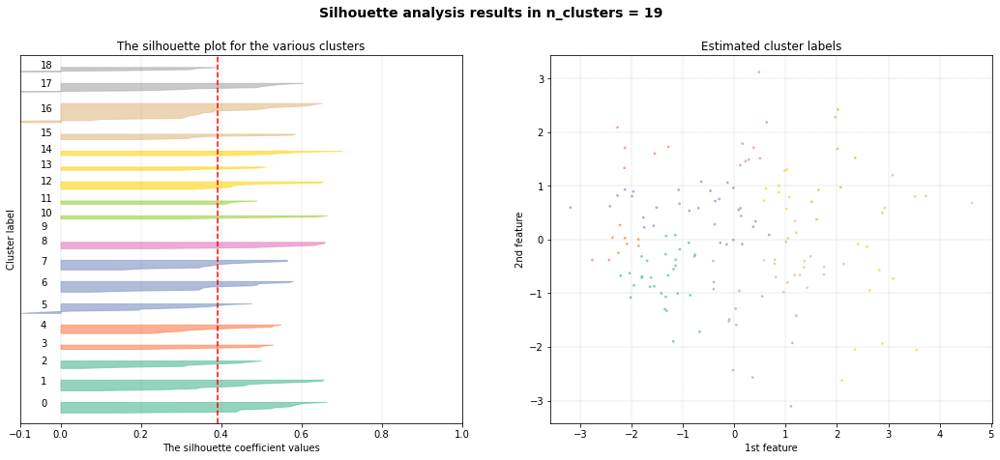


[clusteval] >Fit using agglomerative with metric: euclidean, and linkage: ward
[clusteval] >Evaluate using dbindex.


100%|██████████| 23/23 [00:00<00:00, 145.60it/s]

[clusteval] >Compute dendrogram threshold.
[clusteval] >Optimal number clusters detected: [24].
[clusteval] >Fin.
[clusteval] >Estimated number of n_clusters: 24, average silhouette_score=0.386


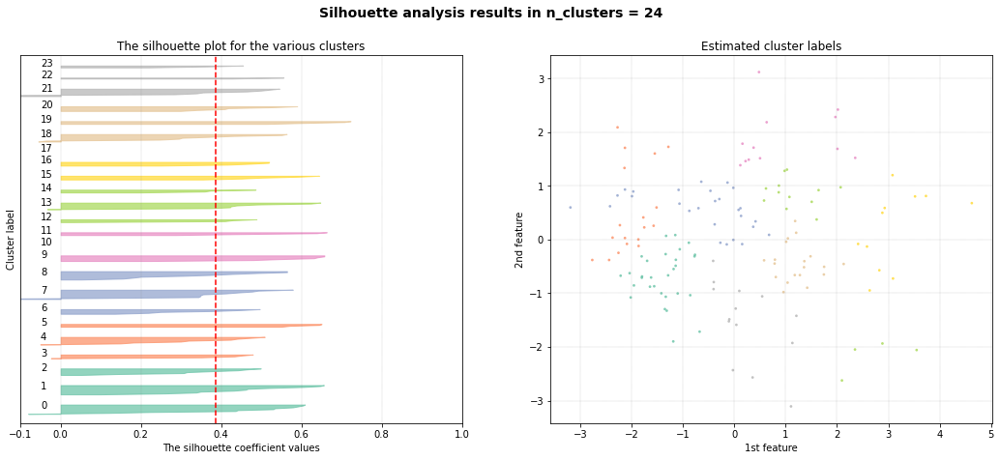


[clusteval] >Fit using dbscan with metric: euclidean, and linkage: ward
[clusteval] >Gridsearch across epsilon..
[clusteval] >Evaluate using silhouette..


100%|██████████| 245/245 [00:27<00:00,  8.95it/s]


[clusteval] >Compute dendrogram threshold.
[clusteval] >Optimal number clusters detected: [2].
[clusteval] >Fin.


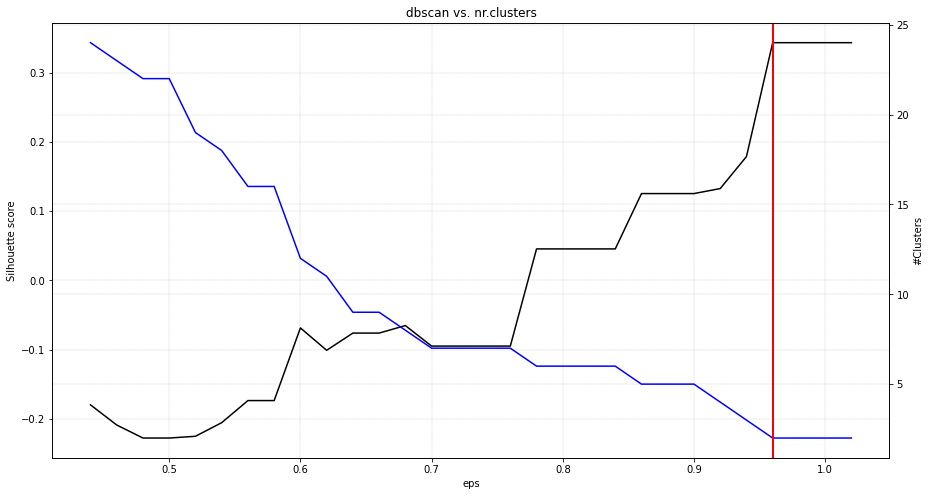

[clusteval] >Estimated number of n_clusters: 2, average silhouette_score=0.343


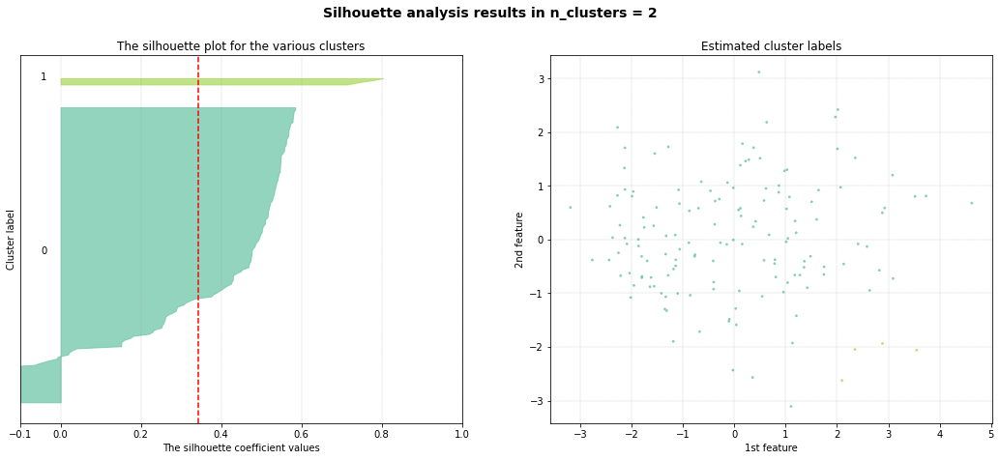


[clusteval] >Fit using hdbscan with metric: euclidean, and linkage: ward
[clusteval] >Estimated number of clusters: 20
[clusteval] >Silhouette Coefficient: 0.077
[clusteval] >Compute dendrogram threshold.
[clusteval] >Optimal number clusters detected: [21].
[clusteval] >Fin.
[clusteval] >Estimated number of n_clusters: 20, average silhouette_score=0.051


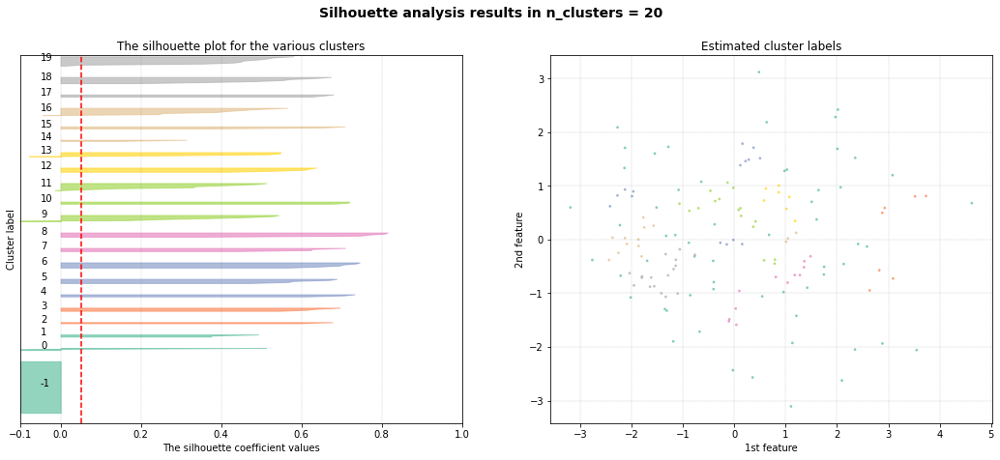

In [10]:
clustevalres(df)

damping: 0.5


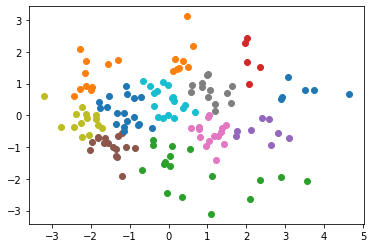

Sillhouette score:  0.5166677624633351
Percentage score:  0.7583338812316676
Number of clusters:  13
---
damping: 0.6


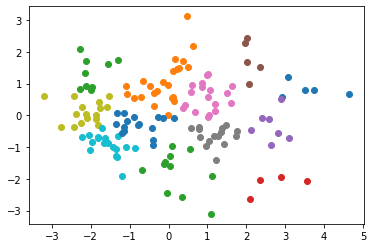

Sillhouette score:  0.5215114593873114
Percentage score:  0.7607557296936557
Number of clusters:  13
---
damping: 0.7


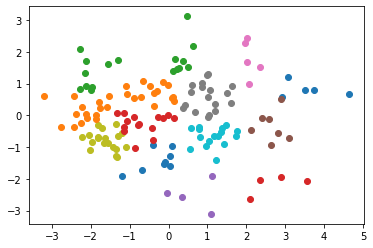

Sillhouette score:  0.5315461755865727
Percentage score:  0.7657730877932863
Number of clusters:  14
---
damping: 0.8


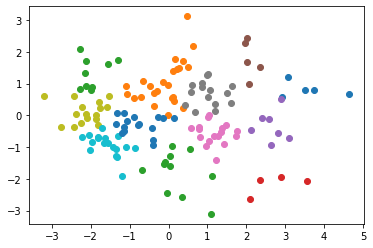

Sillhouette score:  0.5232086434522967
Percentage score:  0.7616043217261483
Number of clusters:  13
---
damping: 0.9


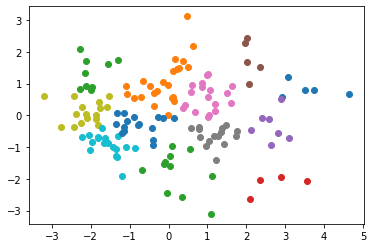

Sillhouette score:  0.5215114593873114
Percentage score:  0.7607557296936557
Number of clusters:  13
---


In [11]:
vary_damping(df, cluster_with_affinity_propagation)

n: 2


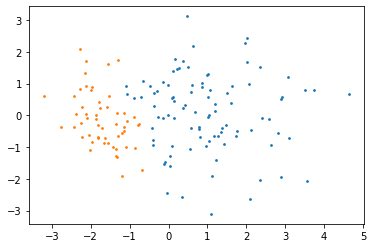

Sillhouette score:  0.5062923554718873
Percentage score:  0.7531461777359436
---
n: 3


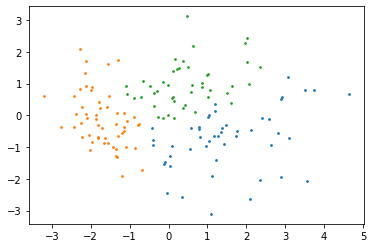

Sillhouette score:  0.4921065327641943
Percentage score:  0.7460532663820971
---
n: 4


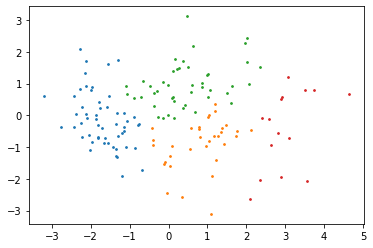

Sillhouette score:  0.5258051683554607
Percentage score:  0.7629025841777304
---
n: 5


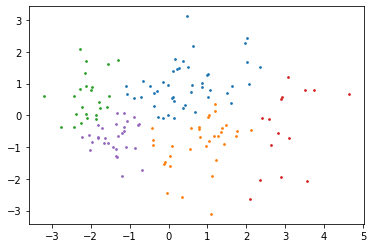

Sillhouette score:  0.45647284424724704
Percentage score:  0.7282364221236235
---
n: 6


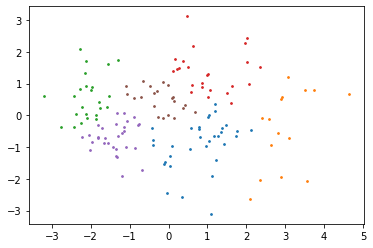

Sillhouette score:  0.45586992633956713
Percentage score:  0.7279349631697836
---
n: 7


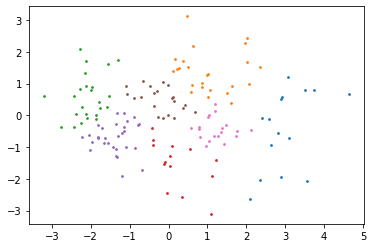

Sillhouette score:  0.4517511503914404
Percentage score:  0.7258755751957202
---
n: 8


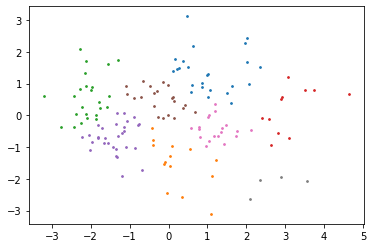

Sillhouette score:  0.48266762251892625
Percentage score:  0.7413338112594632
---
n: 9


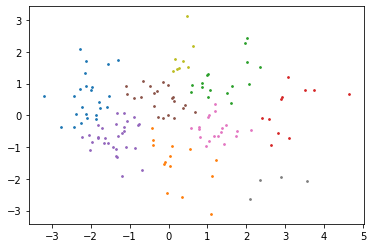

Sillhouette score:  0.4986214314294132
Percentage score:  0.7493107157147065
---
n: 10


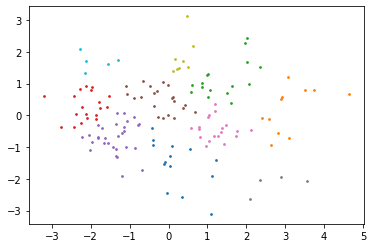

Sillhouette score:  0.5006796690800382
Percentage score:  0.7503398345400192
---
n: 11


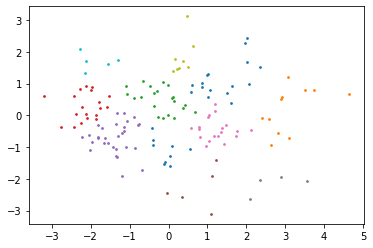

Sillhouette score:  0.5068650060760775
Percentage score:  0.7534325030380388
---
n: 12


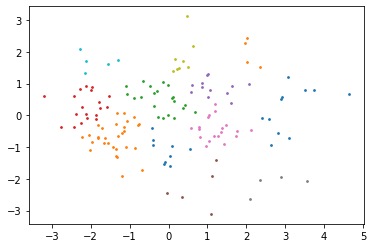

Sillhouette score:  0.5210032151262627
Percentage score:  0.7605016075631313
---
n: 13


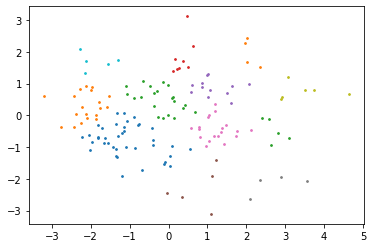

Sillhouette score:  0.5294712677340847
Percentage score:  0.7647356338670424
---
n: 14


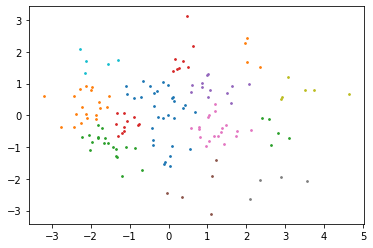

Sillhouette score:  0.4994343318373935
Percentage score:  0.7497171659186967
---


In [12]:
vary_n_of_clusters(df, agglomerative_clustering)

n: 2


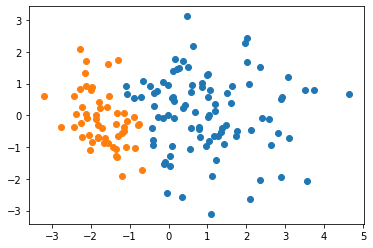

Sillhouette score:  0.5062923554718873
Percentage score:  0.7531461777359436
---
n: 3


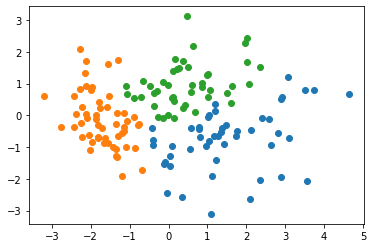

Sillhouette score:  0.4921065327641943
Percentage score:  0.7460532663820971
---
n: 4


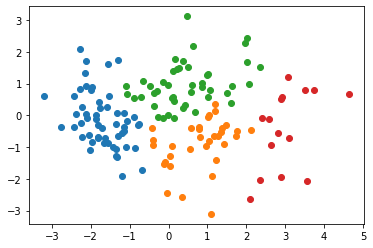

Sillhouette score:  0.5258051683554607
Percentage score:  0.7629025841777304
---
n: 5


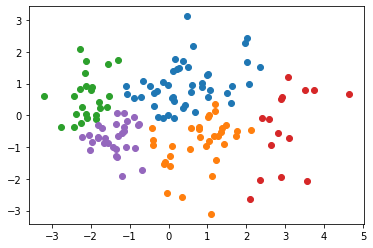

Sillhouette score:  0.45647284424724704
Percentage score:  0.7282364221236235
---
n: 6


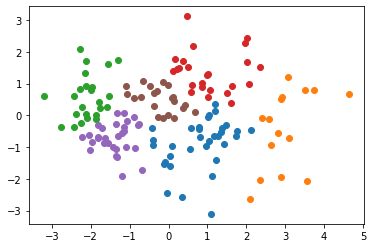

Sillhouette score:  0.45586992633956713
Percentage score:  0.7279349631697836
---
n: 7


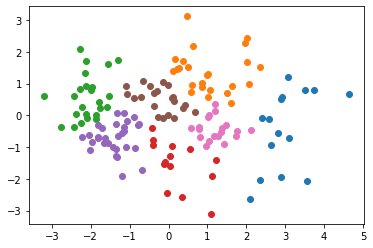

Sillhouette score:  0.4517511503914404
Percentage score:  0.7258755751957202
---
n: 8


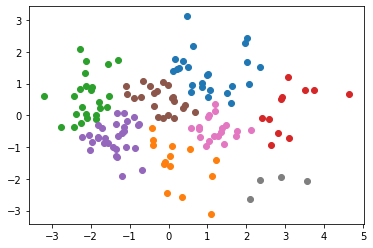

Sillhouette score:  0.48266762251892625
Percentage score:  0.7413338112594632
---
n: 9


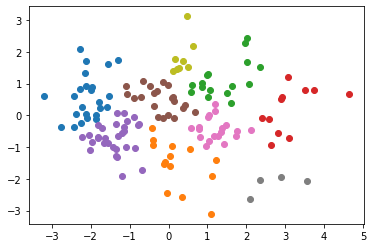

Sillhouette score:  0.4986214314294132
Percentage score:  0.7493107157147065
---
n: 10


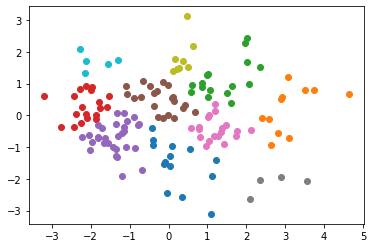

Sillhouette score:  0.5006796690800382
Percentage score:  0.7503398345400192
---
n: 11


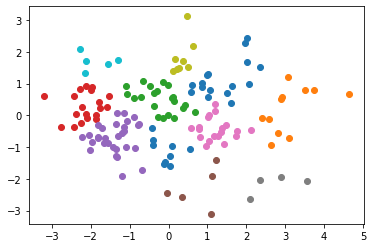

Sillhouette score:  0.5068650060760775
Percentage score:  0.7534325030380388
---
n: 12


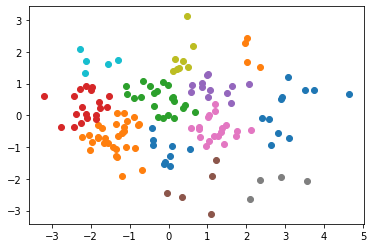

Sillhouette score:  0.5210032151262627
Percentage score:  0.7605016075631313
---
n: 13


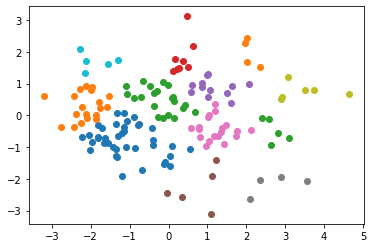

Sillhouette score:  0.5294712677340847
Percentage score:  0.7647356338670424
---
n: 14


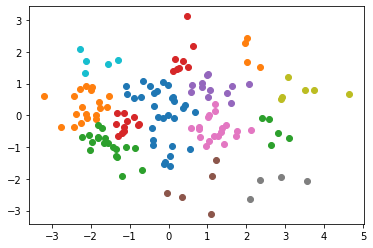

Sillhouette score:  0.4994343318373935
Percentage score:  0.7497171659186967
---


In [13]:
vary_n_of_clusters(df, cluster_with_birch)

n: 2


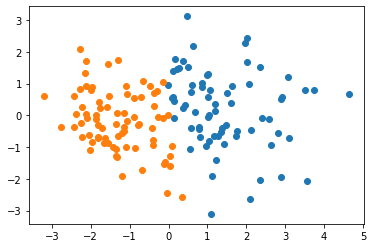

Sillhouette score:  0.5911934424622658
Percentage score:  0.7955967212311329
---
n: 3


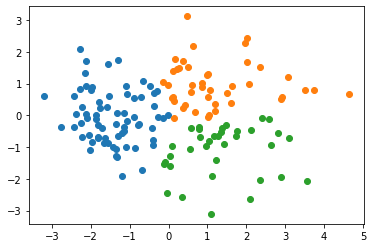

Sillhouette score:  0.5750034678360374
Percentage score:  0.7875017339180187
---
n: 4


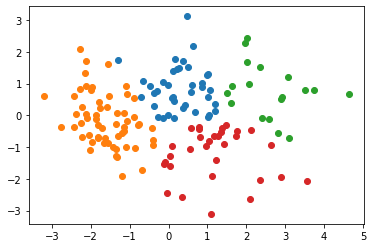

Sillhouette score:  0.5583437257755259
Percentage score:  0.779171862887763
---
n: 5


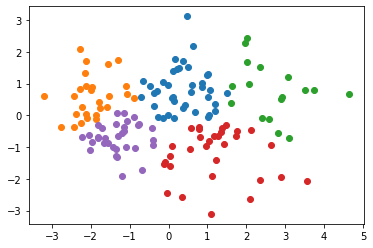

Sillhouette score:  0.5066770643695037
Percentage score:  0.7533385321847519
---
n: 6


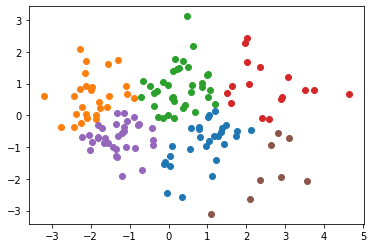

Sillhouette score:  0.5268380545662504
Percentage score:  0.7634190272831252
---
n: 7


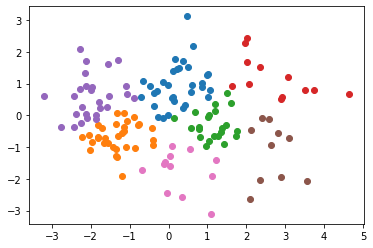

Sillhouette score:  0.5148789098335044
Percentage score:  0.7574394549167522
---
n: 8


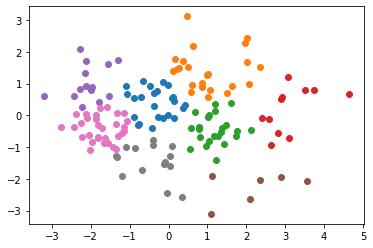

Sillhouette score:  0.5411669782737956
Percentage score:  0.7705834891368978
---
n: 9


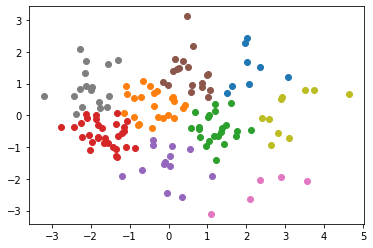

Sillhouette score:  0.5409280131471111
Percentage score:  0.7704640065735555
---
n: 10


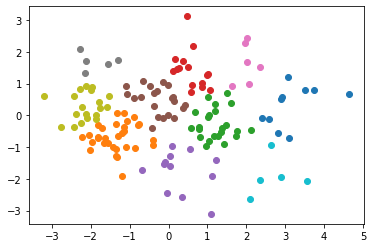

Sillhouette score:  0.5360177145972855
Percentage score:  0.7680088572986428
---
n: 11


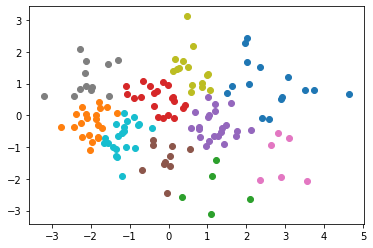

Sillhouette score:  0.5216977452016114
Percentage score:  0.7608488726008057
---
n: 12


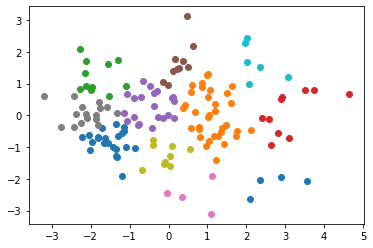

Sillhouette score:  0.5188720435466242
Percentage score:  0.759436021773312
---
n: 13


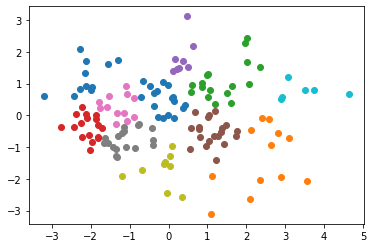

Sillhouette score:  0.5372233963857699
Percentage score:  0.768611698192885
---
n: 14


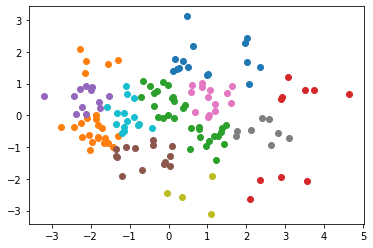

Sillhouette score:  0.525067839837282
Percentage score:  0.762533919918641
---


In [14]:
vary_n_of_clusters(df, cluster_with_kmeans)

n: 2


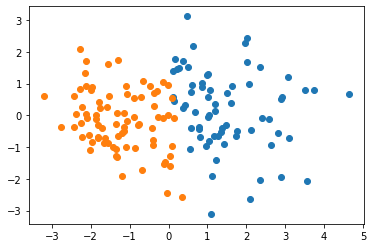

Sillhouette score:  0.592990770311364
Percentage score:  0.796495385155682
---
n: 3


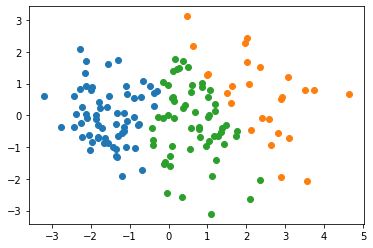

Sillhouette score:  0.49016156636909003
Percentage score:  0.745080783184545
---
n: 4


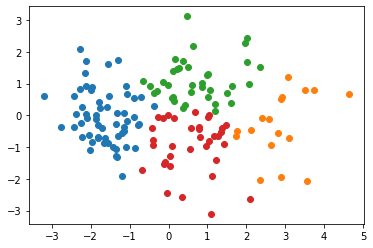

Sillhouette score:  0.5611435928100387
Percentage score:  0.7805717964050194
---
n: 5


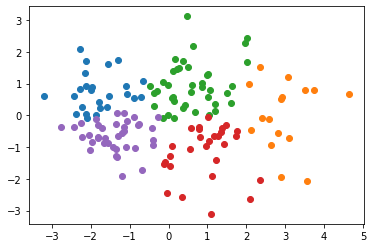

Sillhouette score:  0.5100616916853994
Percentage score:  0.7550308458426997
---
n: 6


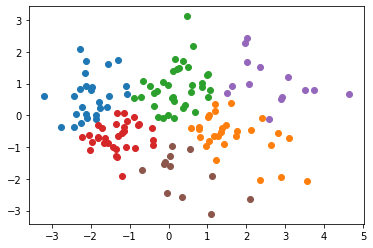

Sillhouette score:  0.5082826756999861
Percentage score:  0.754141337849993
---
n: 7


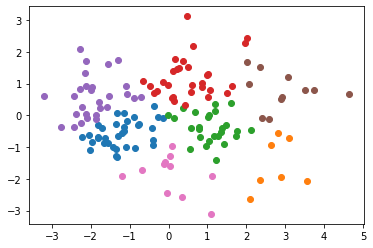

Sillhouette score:  0.5094537215387599
Percentage score:  0.75472686076938
---
n: 8


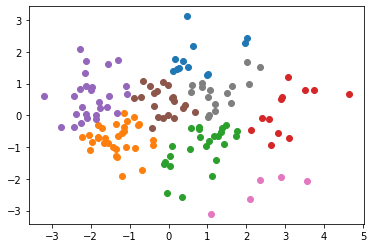

Sillhouette score:  0.48785214611130984
Percentage score:  0.743926073055655
---
n: 9


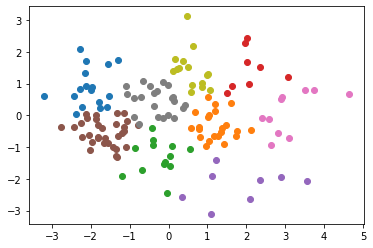

Sillhouette score:  0.5264386060170921
Percentage score:  0.7632193030085461
---
n: 10


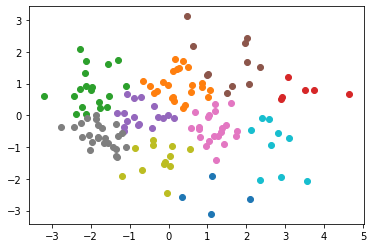

Sillhouette score:  0.5045650412821386
Percentage score:  0.7522825206410693
---
n: 11


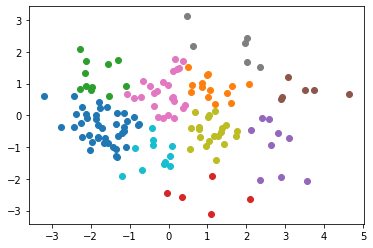

Sillhouette score:  0.5059281380902342
Percentage score:  0.7529640690451171
---
n: 12


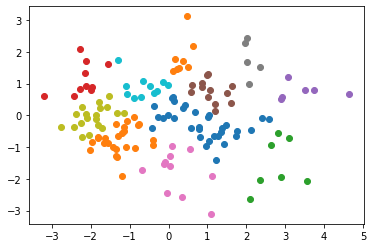

Sillhouette score:  0.51367138040284
Percentage score:  0.7568356902014199
---
n: 13


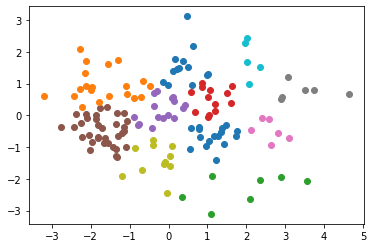

Sillhouette score:  0.5244158793234961
Percentage score:  0.762207939661748
---
n: 14


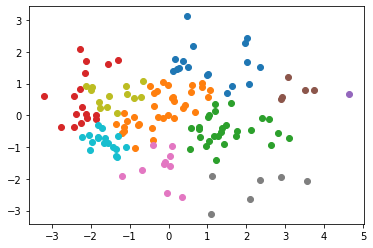

Sillhouette score:  0.4942729558443744
Percentage score:  0.7471364779221872
---


In [15]:
vary_n_of_clusters(df, cluster_with_mini_batch_kmeans)

n: 2


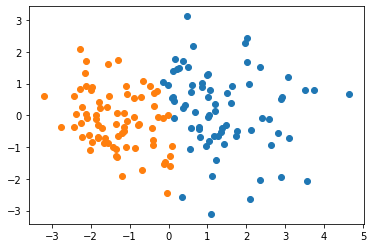

Sillhouette score:  0.586936276893525
Percentage score:  0.7934681384467626
---
n: 3


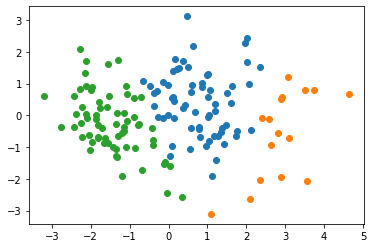

Sillhouette score:  0.5298782676998345
Percentage score:  0.7649391338499172
---
n: 4


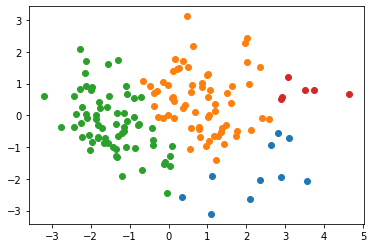

Sillhouette score:  0.49660177437345054
Percentage score:  0.7483008871867253
---
n: 5


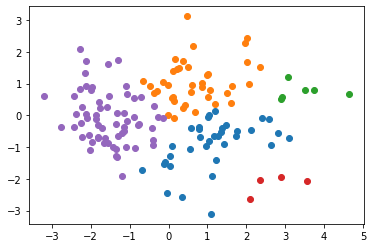

Sillhouette score:  0.5307631892765509
Percentage score:  0.7653815946382754
---
n: 6


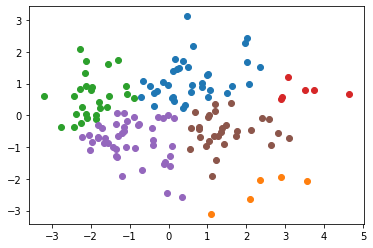

Sillhouette score:  0.48629529122597603
Percentage score:  0.743147645612988
---
n: 7


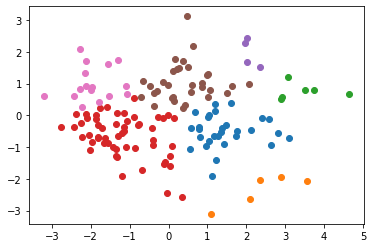

Sillhouette score:  0.4517136342365799
Percentage score:  0.72585681711829
---
n: 8


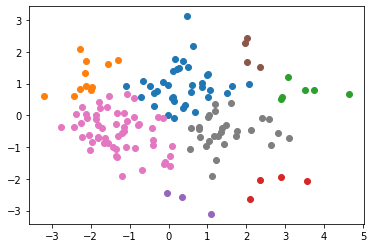

Sillhouette score:  0.4550411843553244
Percentage score:  0.7275205921776622
---
n: 9


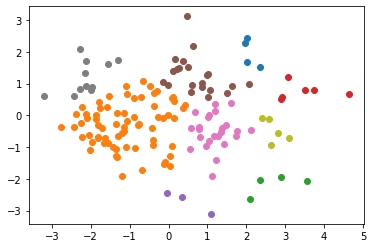

Sillhouette score:  0.38937319169527346
Percentage score:  0.6946865958476367
---
n: 10


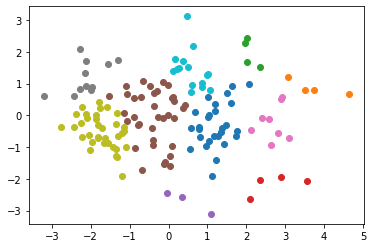

Sillhouette score:  0.4471314165027514
Percentage score:  0.7235657082513757
---
n: 11


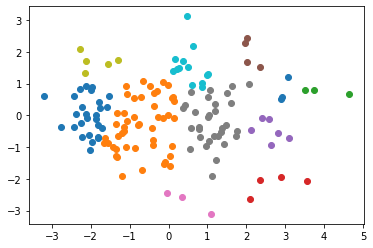

Sillhouette score:  0.3548904507767617
Percentage score:  0.6774452253883808
---
n: 12


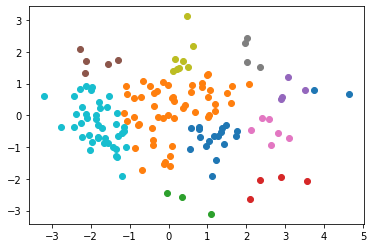

Sillhouette score:  0.42526521560658
Percentage score:  0.71263260780329
---
n: 13


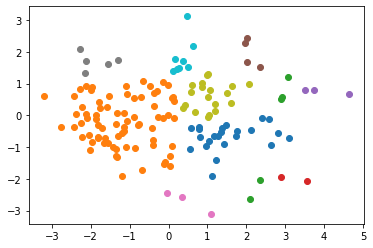

Sillhouette score:  0.34618143557758774
Percentage score:  0.6730907177887939
---
n: 14


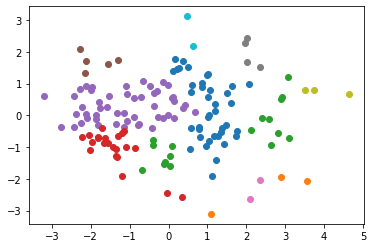

Sillhouette score:  0.2896188103341168
Percentage score:  0.6448094051670584
---


In [16]:
vary_n_of_clusters(df, spectral_clustering)

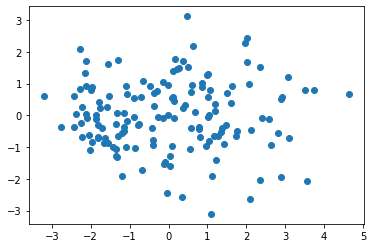

In [17]:
try: mean_shift_clustering(df)
except: pass

n: 4


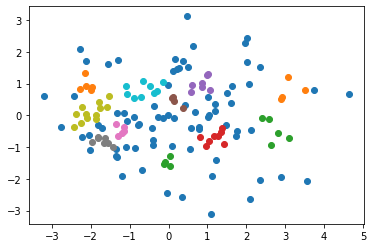

Sillhouette score:  -0.0709288145359493
Percentage score:  0.4645355927320253
---
n: 5


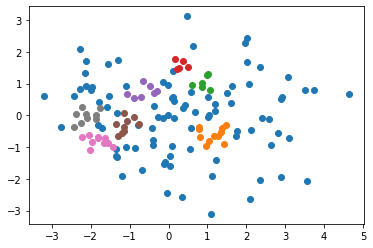

Sillhouette score:  -0.1960699723631947
Percentage score:  0.40196501381840266
---
n: 6


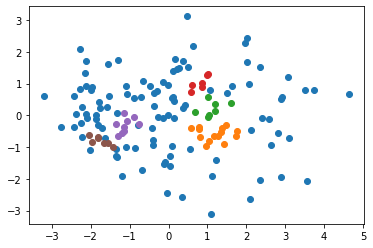

Sillhouette score:  -0.3698530779986872
Percentage score:  0.31507346100065636
---
n: 7


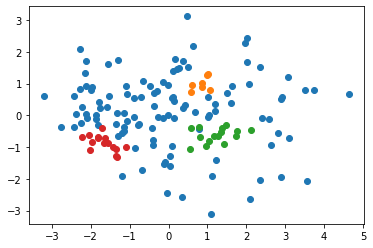

Sillhouette score:  -0.32033095595850675
Percentage score:  0.3398345220207466
---
n: 8


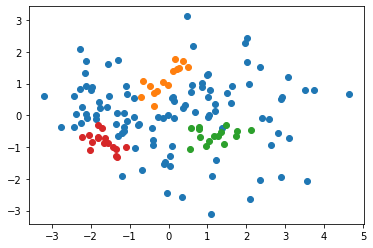

Sillhouette score:  -0.2376429368151507
Percentage score:  0.38117853159242465
---
n: 9


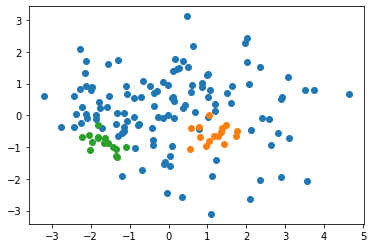

Sillhouette score:  -0.2722772941698456
Percentage score:  0.3638613529150772
---
n: 10


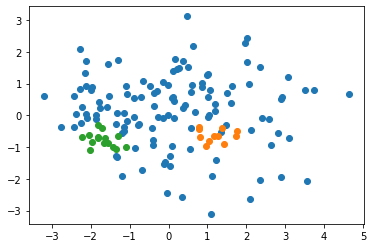

Sillhouette score:  -0.3235922342324716
Percentage score:  0.33820388288376424
---
n: 11


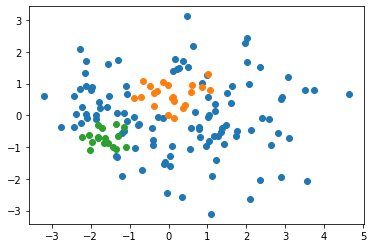

Sillhouette score:  -0.2158209721353821
Percentage score:  0.39208951393230895
---
n: 12


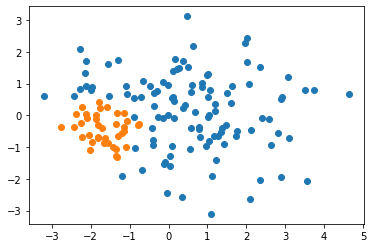

Sillhouette score:  0.28695048058940603
Percentage score:  0.643475240294703
---
n: 13


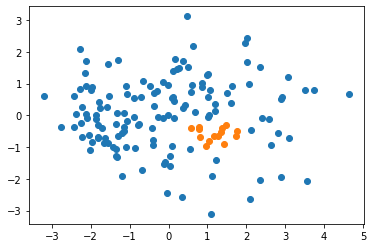

Sillhouette score:  -0.11083023023675126
Percentage score:  0.4445848848816244
---
n: 14


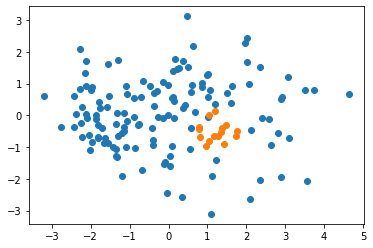

Sillhouette score:  -0.09761344708499806
Percentage score:  0.45119327645750096
---


In [18]:
vary_min_samples(df, cluster_with_optics)

---

# 2. Samskrit and Hindi

In [19]:
sa_hi_graph = load_graph('sa', 'hi')
df = apply_pca(make_df(sa_hi_graph))


[clusteval] >Fit using agglomerative with metric: euclidean, and linkage: ward
[clusteval] >Evaluate using silhouette.


100%|██████████| 23/23 [00:00<00:00, 55.11it/s]


[clusteval] >Compute dendrogram threshold.
[clusteval] >Optimal number clusters detected: [3].
[clusteval] >Fin.
[clusteval] >Estimated number of n_clusters: 3, average silhouette_score=0.364


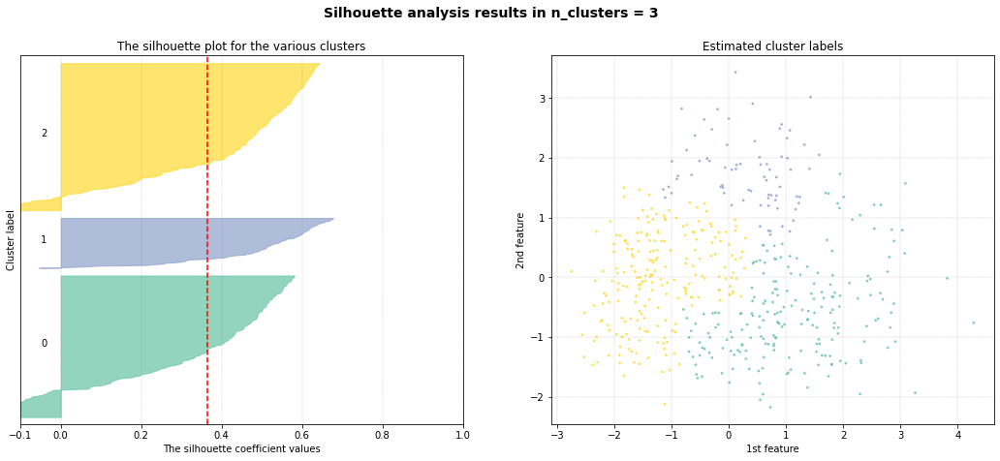


[clusteval] >Fit using agglomerative with metric: euclidean, and linkage: ward
[clusteval] >Evaluate using dbindex.


100%|██████████| 23/23 [00:00<00:00, 74.27it/s]


[clusteval] >Compute dendrogram threshold.
[clusteval] >Optimal number clusters detected: [24].
[clusteval] >Fin.
[clusteval] >Estimated number of n_clusters: 24, average silhouette_score=0.320


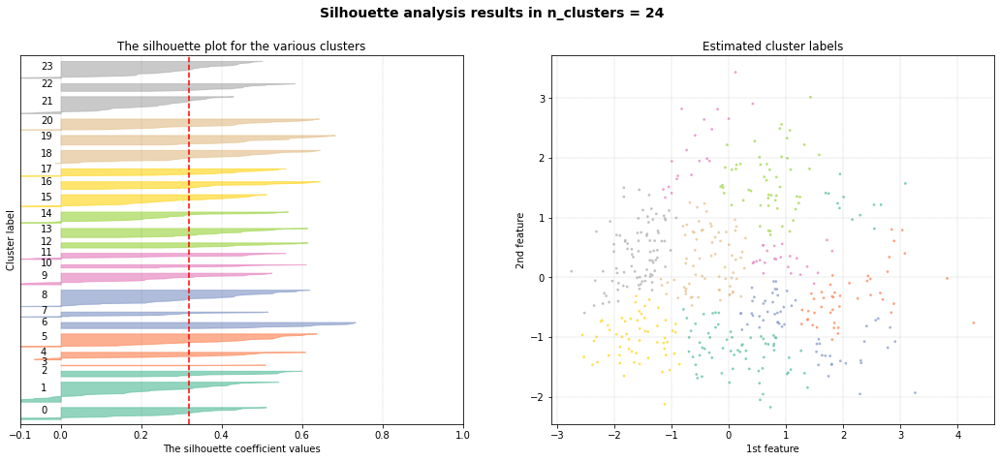


[clusteval] >Fit using dbscan with metric: euclidean, and linkage: ward
[clusteval] >Gridsearch across epsilon..
[clusteval] >Evaluate using silhouette..


100%|██████████| 245/245 [00:28<00:00,  8.61it/s]


[clusteval] >Compute dendrogram threshold.

[clusteval] >Fit using hdbscan with metric: euclidean, and linkage: ward
[clusteval] >Estimated number of clusters: 76
[clusteval] >Silhouette Coefficient: 0.138
[clusteval] >Compute dendrogram threshold.
[clusteval] >Optimal number clusters detected: [77].
[clusteval] >Fin.
[clusteval] >Estimated number of n_clusters: 76, average silhouette_score=0.121


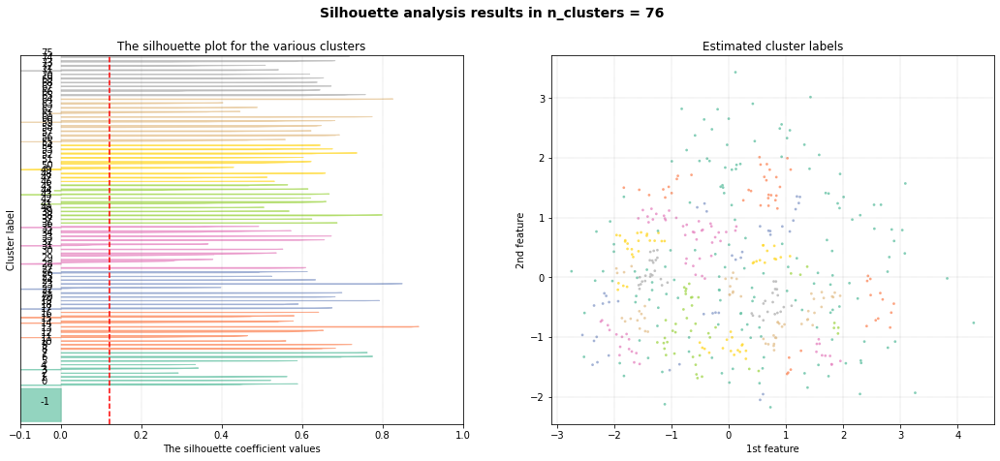

In [20]:
clustevalres(df)

damping: 0.5


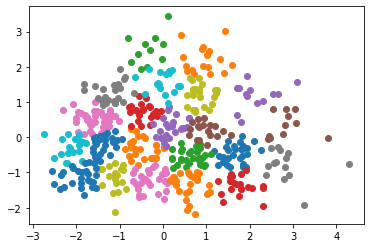

Sillhouette score:  0.4912559196849113
Percentage score:  0.7456279598424557
Number of clusters:  22
---
damping: 0.6


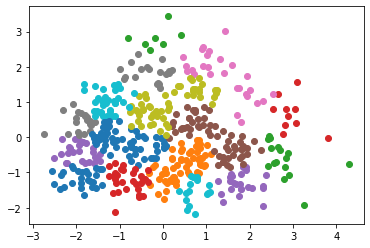

Sillhouette score:  0.5034603201453038
Percentage score:  0.7517301600726519
Number of clusters:  21
---
damping: 0.7


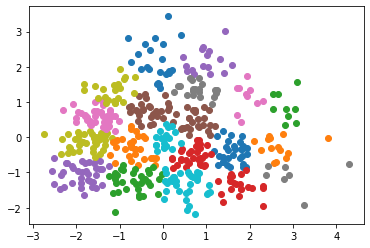

Sillhouette score:  0.5083765119363047
Percentage score:  0.7541882559681523
Number of clusters:  21
---
damping: 0.8


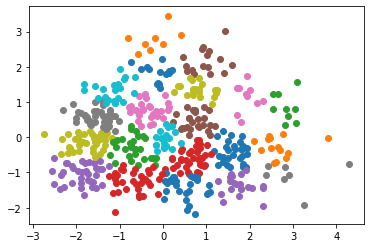

Sillhouette score:  0.5064786600113984
Percentage score:  0.7532393300056992
Number of clusters:  21
---
damping: 0.9


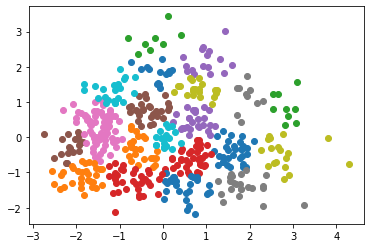

Sillhouette score:  0.5093169867768171
Percentage score:  0.7546584933884086
Number of clusters:  21
---


In [21]:
vary_damping(df, cluster_with_affinity_propagation)

n: 2


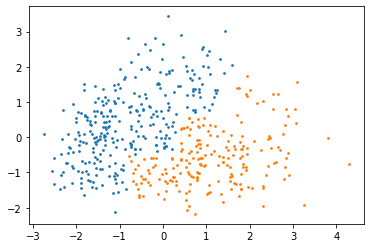

Sillhouette score:  0.4963323537002712
Percentage score:  0.7481661768501355
---
n: 3


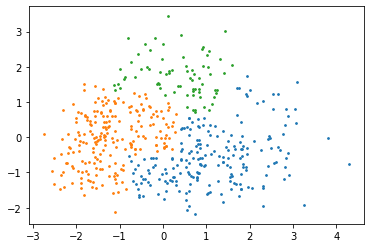

Sillhouette score:  0.5031054383852664
Percentage score:  0.7515527191926332
---
n: 4


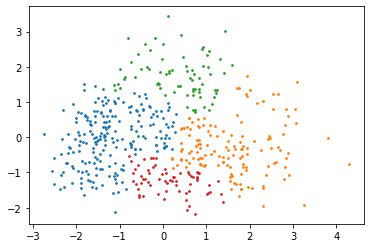

Sillhouette score:  0.4042908451012502
Percentage score:  0.7021454225506251
---
n: 5


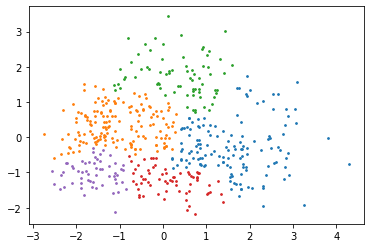

Sillhouette score:  0.39719407734855433
Percentage score:  0.6985970386742771
---
n: 6


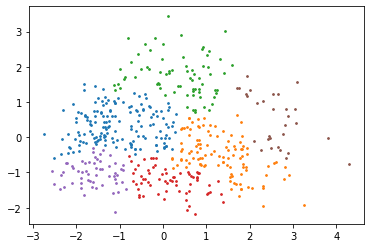

Sillhouette score:  0.41325639028030386
Percentage score:  0.706628195140152
---
n: 7


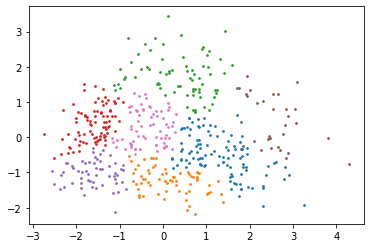

Sillhouette score:  0.4480265235371366
Percentage score:  0.7240132617685683
---
n: 8


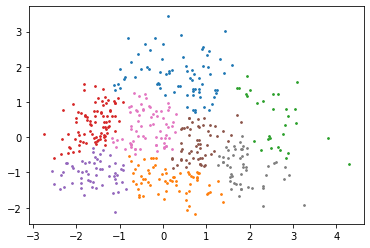

Sillhouette score:  0.46766808968501805
Percentage score:  0.733834044842509
---
n: 9


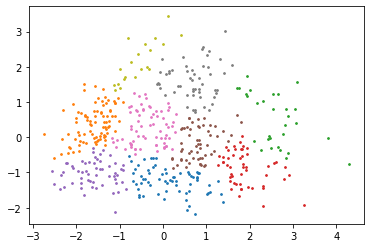

Sillhouette score:  0.4697221726530011
Percentage score:  0.7348610863265006
---
n: 10


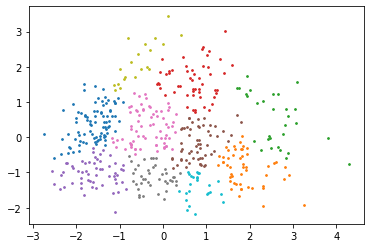

Sillhouette score:  0.457428748054714
Percentage score:  0.728714374027357
---
n: 11


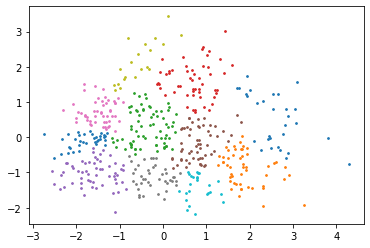

Sillhouette score:  0.4241221920226075
Percentage score:  0.7120610960113037
---
n: 12


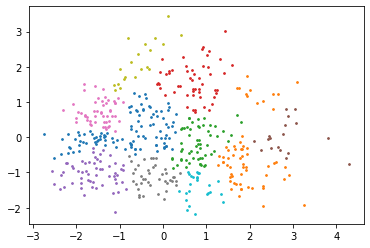

Sillhouette score:  0.4257219740713316
Percentage score:  0.7128609870356658
---
n: 13


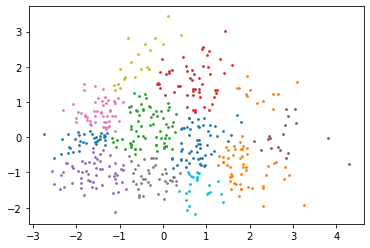

Sillhouette score:  0.4250058041243922
Percentage score:  0.7125029020621961
---
n: 14


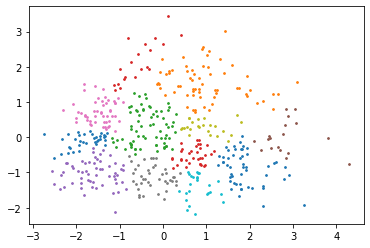

Sillhouette score:  0.4176032956404566
Percentage score:  0.7088016478202284
---


In [22]:
vary_n_of_clusters(df, agglomerative_clustering)

n: 2


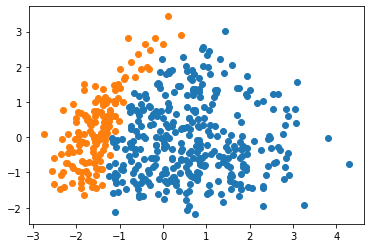

Sillhouette score:  0.4262176631290942
Percentage score:  0.7131088315645471
---
n: 3


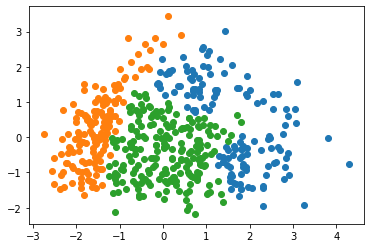

Sillhouette score:  0.369930433324168
Percentage score:  0.684965216662084
---
n: 4


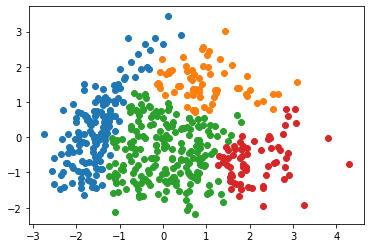

Sillhouette score:  0.42664121260870896
Percentage score:  0.7133206063043545
---
n: 5


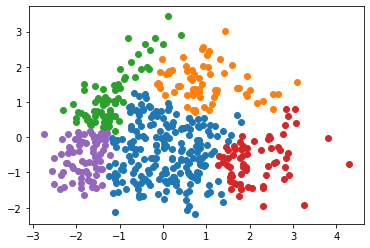

Sillhouette score:  0.38629684376032075
Percentage score:  0.6931484218801603
---
n: 6


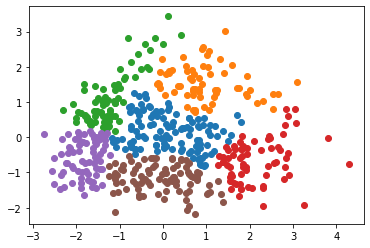

Sillhouette score:  0.43978603965623153
Percentage score:  0.7198930198281157
---
n: 7


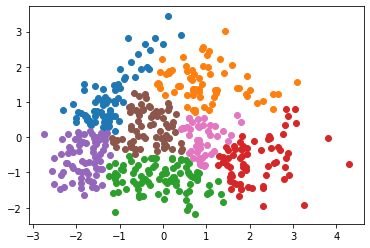

Sillhouette score:  0.40750734649817805
Percentage score:  0.703753673249089
---
n: 8


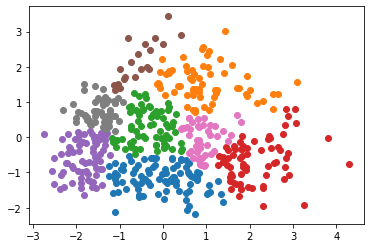

Sillhouette score:  0.40480056820407323
Percentage score:  0.7024002841020366
---
n: 9


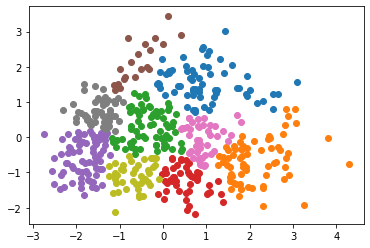

Sillhouette score:  0.4147871812788691
Percentage score:  0.7073935906394345
---
n: 10


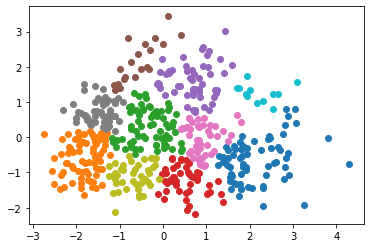

Sillhouette score:  0.4224757080995873
Percentage score:  0.7112378540497937
---
n: 11


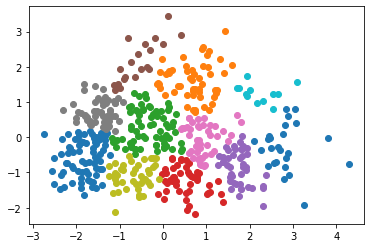

Sillhouette score:  0.4465173427945008
Percentage score:  0.7232586713972504
---
n: 12


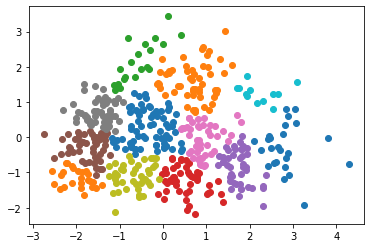

Sillhouette score:  0.45062350603105
Percentage score:  0.725311753015525
---
n: 13


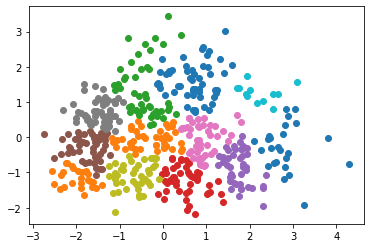

Sillhouette score:  0.4507660637689754
Percentage score:  0.7253830318844877
---
n: 14


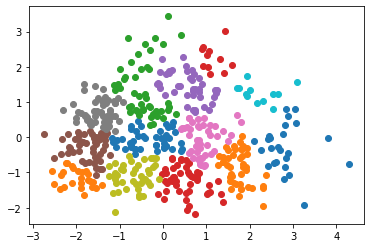

Sillhouette score:  0.45340250887905914
Percentage score:  0.7267012544395296
---


In [23]:
vary_n_of_clusters(df, cluster_with_birch)

n: 2


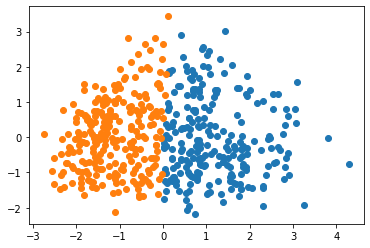

Sillhouette score:  0.5510471587686125
Percentage score:  0.7755235793843063
---
n: 3


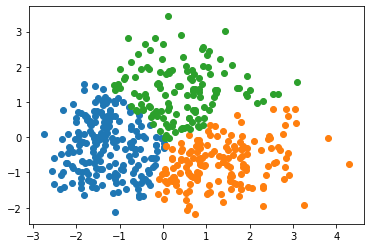

Sillhouette score:  0.5863029385607282
Percentage score:  0.7931514692803641
---
n: 4


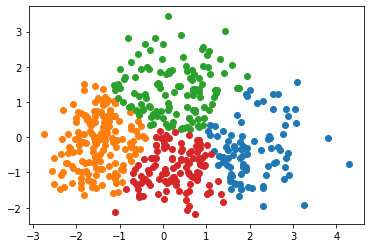

Sillhouette score:  0.5488685997727201
Percentage score:  0.77443429988636
---
n: 5


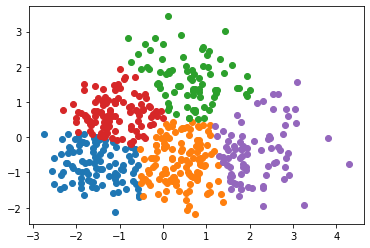

Sillhouette score:  0.5299593476101222
Percentage score:  0.7649796738050612
---
n: 6


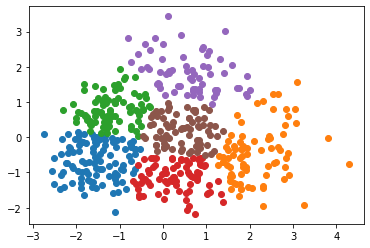

Sillhouette score:  0.5182552823224437
Percentage score:  0.7591276411612218
---
n: 7


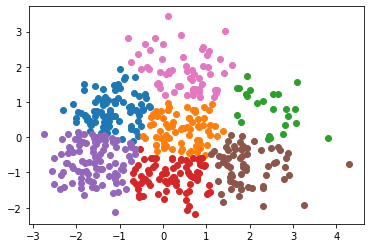

Sillhouette score:  0.5367283626157414
Percentage score:  0.7683641813078708
---
n: 8


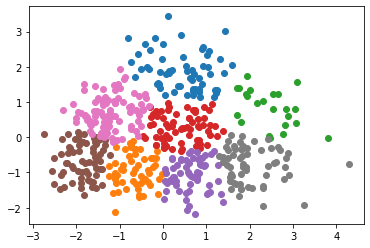

Sillhouette score:  0.5254765618754775
Percentage score:  0.7627382809377388
---
n: 9


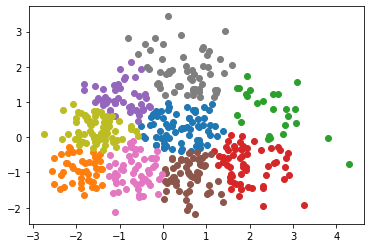

Sillhouette score:  0.5153593525531622
Percentage score:  0.7576796762765812
---
n: 10


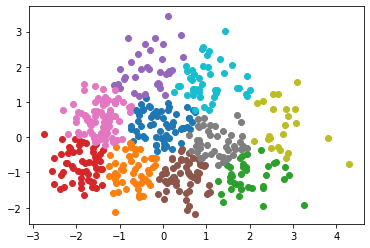

Sillhouette score:  0.5230281888559088
Percentage score:  0.7615140944279544
---
n: 11


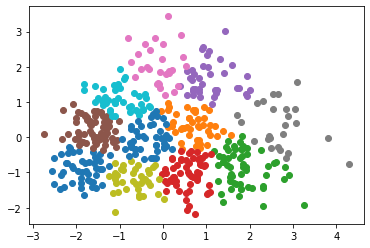

Sillhouette score:  0.5118259568849067
Percentage score:  0.7559129784424534
---
n: 12


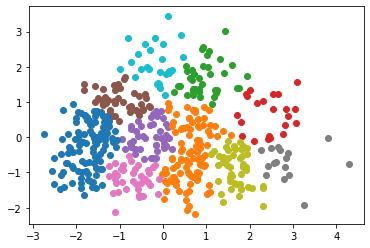

Sillhouette score:  0.517403328893034
Percentage score:  0.758701664446517
---
n: 13


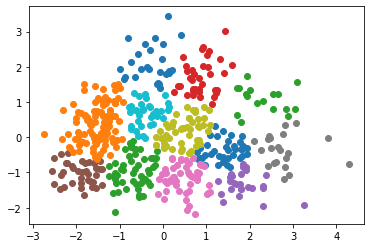

Sillhouette score:  0.5124978995016378
Percentage score:  0.7562489497508189
---
n: 14


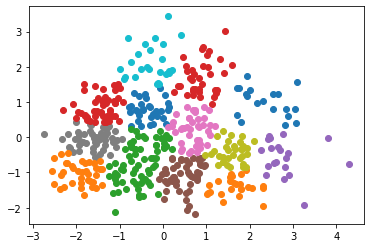

Sillhouette score:  0.5272169449991749
Percentage score:  0.7636084724995875
---


In [24]:
vary_n_of_clusters(df, cluster_with_kmeans)

n: 2


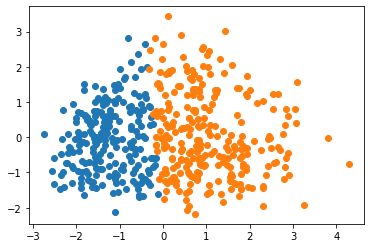

Sillhouette score:  0.5358205158551821
Percentage score:  0.767910257927591
---
n: 3


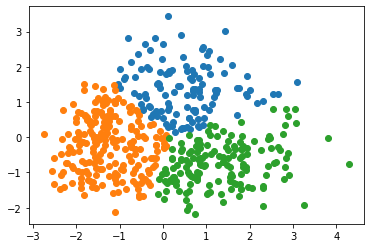

Sillhouette score:  0.5903440295291034
Percentage score:  0.7951720147645517
---
n: 4


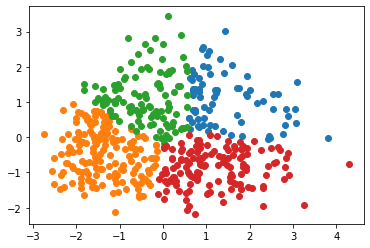

Sillhouette score:  0.5164917993972968
Percentage score:  0.7582458996986484
---
n: 5


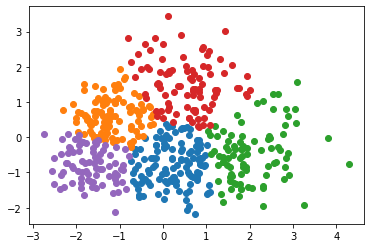

Sillhouette score:  0.529702702346784
Percentage score:  0.764851351173392
---
n: 6


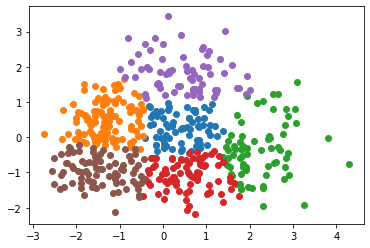

Sillhouette score:  0.5058023518110913
Percentage score:  0.7529011759055457
---
n: 7


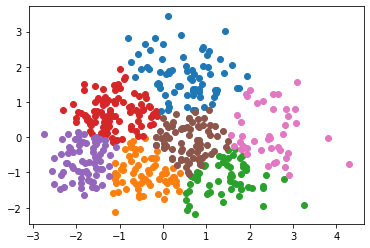

Sillhouette score:  0.511719068834102
Percentage score:  0.755859534417051
---
n: 8


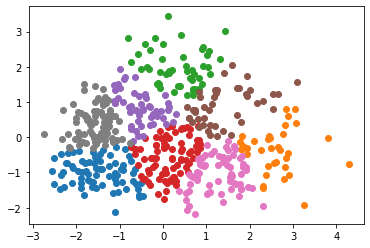

Sillhouette score:  0.46374193314149526
Percentage score:  0.7318709665707477
---
n: 9


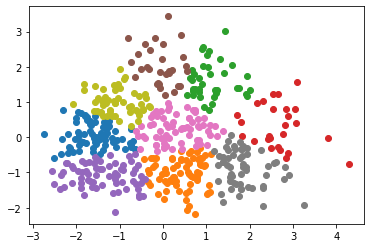

Sillhouette score:  0.49038773957858156
Percentage score:  0.7451938697892908
---
n: 10


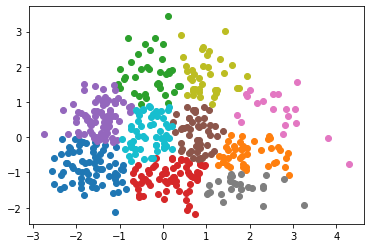

Sillhouette score:  0.5064557865017358
Percentage score:  0.7532278932508679
---
n: 11


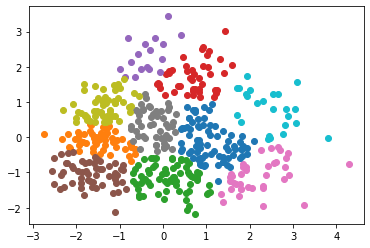

Sillhouette score:  0.4624704129970578
Percentage score:  0.7312352064985289
---
n: 12


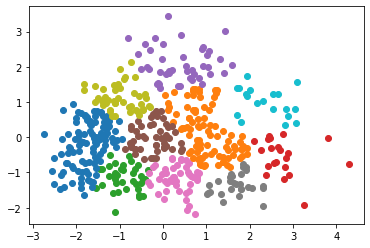

Sillhouette score:  0.5093204138362963
Percentage score:  0.7546602069181482
---
n: 13


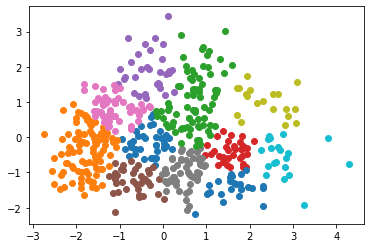

Sillhouette score:  0.5041980799092427
Percentage score:  0.7520990399546214
---
n: 14


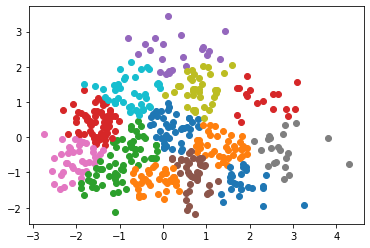

Sillhouette score:  0.4780874224967853
Percentage score:  0.7390437112483926
---


In [25]:
vary_n_of_clusters(df, cluster_with_mini_batch_kmeans)

n: 2


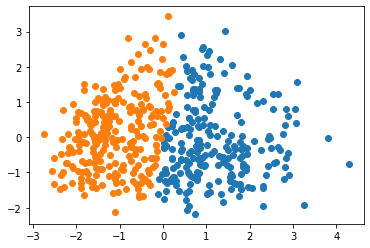

Sillhouette score:  0.5516482513569267
Percentage score:  0.7758241256784634
---
n: 3


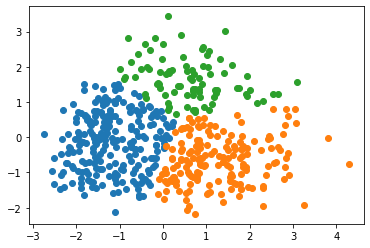

Sillhouette score:  0.5876155497024986
Percentage score:  0.7938077748512493
---
n: 4


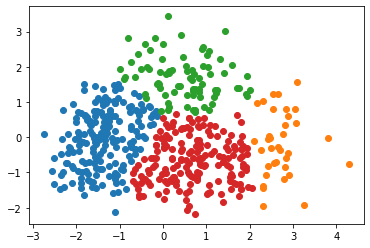

Sillhouette score:  0.5385939976426851
Percentage score:  0.7692969988213425
---
n: 5


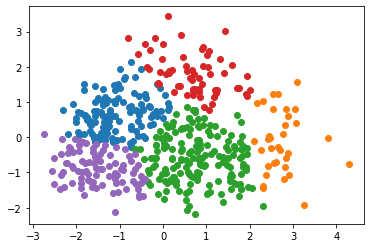

Sillhouette score:  0.497532429755828
Percentage score:  0.748766214877914
---
n: 6


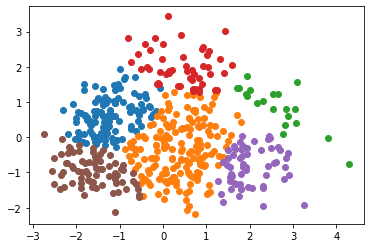

Sillhouette score:  0.4576812159724213
Percentage score:  0.7288406079862106
---
n: 7


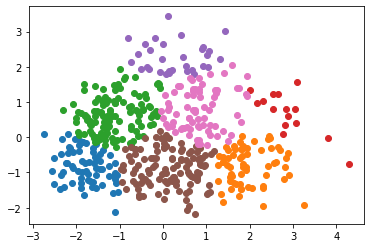

Sillhouette score:  0.5021935527636158
Percentage score:  0.7510967763818079
---
n: 8


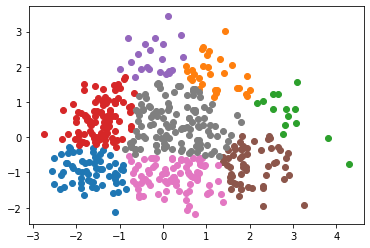

Sillhouette score:  0.45811875957056686
Percentage score:  0.7290593797852835
---
n: 9


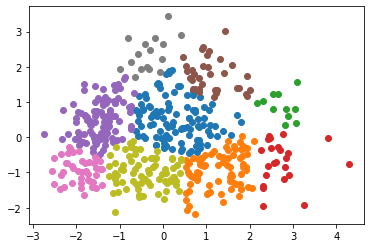

Sillhouette score:  0.43980903606429583
Percentage score:  0.7199045180321479
---
n: 10


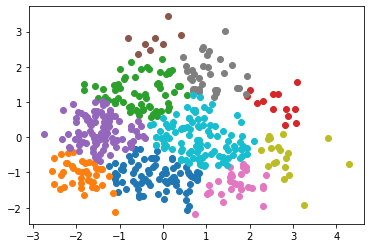

Sillhouette score:  0.4248449088843127
Percentage score:  0.7124224544421563
---
n: 11


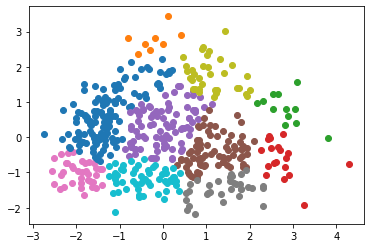

Sillhouette score:  0.43947290634298053
Percentage score:  0.7197364531714903
---
n: 12


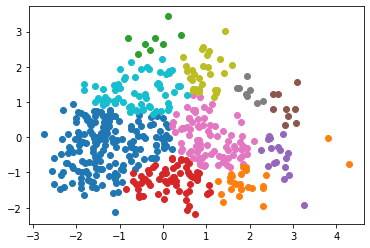

Sillhouette score:  0.3780354410622317
Percentage score:  0.6890177205311159
---
n: 13


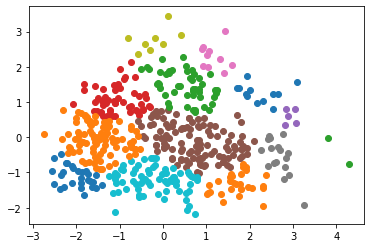

Sillhouette score:  0.37218925215074483
Percentage score:  0.6860946260753724
---
n: 14


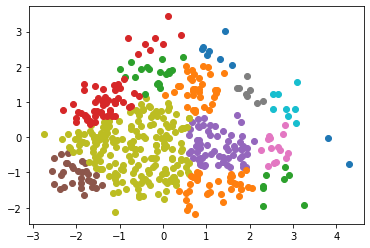

Sillhouette score:  0.2245858481995014
Percentage score:  0.6122929240997507
---


In [26]:
vary_n_of_clusters(df, spectral_clustering)

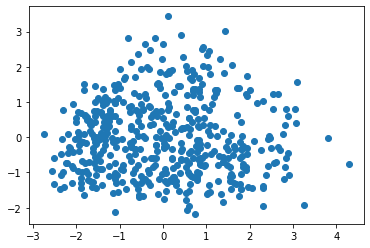

In [27]:
try: mean_shift_clustering(df)
except: pass

n: 4


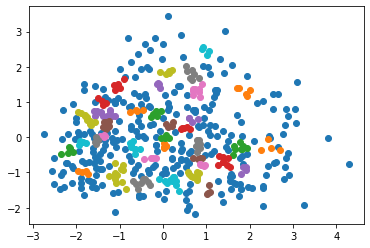

Sillhouette score:  -0.09657402287792523
Percentage score:  0.45171298856103737
---
n: 5


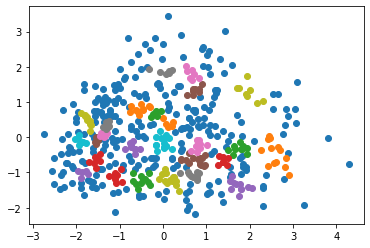

Sillhouette score:  -0.13111874666711543
Percentage score:  0.4344406266664423
---
n: 6


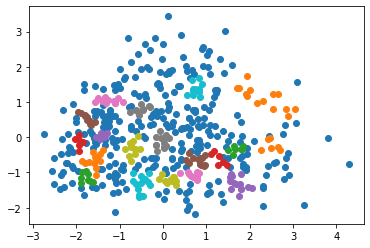

Sillhouette score:  -0.20276526034822276
Percentage score:  0.39861736982588863
---
n: 7


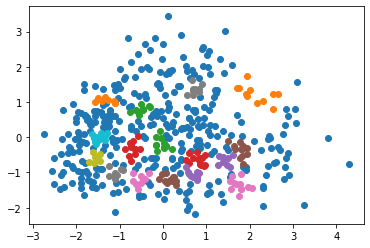

Sillhouette score:  -0.3033941614444676
Percentage score:  0.3483029192777662
---
n: 8


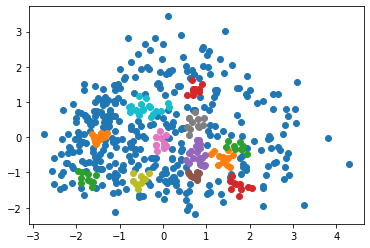

Sillhouette score:  -0.3705651195571588
Percentage score:  0.31471744022142056
---
n: 9


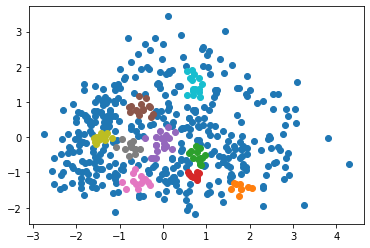

Sillhouette score:  -0.4567192932869678
Percentage score:  0.2716403533565161
---
n: 10


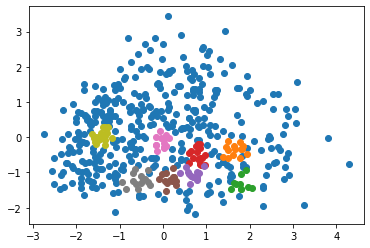

Sillhouette score:  -0.4073177416486656
Percentage score:  0.29634112917566724
---
n: 11


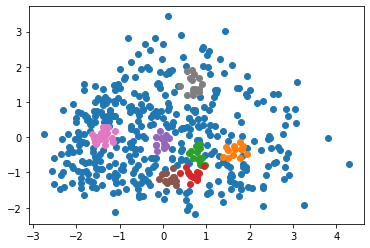

Sillhouette score:  -0.501231300285959
Percentage score:  0.24938434985702052
---
n: 12


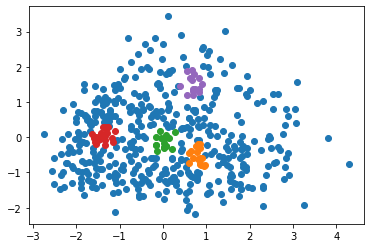

Sillhouette score:  -0.5734431715495918
Percentage score:  0.2132784142252041
---
n: 13


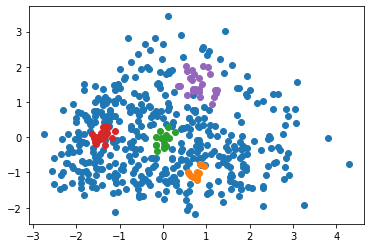

Sillhouette score:  -0.553991875757332
Percentage score:  0.223004062121334
---
n: 14


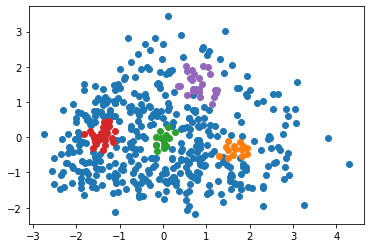

Sillhouette score:  -0.5092813211135836
Percentage score:  0.2453593394432082
---


In [28]:
vary_min_samples(df, cluster_with_optics)

---

# 3. Hindi and English

In [29]:
hi_en_graph = load_graph('hi', 'en')
df = apply_pca(make_df(hi_en_graph))


[clusteval] >Fit using agglomerative with metric: euclidean, and linkage: ward
[clusteval] >Evaluate using silhouette.


100%|██████████| 23/23 [00:04<00:00,  5.41it/s]


[clusteval] >Compute dendrogram threshold.
[clusteval] >Optimal number clusters detected: [3].
[clusteval] >Fin.
[clusteval] >Estimated number of n_clusters: 3, average silhouette_score=0.442


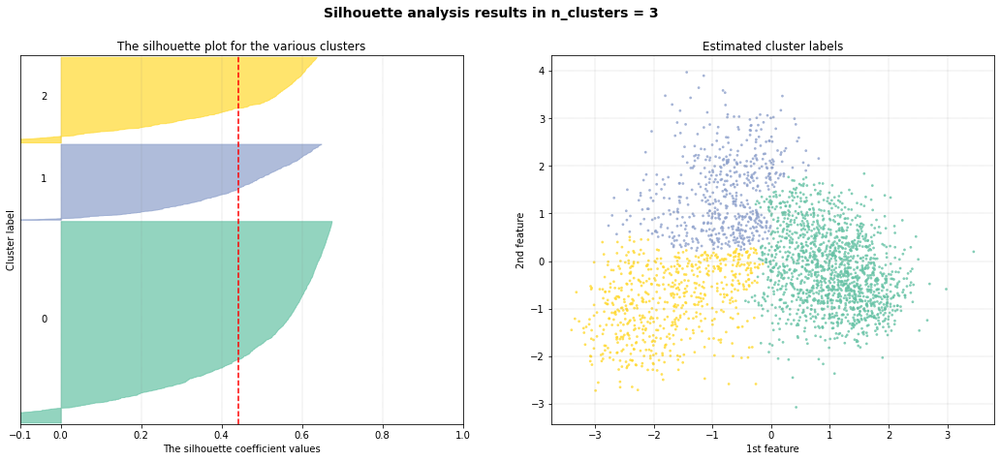


[clusteval] >Fit using agglomerative with metric: euclidean, and linkage: ward
[clusteval] >Evaluate using dbindex.


100%|██████████| 23/23 [00:01<00:00, 22.27it/s]


[clusteval] >Compute dendrogram threshold.
[clusteval] >Optimal number clusters detected: [24].
[clusteval] >Fin.
[clusteval] >Estimated number of n_clusters: 24, average silhouette_score=0.271


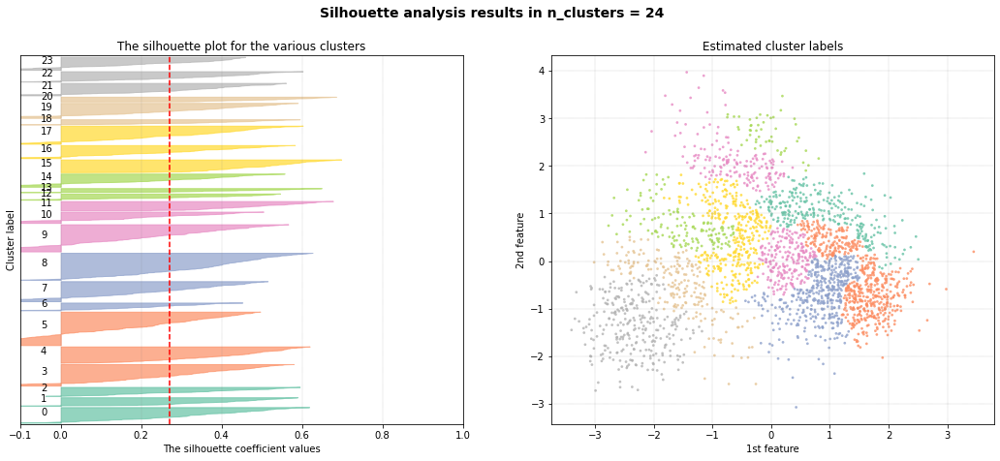


[clusteval] >Fit using dbscan with metric: euclidean, and linkage: ward
[clusteval] >Gridsearch across epsilon..
[clusteval] >Evaluate using silhouette..


100%|██████████| 245/245 [00:51<00:00,  4.80it/s]


[clusteval] >Compute dendrogram threshold.
[clusteval] >Optimal number clusters detected: [2].
[clusteval] >Fin.


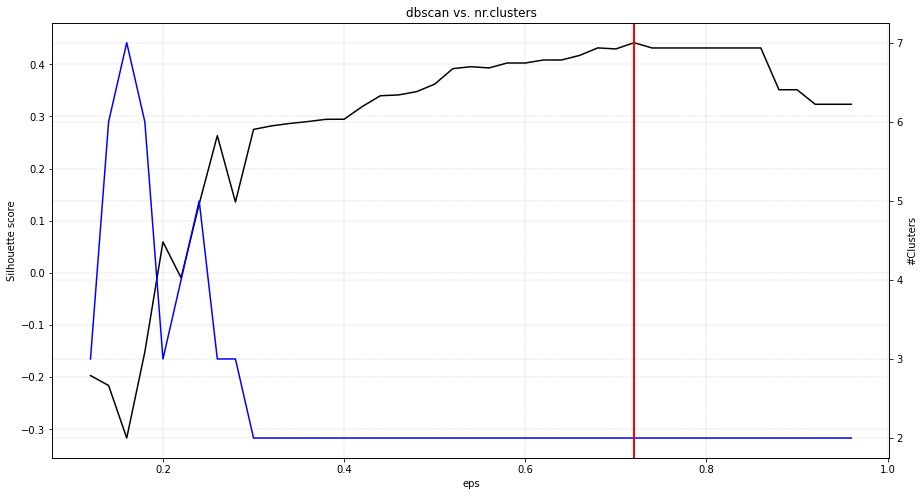

[clusteval] >Estimated number of n_clusters: 1, average silhouette_score=0.441


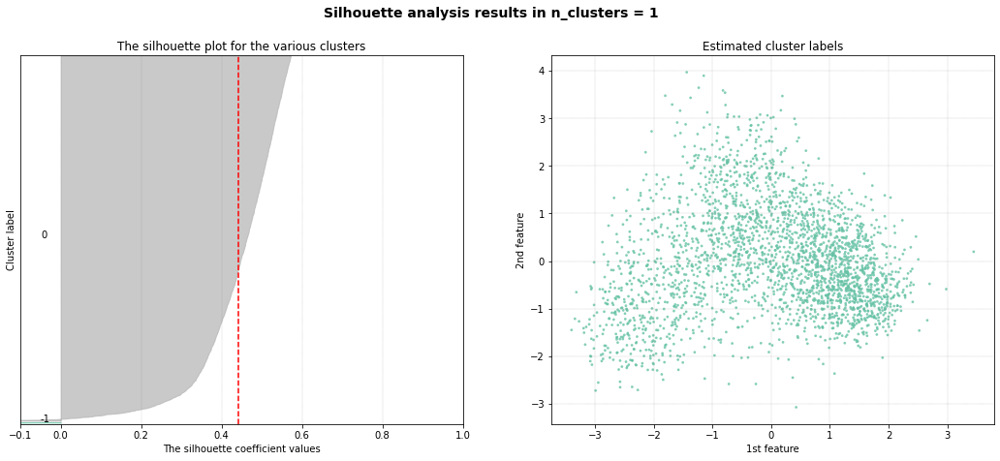


[clusteval] >Fit using hdbscan with metric: euclidean, and linkage: ward
[clusteval] >Estimated number of clusters: 415
[clusteval] >Silhouette Coefficient: 0.103
[clusteval] >Compute dendrogram threshold.
[clusteval] >Optimal number clusters detected: [416].
[clusteval] >Fin.
[clusteval] >Estimated number of n_clusters: 415, average silhouette_score=0.098


In [ ]:
clustevalres(df)

damping: 0.5


/usr/local/lib/python3.7/dist-packages/sklearn/cluster/_affinity_propagation.py:253: ConvergenceWarning:

Affinity propagation did not converge, this model will not have any cluster centers.

/usr/local/lib/python3.7/dist-packages/sklearn/cluster/_affinity_propagation.py:532: ConvergenceWarning:

This model does not have any cluster centers because affinity propagation did not converge. Labeling every sample as '-1'.



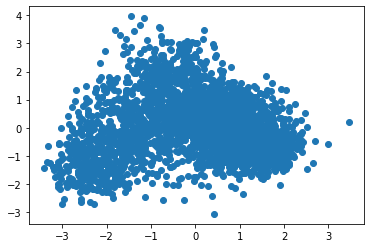

Damping 0.5  resulted in just one big cluster
---
damping: 0.6


/usr/local/lib/python3.7/dist-packages/sklearn/cluster/_affinity_propagation.py:253: ConvergenceWarning:

Affinity propagation did not converge, this model will not have any cluster centers.

/usr/local/lib/python3.7/dist-packages/sklearn/cluster/_affinity_propagation.py:532: ConvergenceWarning:

This model does not have any cluster centers because affinity propagation did not converge. Labeling every sample as '-1'.



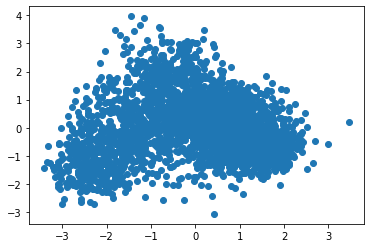

Damping 0.6  resulted in just one big cluster
---
damping: 0.7


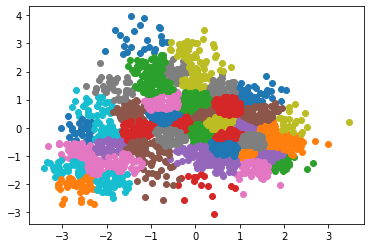

Sillhouette score:  0.4584715595367336
Percentage score:  0.7292357797683668
Number of clusters:  49
---
damping: 0.8


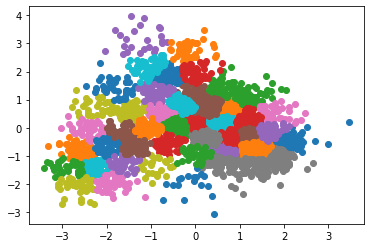

Sillhouette score:  0.4760659004496095
Percentage score:  0.7380329502248048
Number of clusters:  46
---
damping: 0.9


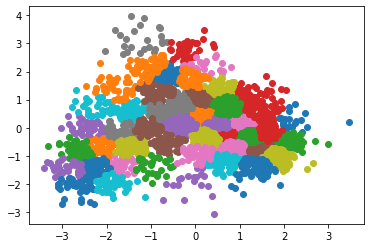

Sillhouette score:  0.47999355859766035
Percentage score:  0.7399967792988302
Number of clusters:  47
---


In [ ]:
vary_damping(df, cluster_with_affinity_propagation)

n: 2


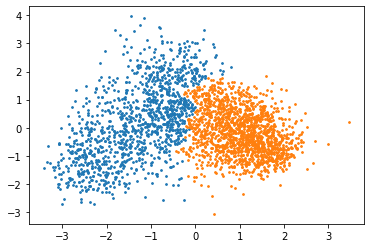

Sillhouette score:  0.5765759261543523
Percentage score:  0.7882879630771762
---
n: 3


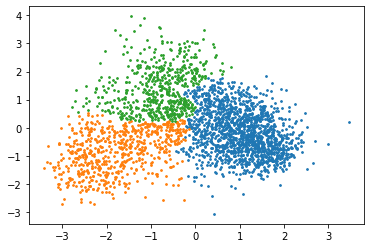

Sillhouette score:  0.6142641686533059
Percentage score:  0.807132084326653
---
n: 4


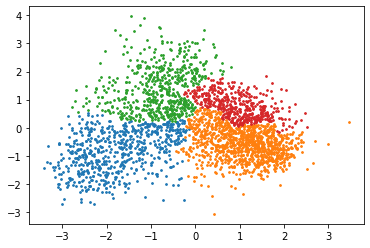

Sillhouette score:  0.48165757302225254
Percentage score:  0.7408287865111263
---
n: 5


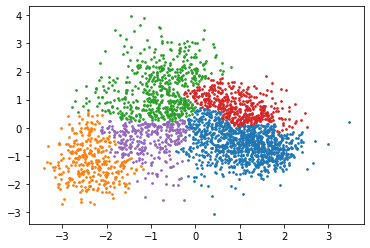

Sillhouette score:  0.43736968840019097
Percentage score:  0.7186848442000955
---
n: 6


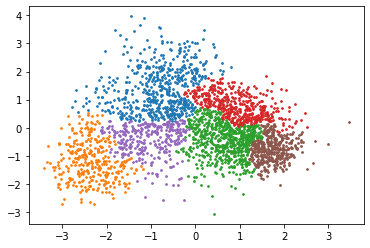

Sillhouette score:  0.41274502595535806
Percentage score:  0.706372512977679
---
n: 7


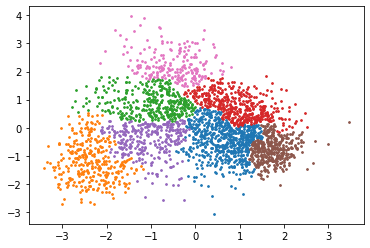

Sillhouette score:  0.4358094988762812
Percentage score:  0.7179047494381405
---
n: 8


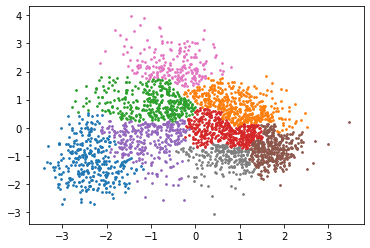

Sillhouette score:  0.43752517643559935
Percentage score:  0.7187625882177997
---
n: 9


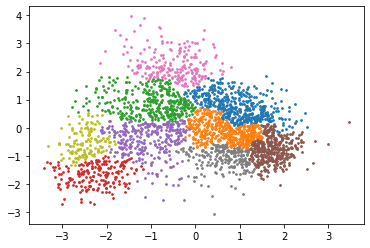

Sillhouette score:  0.4262529016445282
Percentage score:  0.7131264508222641
---
n: 10


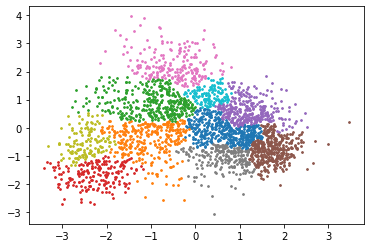

Sillhouette score:  0.38573018206669724
Percentage score:  0.6928650910333486
---
n: 11


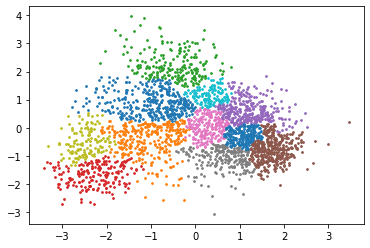

Sillhouette score:  0.35410084479153336
Percentage score:  0.6770504223957667
---
n: 12


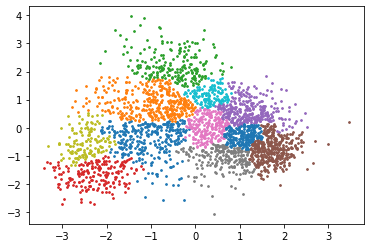

Sillhouette score:  0.3528122386696024
Percentage score:  0.6764061193348012
---
n: 13


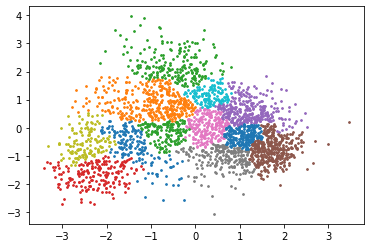

Sillhouette score:  0.35908954290088424
Percentage score:  0.6795447714504421
---
n: 14


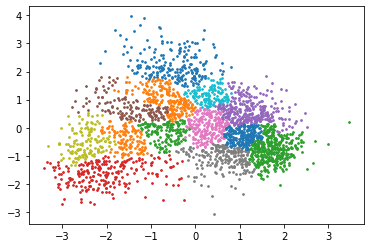

Sillhouette score:  0.36798559674169584
Percentage score:  0.6839927983708479
---


In [ ]:
vary_n_of_clusters(df, agglomerative_clustering)

n: 2


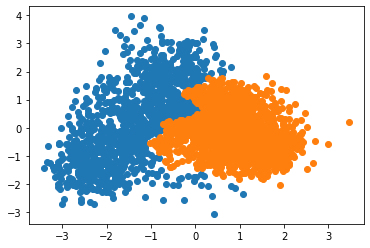

Sillhouette score:  0.5577552983515323
Percentage score:  0.7788776491757661
---
n: 3


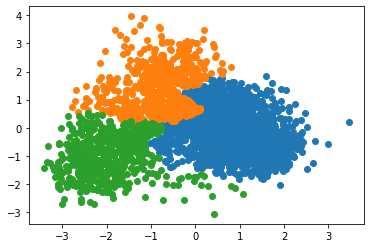

Sillhouette score:  0.6061774221348855
Percentage score:  0.8030887110674427
---
n: 4


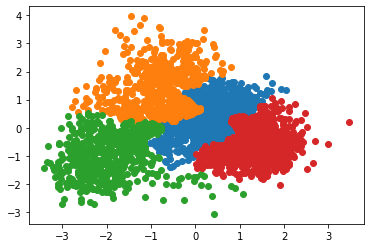

Sillhouette score:  0.49017806006175907
Percentage score:  0.7450890300308796
---
n: 5


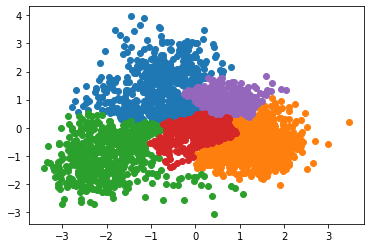

Sillhouette score:  0.431741110298065
Percentage score:  0.7158705551490325
---
n: 6


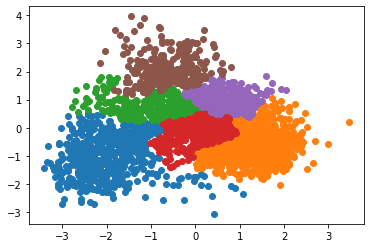

Sillhouette score:  0.4455340442829977
Percentage score:  0.7227670221414988
---
n: 7


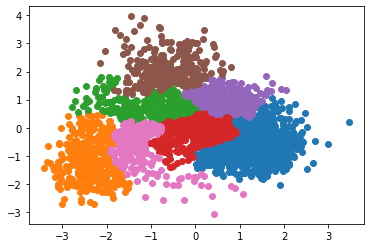

Sillhouette score:  0.42415109315120525
Percentage score:  0.7120755465756026
---
n: 8


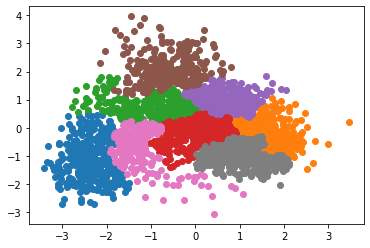

Sillhouette score:  0.39296509992063894
Percentage score:  0.6964825499603194
---
n: 9


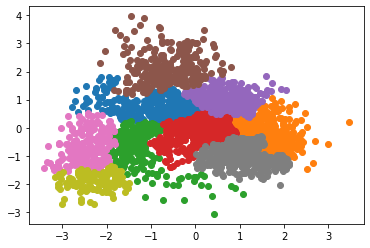

Sillhouette score:  0.3884137311186401
Percentage score:  0.6942068655593201
---
n: 10


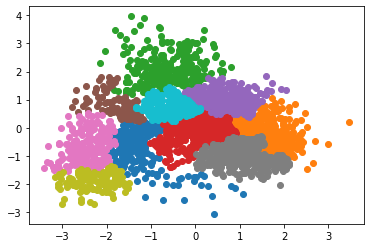

Sillhouette score:  0.3762169847767298
Percentage score:  0.6881084923883649
---
n: 11


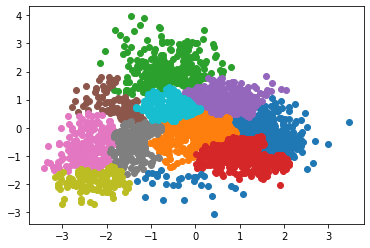

Sillhouette score:  0.3960516981947975
Percentage score:  0.6980258490973987
---
n: 12


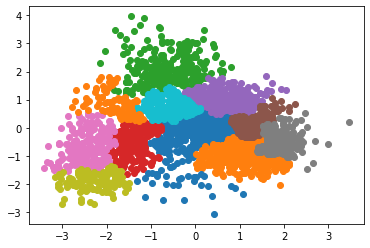

Sillhouette score:  0.3680739229865041
Percentage score:  0.684036961493252
---
n: 13


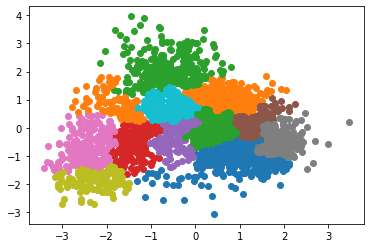

Sillhouette score:  0.3759357400490123
Percentage score:  0.6879678700245062
---
n: 14


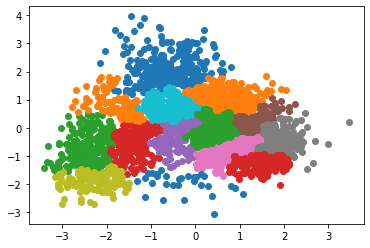

Sillhouette score:  0.3946421711549545
Percentage score:  0.6973210855774772
---


In [ ]:
vary_n_of_clusters(df, cluster_with_birch)

n: 2


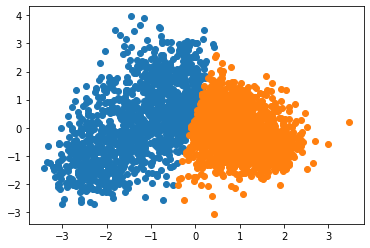

Sillhouette score:  0.5771877513303157
Percentage score:  0.7885938756651578
---
n: 3


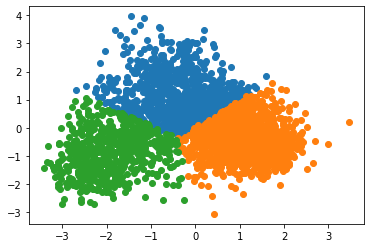

Sillhouette score:  0.6484762149466263
Percentage score:  0.8242381074733132
---
n: 4


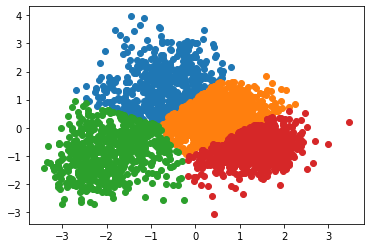

Sillhouette score:  0.5461351398311397
Percentage score:  0.7730675699155698
---
n: 5


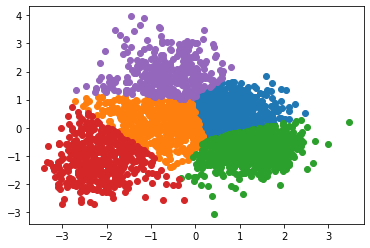

Sillhouette score:  0.5492885187750592
Percentage score:  0.7746442593875296
---
n: 6


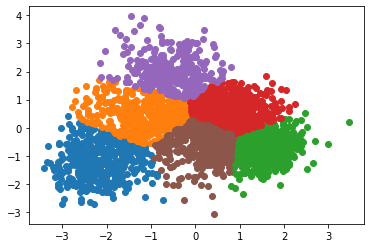

Sillhouette score:  0.5490627182265185
Percentage score:  0.7745313591132592
---
n: 7


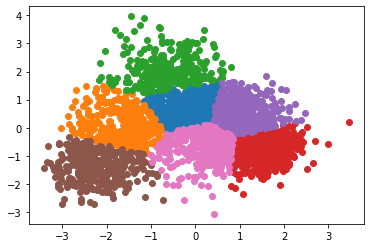

Sillhouette score:  0.5268638217606427
Percentage score:  0.7634319108803214
---
n: 8


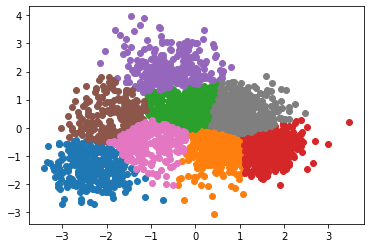

Sillhouette score:  0.5192539877983559
Percentage score:  0.759626993899178
---
n: 9


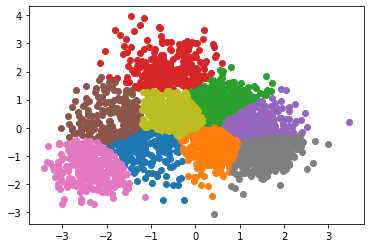

Sillhouette score:  0.5107390459714788
Percentage score:  0.7553695229857393
---
n: 10


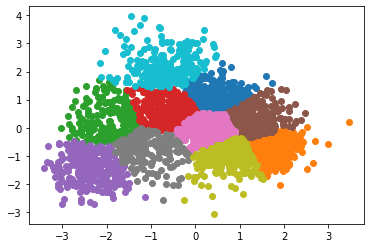

Sillhouette score:  0.5026184492910027
Percentage score:  0.7513092246455013
---
n: 11


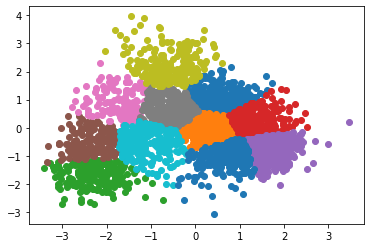

Sillhouette score:  0.49880203022112485
Percentage score:  0.7494010151105625
---
n: 12


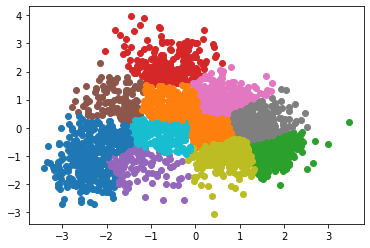

Sillhouette score:  0.4968213403447555
Percentage score:  0.7484106701723777
---
n: 13


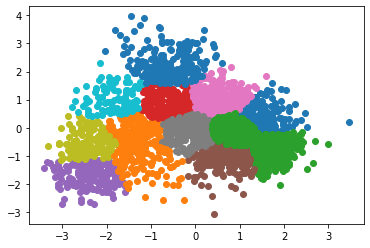

Sillhouette score:  0.5006551761232357
Percentage score:  0.7503275880616178
---
n: 14


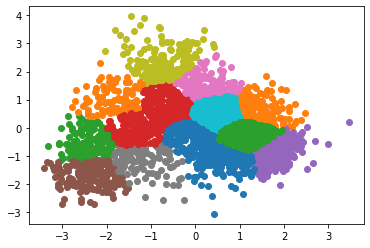

Sillhouette score:  0.4914247532940764
Percentage score:  0.7457123766470382
---


In [ ]:
vary_n_of_clusters(df, cluster_with_kmeans)

n: 2


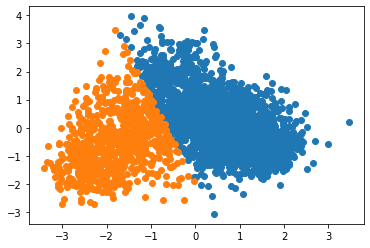

Sillhouette score:  0.5961219788206757
Percentage score:  0.7980609894103379
---
n: 3


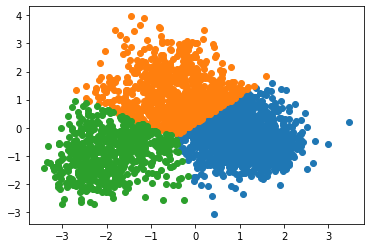

Sillhouette score:  0.6521743879932662
Percentage score:  0.8260871939966331
---
n: 4


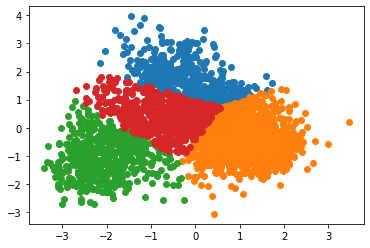

Sillhouette score:  0.5865814997666855
Percentage score:  0.7932907498833428
---
n: 5


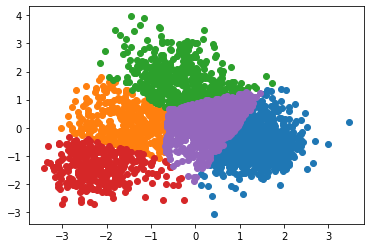

Sillhouette score:  0.5016210000480982
Percentage score:  0.750810500024049
---
n: 6


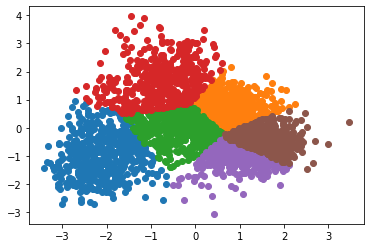

Sillhouette score:  0.4807780748153631
Percentage score:  0.7403890374076816
---
n: 7


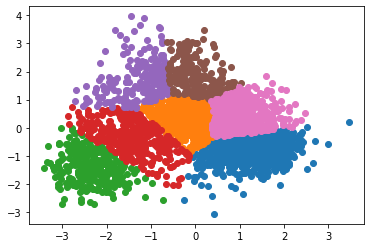

Sillhouette score:  0.48928543663798585
Percentage score:  0.744642718318993
---
n: 8


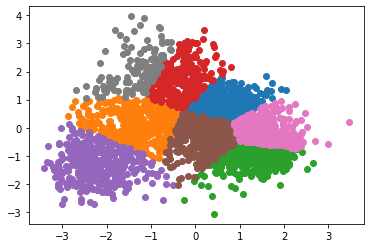

Sillhouette score:  0.46789982490500615
Percentage score:  0.7339499124525031
---
n: 9


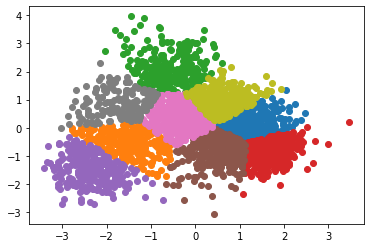

Sillhouette score:  0.4958494353208728
Percentage score:  0.7479247176604364
---
n: 10


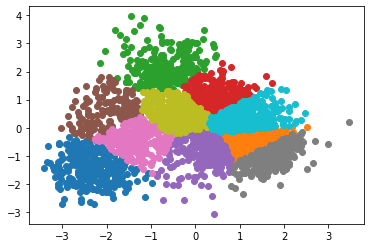

Sillhouette score:  0.4601735638932571
Percentage score:  0.7300867819466286
---
n: 11


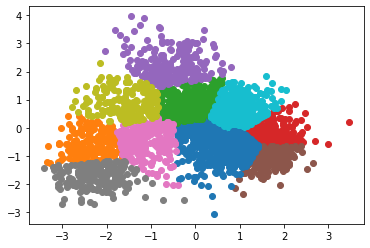

Sillhouette score:  0.4573902457089781
Percentage score:  0.7286951228544891
---
n: 12


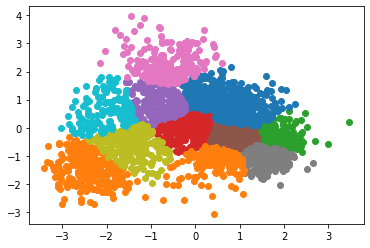

Sillhouette score:  0.47580363407563486
Percentage score:  0.7379018170378174
---
n: 13


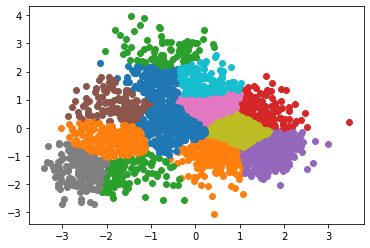

Sillhouette score:  0.47580534008140785
Percentage score:  0.7379026700407039
---
n: 14


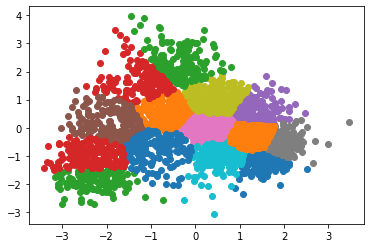

Sillhouette score:  0.46632234459206606
Percentage score:  0.7331611722960331
---


In [ ]:
vary_n_of_clusters(df, cluster_with_mini_batch_kmeans)

n: 2


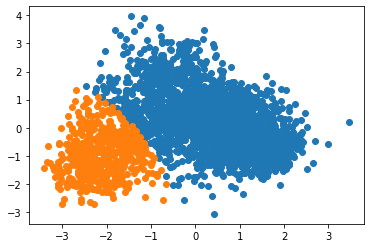

Sillhouette score:  0.5861649721284763
Percentage score:  0.7930824860642381
---
n: 3


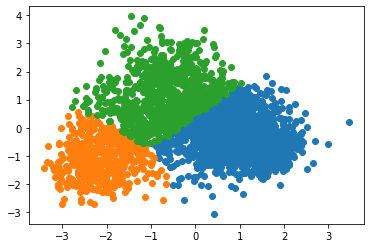

Sillhouette score:  0.6304503613785462
Percentage score:  0.8152251806892731
---
n: 4


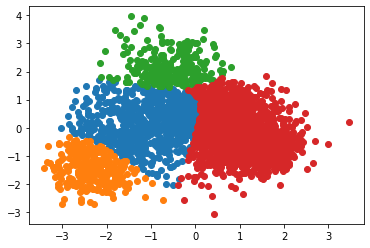

Sillhouette score:  0.5470700362804585
Percentage score:  0.7735350181402292
---
n: 5


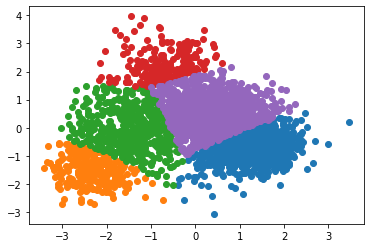

Sillhouette score:  0.49477803161219897
Percentage score:  0.7473890158060995
---
n: 6


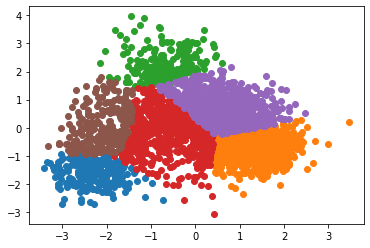

Sillhouette score:  0.48499143992912735
Percentage score:  0.7424957199645636
---
n: 7


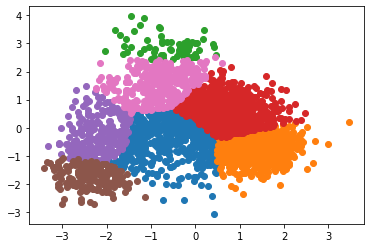

Sillhouette score:  0.4735347565710003
Percentage score:  0.7367673782855002
---
n: 8


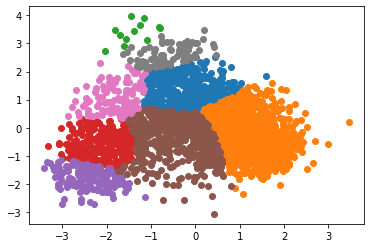

Sillhouette score:  0.4607890496789806
Percentage score:  0.7303945248394903
---
n: 9


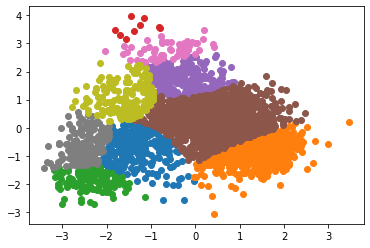

Sillhouette score:  0.3777117366985944
Percentage score:  0.6888558683492972
---
n: 10


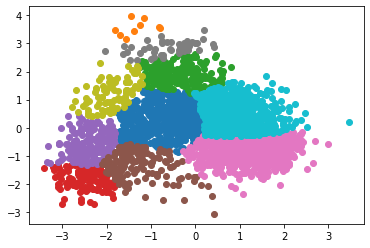

Sillhouette score:  0.4593487346708525
Percentage score:  0.7296743673354262
---
n: 11


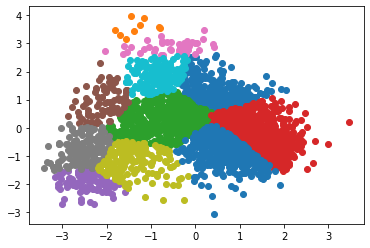

Sillhouette score:  0.40350604434788023
Percentage score:  0.7017530221739401
---
n: 12


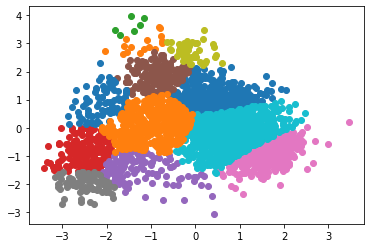

Sillhouette score:  0.4013579122693644
Percentage score:  0.7006789561346822
---
n: 13


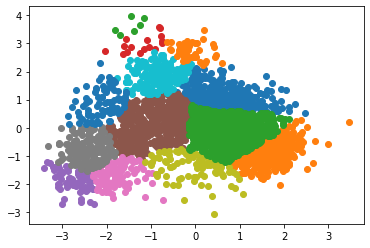

Sillhouette score:  0.38833891731160236
Percentage score:  0.6941694586558012
---
n: 14


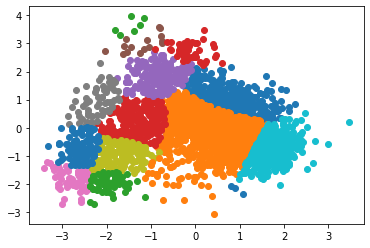

Sillhouette score:  0.30030048949392113
Percentage score:  0.6501502447469606
---


In [ ]:
vary_n_of_clusters(df, spectral_clustering)

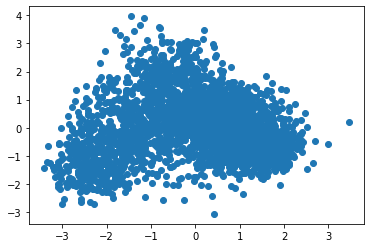

In [ ]:
try: mean_shift_clustering(df)
except: pass

n: 4


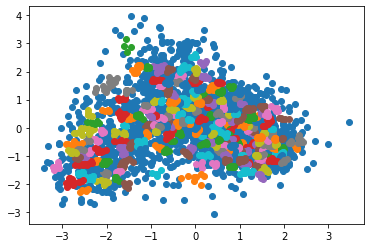

Sillhouette score:  -0.04572510489004335
Percentage score:  0.47713744755497833
---
n: 5


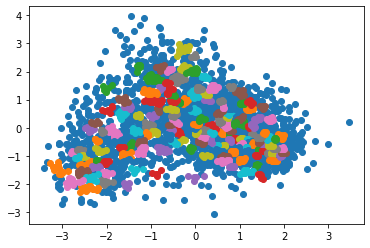

Sillhouette score:  -0.1429442659024596
Percentage score:  0.4285278670487702
---
n: 6


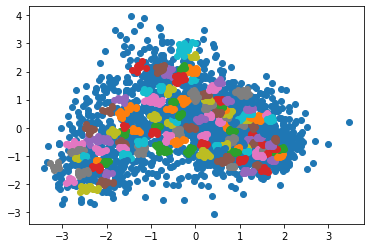

Sillhouette score:  -0.17647838447283962
Percentage score:  0.4117608077635802
---
n: 7


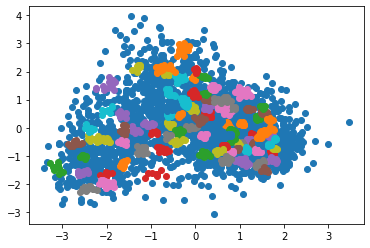

Sillhouette score:  -0.28356606292286224
Percentage score:  0.3582169685385689
---
n: 8


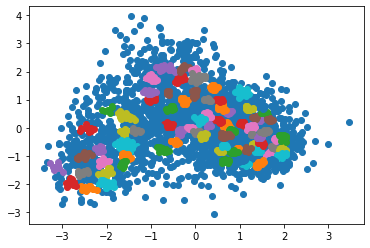

Sillhouette score:  -0.31863400737487757
Percentage score:  0.3406829963125612
---
n: 9


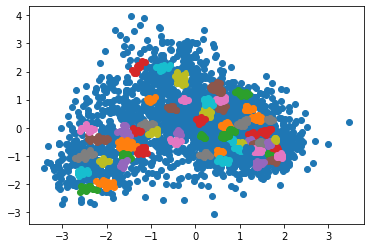

Sillhouette score:  -0.3832205756431994
Percentage score:  0.3083897121784003
---
n: 10


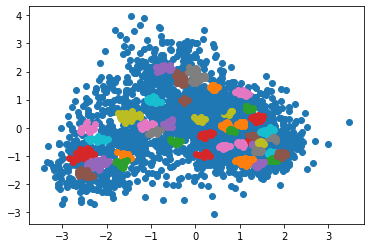

Sillhouette score:  -0.4568441667128872
Percentage score:  0.2715779166435564
---
n: 11


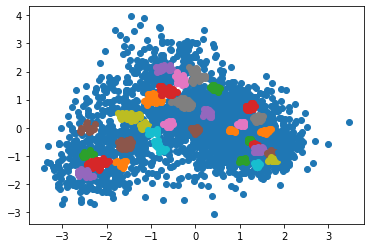

Sillhouette score:  -0.533225231951406
Percentage score:  0.23338738402429698
---
n: 12


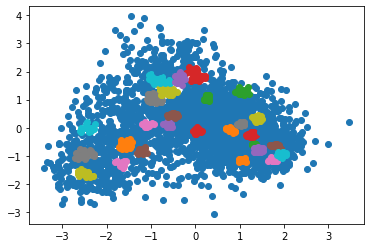

Sillhouette score:  -0.5978503623995186
Percentage score:  0.2010748188002407
---
n: 13


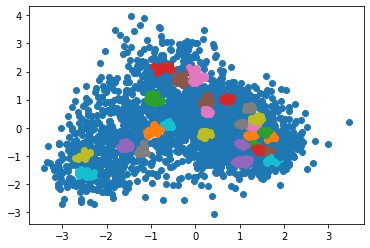

Sillhouette score:  -0.563713042442761
Percentage score:  0.2181434787786195
---
n: 14


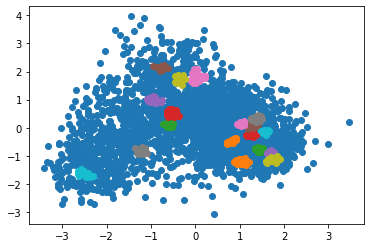

Sillhouette score:  -0.686164060502633
Percentage score:  0.1569179697486835
---


In [ ]:
vary_min_samples(df, cluster_with_optics)

# 4. German and English

In [ ]:
de_en_graph = load_graph('de', 'en')
df = apply_pca(make_df(de_en_graph))


[clusteval] >Fit using agglomerative with metric: euclidean, and linkage: ward
[clusteval] >Evaluate using silhouette.


100%|██████████| 23/23 [00:02<00:00,  9.38it/s]


[clusteval] >Compute dendrogram threshold.
[clusteval] >Optimal number clusters detected: [2].
[clusteval] >Fin.
[clusteval] >Estimated number of n_clusters: 2, average silhouette_score=0.329


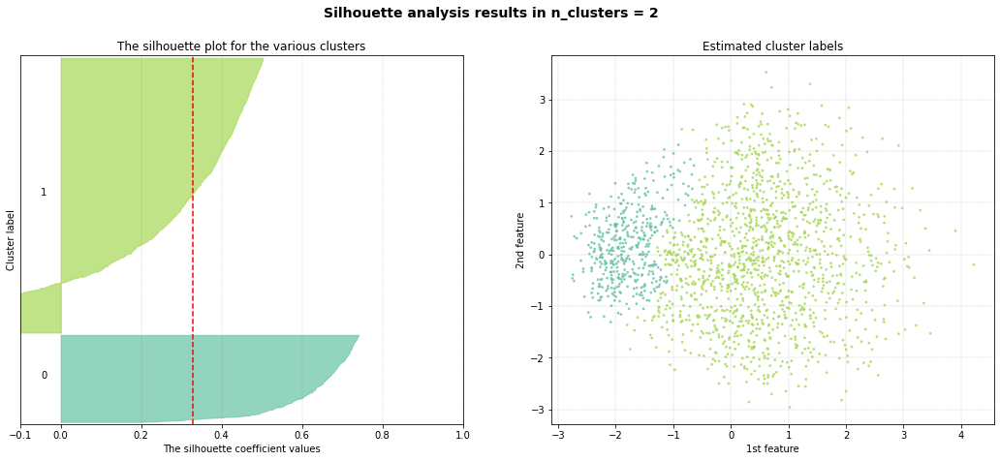


[clusteval] >Fit using agglomerative with metric: euclidean, and linkage: ward
[clusteval] >Evaluate using dbindex.


100%|██████████| 23/23 [00:00<00:00, 32.73it/s]


[clusteval] >Compute dendrogram threshold.
[clusteval] >Optimal number clusters detected: [24].
[clusteval] >Fin.
[clusteval] >Estimated number of n_clusters: 24, average silhouette_score=0.293


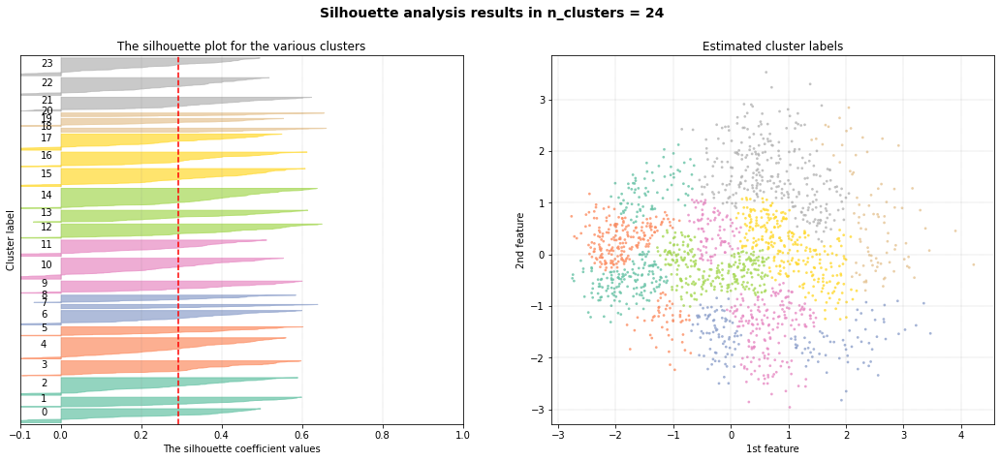


[clusteval] >Fit using dbscan with metric: euclidean, and linkage: ward
[clusteval] >Gridsearch across epsilon..
[clusteval] >Evaluate using silhouette..


100%|██████████| 245/245 [00:34<00:00,  7.10it/s]


[clusteval] >Compute dendrogram threshold.

[clusteval] >Fit using hdbscan with metric: euclidean, and linkage: ward
[clusteval] >Estimated number of clusters: 272
[clusteval] >Silhouette Coefficient: 0.097
[clusteval] >Compute dendrogram threshold.
[clusteval] >Optimal number clusters detected: [273].
[clusteval] >Fin.
[clusteval] >Estimated number of n_clusters: 272, average silhouette_score=0.093


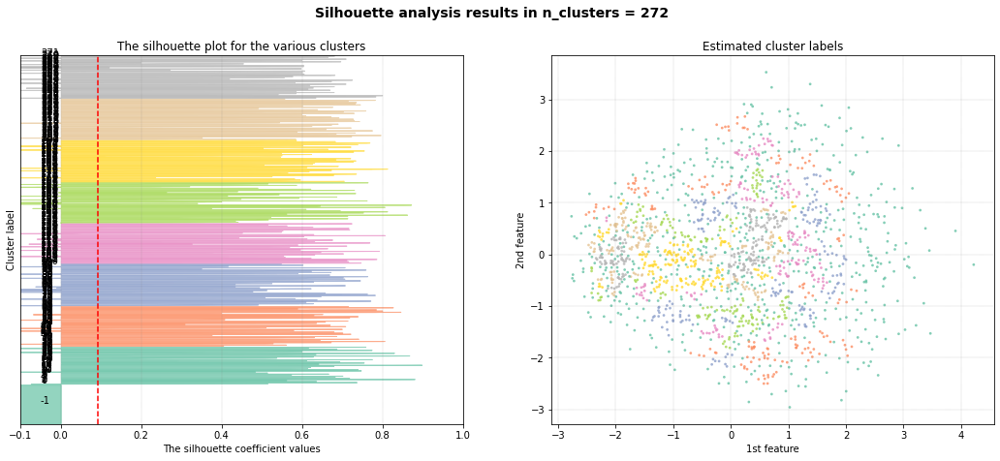

In [ ]:
clustevalres(df)

damping: 0.5


/usr/local/lib/python3.7/dist-packages/sklearn/cluster/_affinity_propagation.py:253: ConvergenceWarning:

Affinity propagation did not converge, this model will not have any cluster centers.

/usr/local/lib/python3.7/dist-packages/sklearn/cluster/_affinity_propagation.py:532: ConvergenceWarning:

This model does not have any cluster centers because affinity propagation did not converge. Labeling every sample as '-1'.



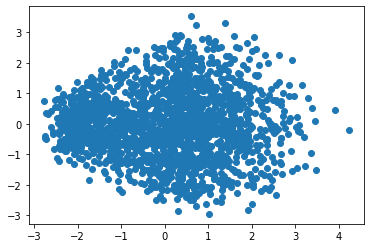

Damping 0.5  resulted in just one big cluster
---
damping: 0.6


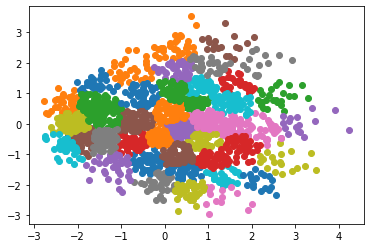

Sillhouette score:  0.4738700447460795
Percentage score:  0.7369350223730398
Number of clusters:  43
---
damping: 0.7


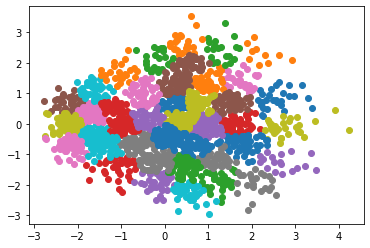

Sillhouette score:  0.48917867765330436
Percentage score:  0.7445893388266522
Number of clusters:  41
---
damping: 0.8


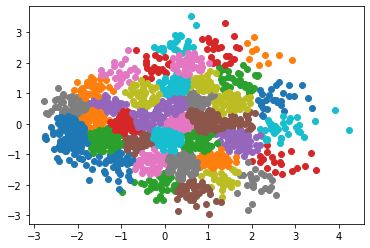

Sillhouette score:  0.5029168312916058
Percentage score:  0.7514584156458028
Number of clusters:  40
---
damping: 0.9


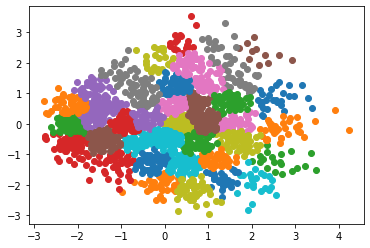

Sillhouette score:  0.4992537824699216
Percentage score:  0.7496268912349608
Number of clusters:  40
---


In [ ]:
vary_damping(df, cluster_with_affinity_propagation)

n: 2


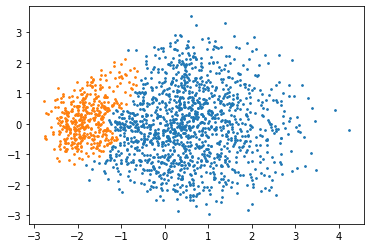

Sillhouette score:  0.4260241334540759
Percentage score:  0.713012066727038
---
n: 3


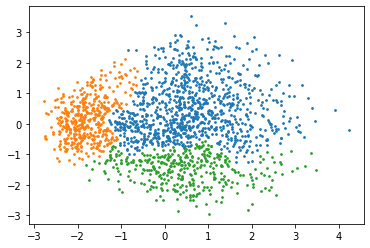

Sillhouette score:  0.43294176641177506
Percentage score:  0.7164708832058875
---
n: 4


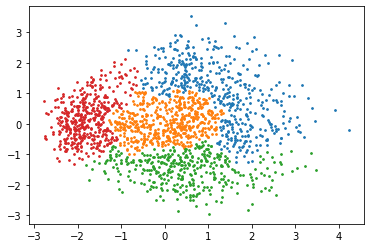

Sillhouette score:  0.4110637768375364
Percentage score:  0.7055318884187682
---
n: 5


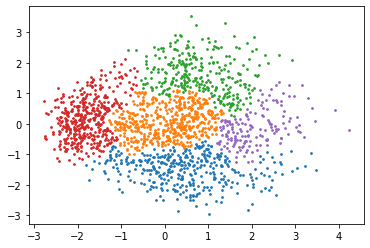

Sillhouette score:  0.4568906554951946
Percentage score:  0.7284453277475973
---
n: 6


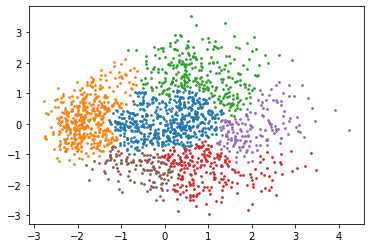

Sillhouette score:  0.4399756424031385
Percentage score:  0.7199878212015692
---
n: 7


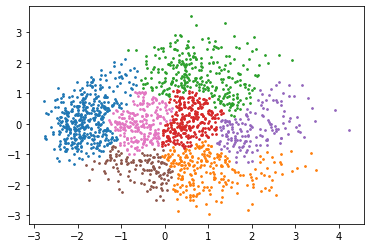

Sillhouette score:  0.41330510756034694
Percentage score:  0.7066525537801734
---
n: 8


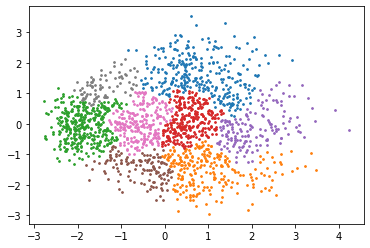

Sillhouette score:  0.4211989225385257
Percentage score:  0.7105994612692629
---
n: 9


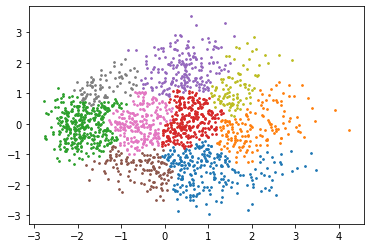

Sillhouette score:  0.429623023280557
Percentage score:  0.7148115116402785
---
n: 10


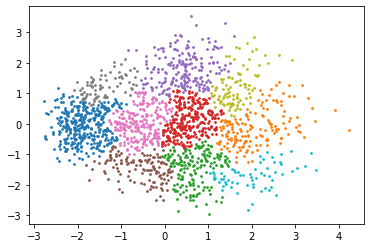

Sillhouette score:  0.43585409954148063
Percentage score:  0.7179270497707403
---
n: 11


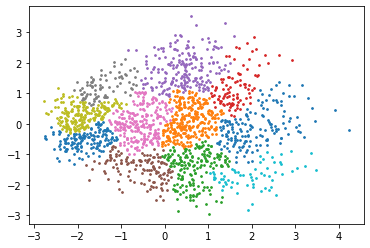

Sillhouette score:  0.4136867958863424
Percentage score:  0.7068433979431712
---
n: 12


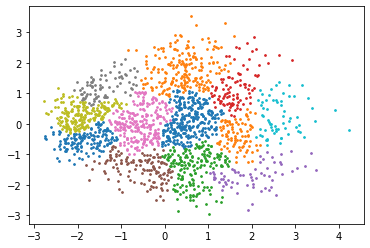

Sillhouette score:  0.4099844764761649
Percentage score:  0.7049922382380824
---
n: 13


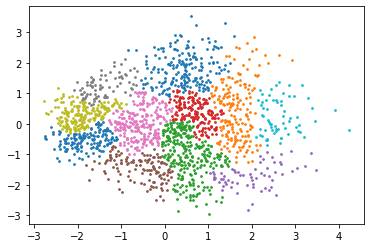

Sillhouette score:  0.3778641477865461
Percentage score:  0.688932073893273
---
n: 14


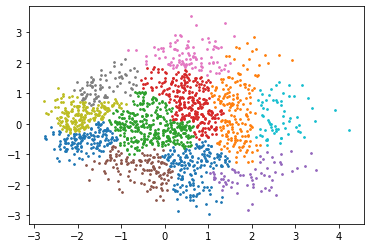

Sillhouette score:  0.3654514895057601
Percentage score:  0.6827257447528801
---


In [ ]:
vary_n_of_clusters(df, agglomerative_clustering)

n: 2


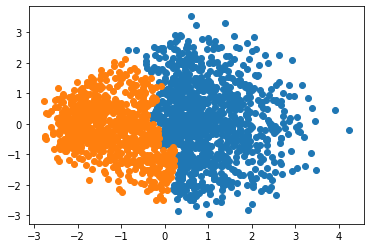

Sillhouette score:  0.5181350399318833
Percentage score:  0.7590675199659416
---
n: 3


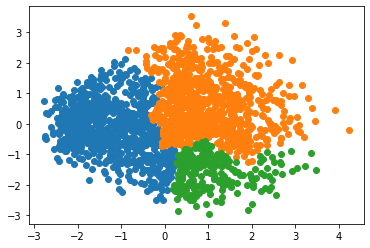

Sillhouette score:  0.4757671294649369
Percentage score:  0.7378835647324684
---
n: 4


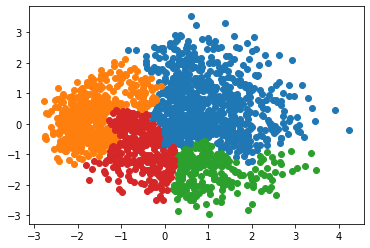

Sillhouette score:  0.3867056101588971
Percentage score:  0.6933528050794485
---
n: 5


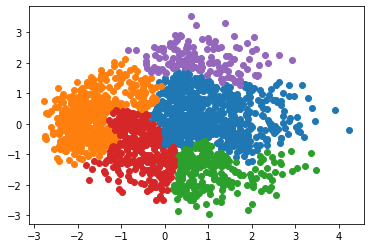

Sillhouette score:  0.37494188939957035
Percentage score:  0.6874709446997852
---
n: 6


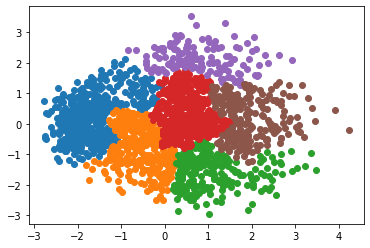

Sillhouette score:  0.4134961477945485
Percentage score:  0.7067480738972742
---
n: 7


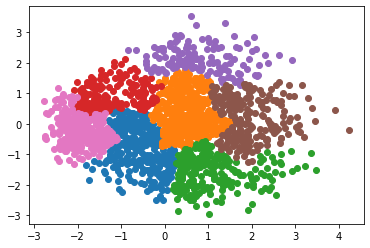

Sillhouette score:  0.4246819458766748
Percentage score:  0.7123409729383374
---
n: 8


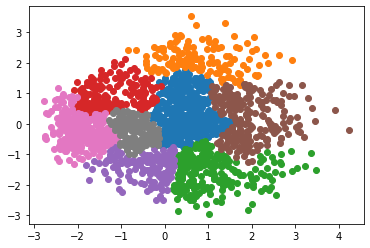

Sillhouette score:  0.40963073800302363
Percentage score:  0.7048153690015118
---
n: 9


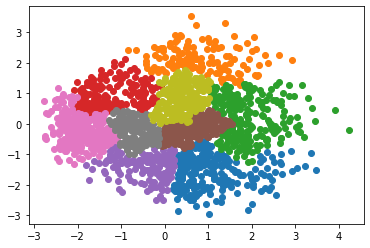

Sillhouette score:  0.40072424864176276
Percentage score:  0.7003621243208814
---
n: 10


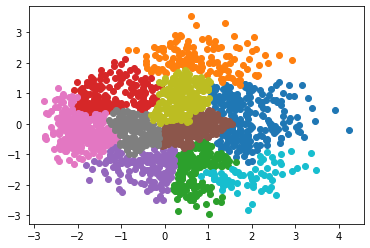

Sillhouette score:  0.39866567819122467
Percentage score:  0.6993328390956124
---
n: 11


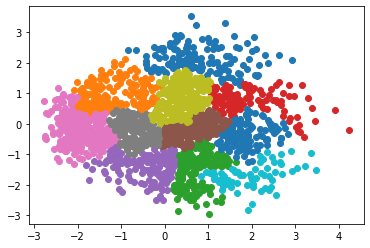

Sillhouette score:  0.4042372768877734
Percentage score:  0.7021186384438867
---
n: 12


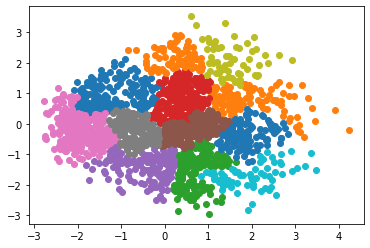

Sillhouette score:  0.4075021747157621
Percentage score:  0.7037510873578811
---
n: 13


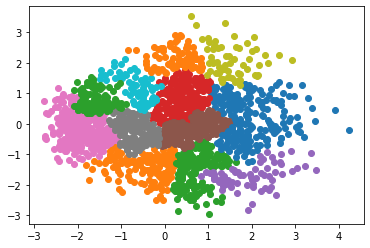

Sillhouette score:  0.39972202000262097
Percentage score:  0.6998610100013105
---
n: 14


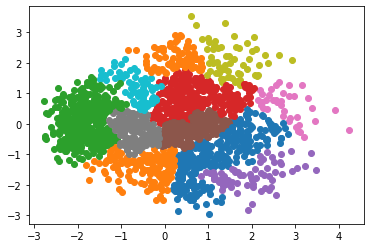

Sillhouette score:  0.3984052564548062
Percentage score:  0.6992026282274031
---


In [ ]:
vary_n_of_clusters(df, cluster_with_birch)

n: 2


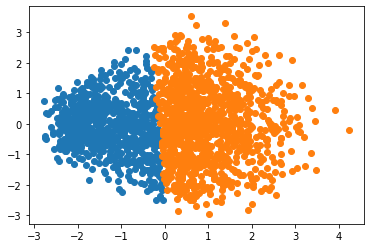

Sillhouette score:  0.5239682129459335
Percentage score:  0.7619841064729668
---
n: 3


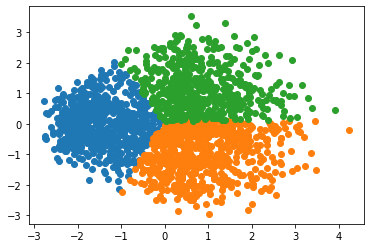

Sillhouette score:  0.5853544168892917
Percentage score:  0.7926772084446458
---
n: 4


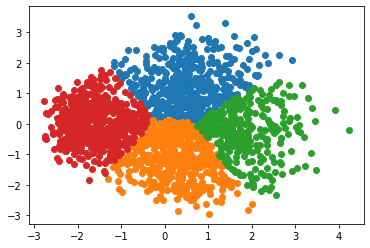

Sillhouette score:  0.5630700409120756
Percentage score:  0.7815350204560378
---
n: 5


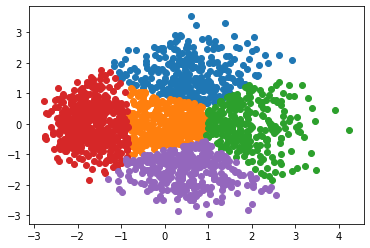

Sillhouette score:  0.5318326137203774
Percentage score:  0.7659163068601886
---
n: 6


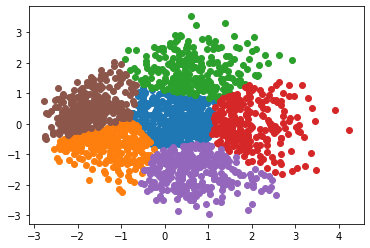

Sillhouette score:  0.5095877579641076
Percentage score:  0.7547938789820539
---
n: 7


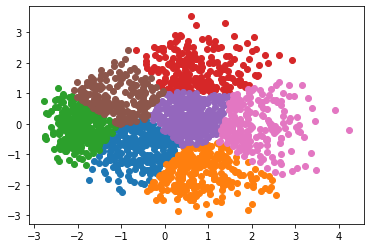

Sillhouette score:  0.5024862352901989
Percentage score:  0.7512431176450994
---
n: 8


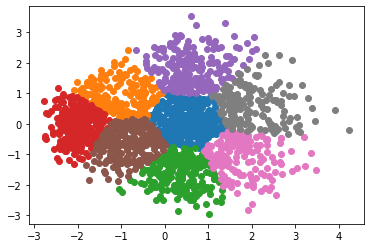

Sillhouette score:  0.5140253279199861
Percentage score:  0.757012663959993
---
n: 9


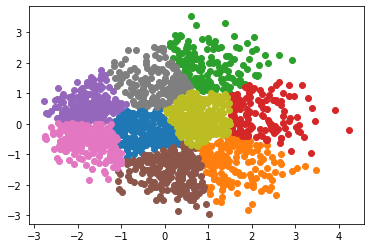

Sillhouette score:  0.49598657921777173
Percentage score:  0.7479932896088859
---
n: 10


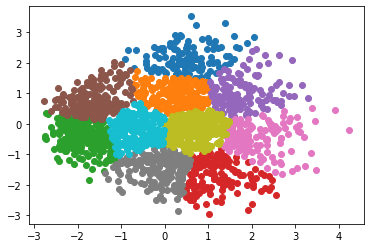

Sillhouette score:  0.5023016052803608
Percentage score:  0.7511508026401804
---
n: 11


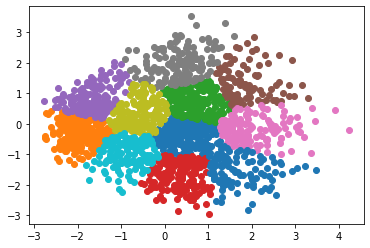

Sillhouette score:  0.5018545471329048
Percentage score:  0.7509272735664524
---
n: 12


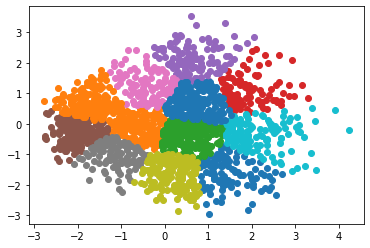

Sillhouette score:  0.4973063186729784
Percentage score:  0.7486531593364892
---
n: 13


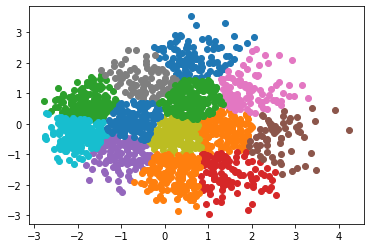

Sillhouette score:  0.5047805440449283
Percentage score:  0.7523902720224642
---
n: 14


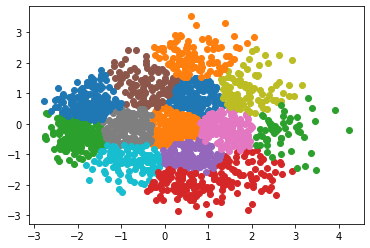

Sillhouette score:  0.5092040209856076
Percentage score:  0.7546020104928037
---


In [ ]:
vary_n_of_clusters(df, cluster_with_kmeans)

n: 2


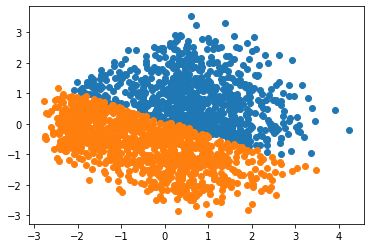

Sillhouette score:  0.4478425480577952
Percentage score:  0.7239212740288976
---
n: 3


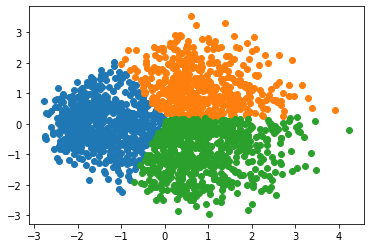

Sillhouette score:  0.5854767405924087
Percentage score:  0.7927383702962043
---
n: 4


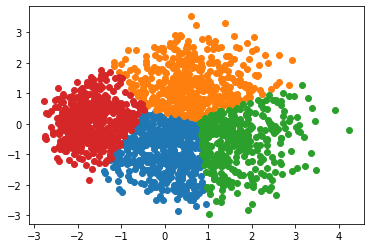

Sillhouette score:  0.5448885360958595
Percentage score:  0.7724442680479298
---
n: 5


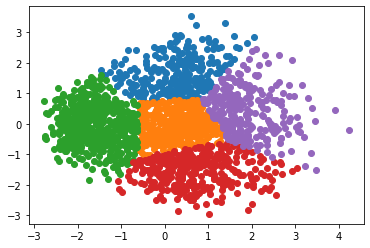

Sillhouette score:  0.5246440552468237
Percentage score:  0.7623220276234118
---
n: 6


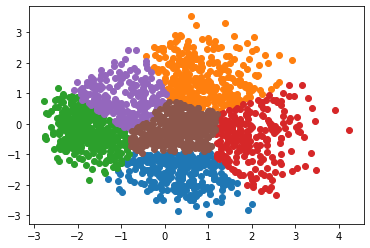

Sillhouette score:  0.4986333644196034
Percentage score:  0.7493166822098016
---
n: 7


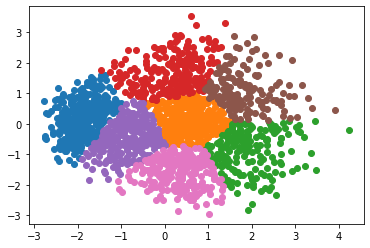

Sillhouette score:  0.5058784193886204
Percentage score:  0.7529392096943102
---
n: 8


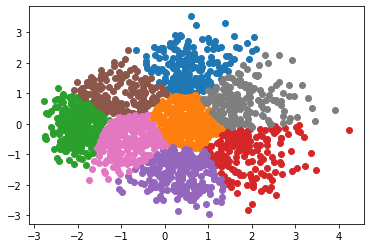

Sillhouette score:  0.5087927508471598
Percentage score:  0.7543963754235798
---
n: 9


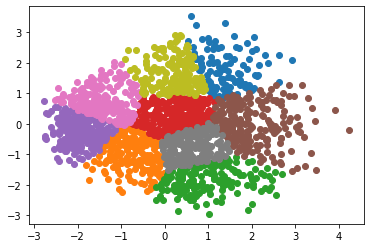

Sillhouette score:  0.4440910331656604
Percentage score:  0.7220455165828302
---
n: 10


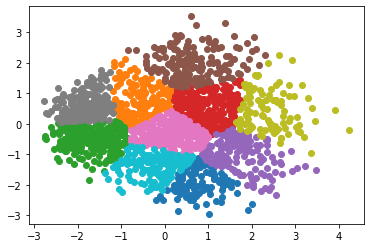

Sillhouette score:  0.4749004941401467
Percentage score:  0.7374502470700733
---
n: 11


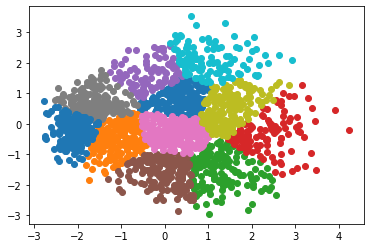

Sillhouette score:  0.46619622226210466
Percentage score:  0.7330981111310524
---
n: 12


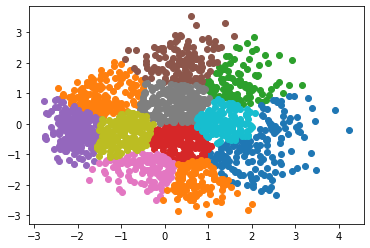

Sillhouette score:  0.48645867559579087
Percentage score:  0.7432293377978955
---
n: 13


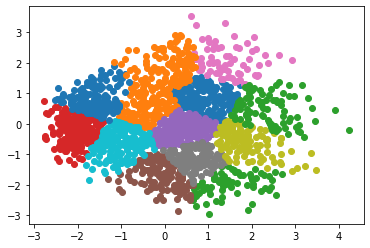

Sillhouette score:  0.4750684338268307
Percentage score:  0.7375342169134154
---
n: 14


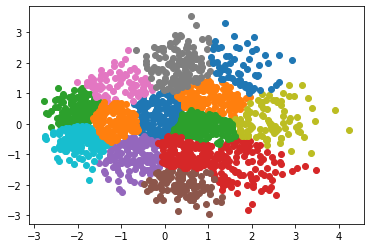

Sillhouette score:  0.4687539268484427
Percentage score:  0.7343769634242213
---


In [ ]:
vary_n_of_clusters(df, cluster_with_mini_batch_kmeans)

n: 2


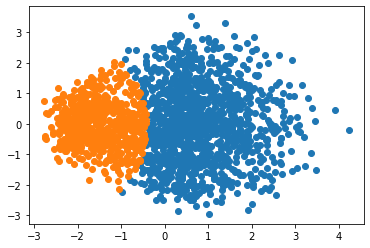

Sillhouette score:  0.4993835892650567
Percentage score:  0.7496917946325283
---
n: 3


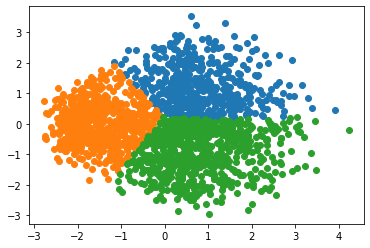

Sillhouette score:  0.5788302050922809
Percentage score:  0.7894151025461404
---
n: 4


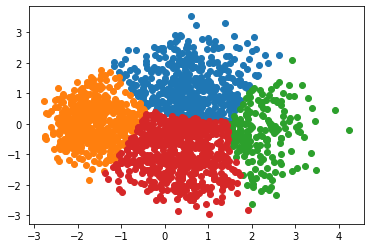

Sillhouette score:  0.5561048465430062
Percentage score:  0.7780524232715031
---
n: 5


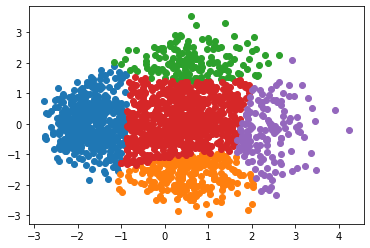

Sillhouette score:  0.46875229815644137
Percentage score:  0.7343761490782207
---
n: 6


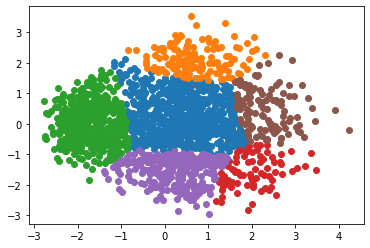

Sillhouette score:  0.44746456572145704
Percentage score:  0.7237322828607285
---
n: 7


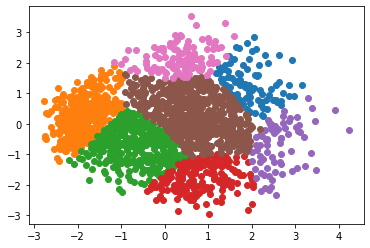

Sillhouette score:  0.4140361933405859
Percentage score:  0.7070180966702929
---
n: 8


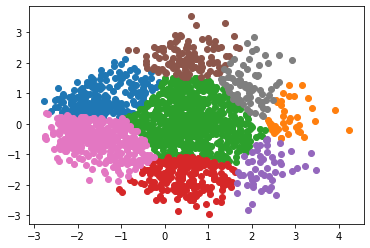

Sillhouette score:  0.3681760123666761
Percentage score:  0.6840880061833381
---
n: 9


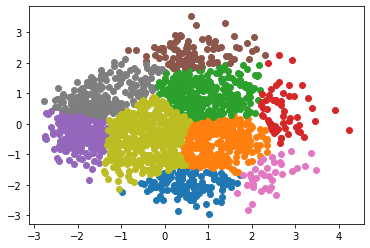

Sillhouette score:  0.42246920892692175
Percentage score:  0.7112346044634609
---
n: 10


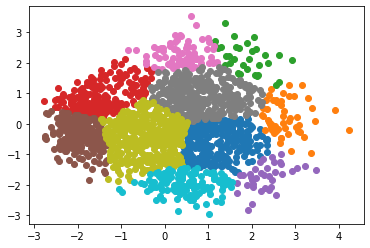

Sillhouette score:  0.4166793054188508
Percentage score:  0.7083396527094254
---
n: 11


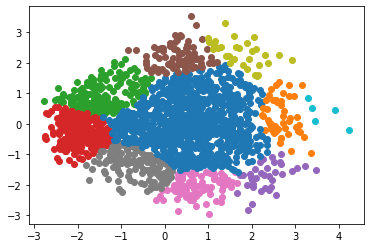

Sillhouette score:  0.29273209092489877
Percentage score:  0.6463660454624494
---
n: 12


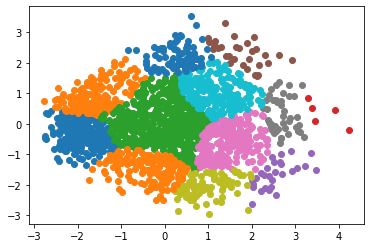

Sillhouette score:  0.37359583724745643
Percentage score:  0.6867979186237282
---
n: 13


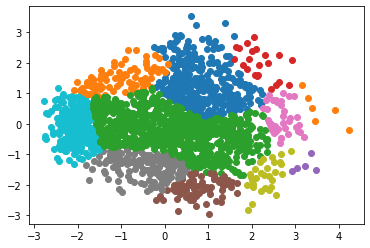

Sillhouette score:  0.34302649904392196
Percentage score:  0.671513249521961
---
n: 14


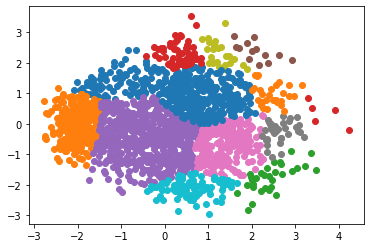

Sillhouette score:  0.320270396296096
Percentage score:  0.660135198148048
---


In [ ]:
vary_n_of_clusters(df, spectral_clustering)

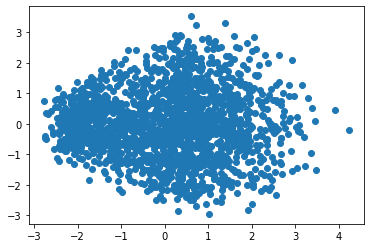

In [ ]:
try: mean_shift_clustering(df)
except: pass

n: 4


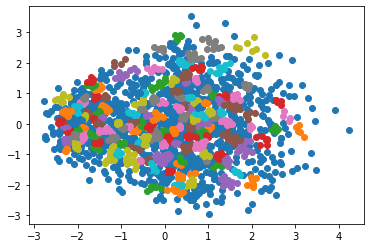

Sillhouette score:  0.0018311928165484065
Percentage score:  0.5009155964082742
---
n: 5


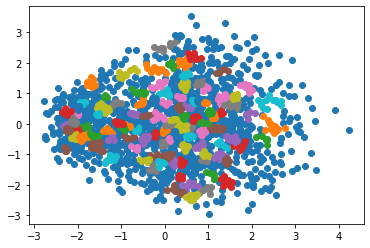

Sillhouette score:  -0.14258830805188136
Percentage score:  0.4287058459740593
---
n: 6


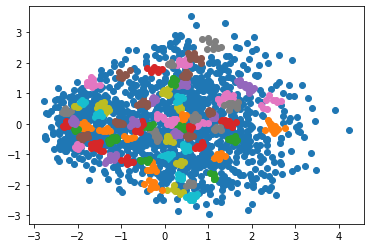

Sillhouette score:  -0.2739413471489099
Percentage score:  0.3630293264255451
---
n: 7


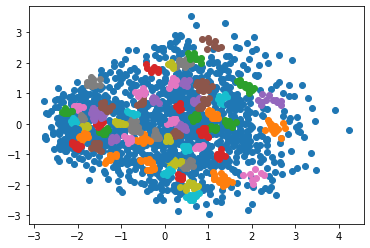

Sillhouette score:  -0.27049944456379577
Percentage score:  0.3647502777181021
---
n: 8


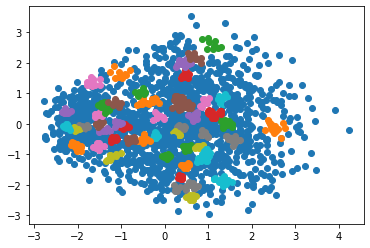

Sillhouette score:  -0.38039948085081937
Percentage score:  0.30980025957459034
---
n: 9


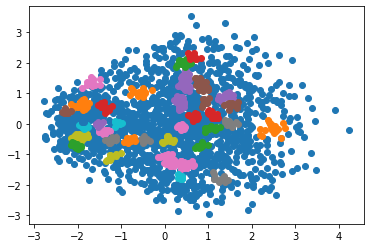

Sillhouette score:  -0.43976176100086867
Percentage score:  0.2801191194995657
---
n: 10


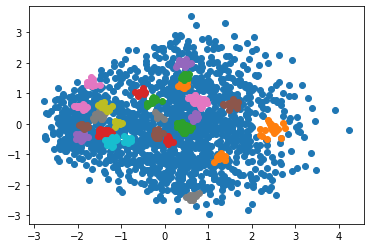

Sillhouette score:  -0.5585242769834777
Percentage score:  0.22073786150826114
---
n: 11


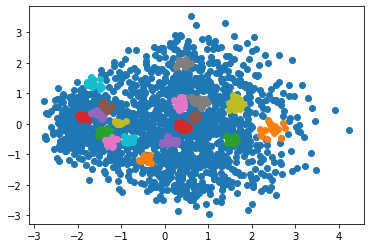

Sillhouette score:  -0.6088523590796096
Percentage score:  0.19557382046019522
---
n: 12


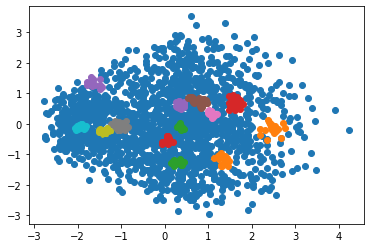

Sillhouette score:  -0.6787153430553419
Percentage score:  0.16064232847232907
---
n: 13


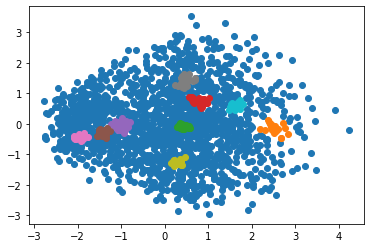

Sillhouette score:  -0.708302016470429
Percentage score:  0.1458489917647855
---
n: 14


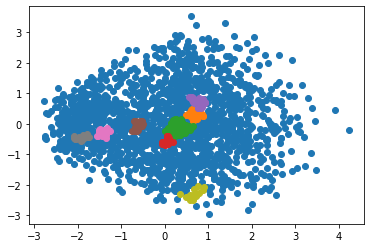

Sillhouette score:  -0.6805895120097979
Percentage score:  0.15970524399510105
---


In [ ]:
vary_min_samples(df, cluster_with_optics)

---

# 5. Latin and English

In [ ]:
la_en_graph = load_graph('la', 'en')
graph = hi_en_graph
df = apply_pca(make_df(graph))


[clusteval] >Fit using agglomerative with metric: euclidean, and linkage: ward
[clusteval] >Evaluate using silhouette.


100%|██████████| 23/23 [00:05<00:00,  4.60it/s]


[clusteval] >Compute dendrogram threshold.
[clusteval] >Optimal number clusters detected: [2].
[clusteval] >Fin.
[clusteval] >Estimated number of n_clusters: 2, average silhouette_score=0.421


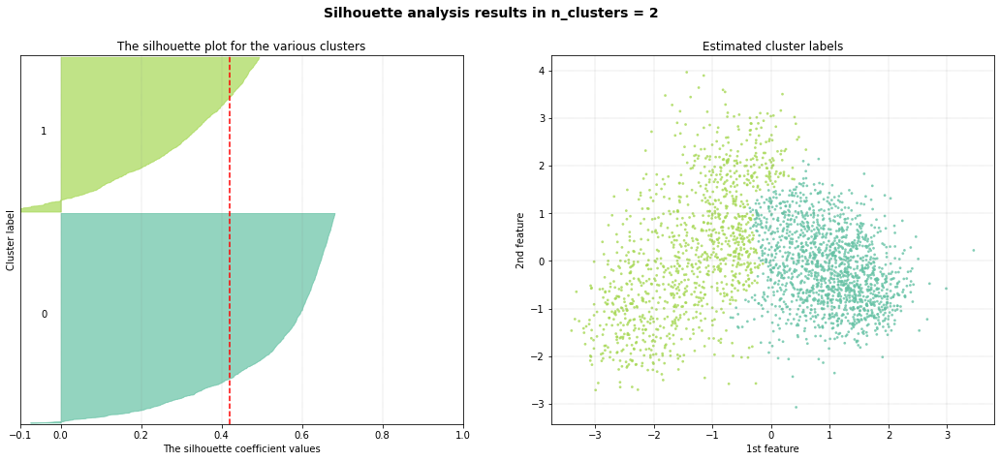


[clusteval] >Fit using agglomerative with metric: euclidean, and linkage: ward
[clusteval] >Evaluate using dbindex.


100%|██████████| 23/23 [00:01<00:00, 21.31it/s]


[clusteval] >Compute dendrogram threshold.
[clusteval] >Optimal number clusters detected: [24].
[clusteval] >Fin.
[clusteval] >Estimated number of n_clusters: 24, average silhouette_score=0.272


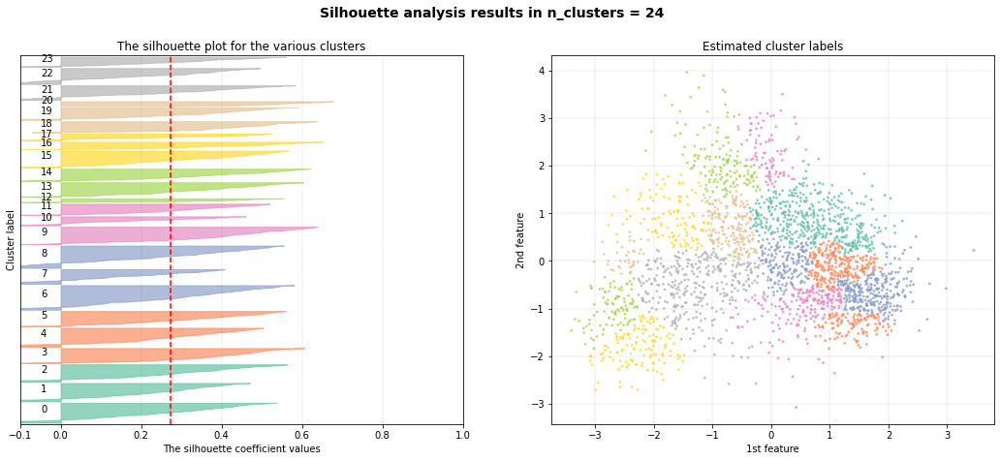


[clusteval] >Fit using dbscan with metric: euclidean, and linkage: ward
[clusteval] >Gridsearch across epsilon..
[clusteval] >Evaluate using silhouette..


100%|██████████| 245/245 [00:47<00:00,  5.11it/s]


[clusteval] >Compute dendrogram threshold.
[clusteval] >Optimal number clusters detected: [2].
[clusteval] >Fin.


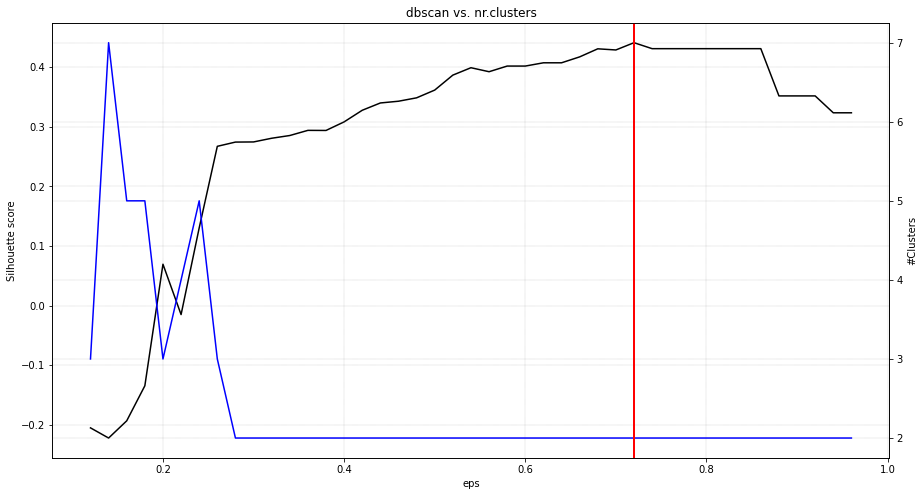

[clusteval] >Estimated number of n_clusters: 1, average silhouette_score=0.441


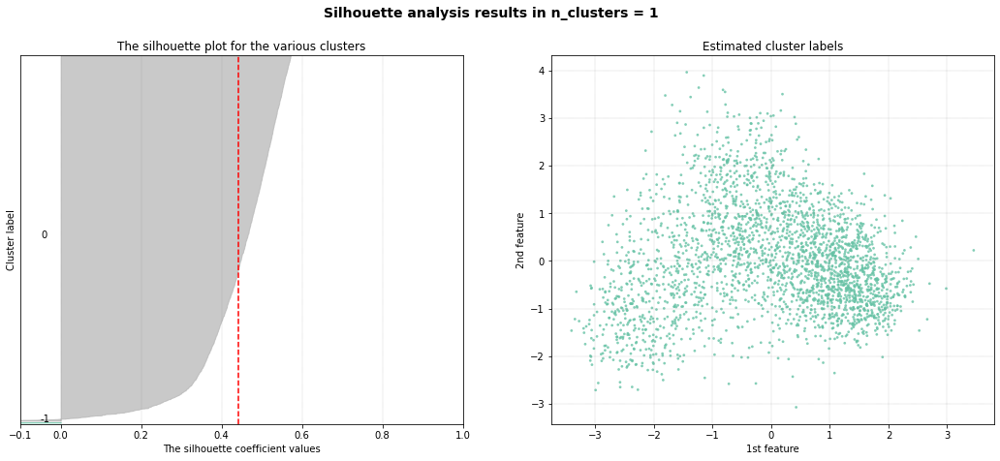


[clusteval] >Fit using hdbscan with metric: euclidean, and linkage: ward
[clusteval] >Estimated number of clusters: 429
[clusteval] >Silhouette Coefficient: 0.107
[clusteval] >Compute dendrogram threshold.
[clusteval] >Optimal number clusters detected: [430].
[clusteval] >Fin.
[clusteval] >Estimated number of n_clusters: 429, average silhouette_score=0.104


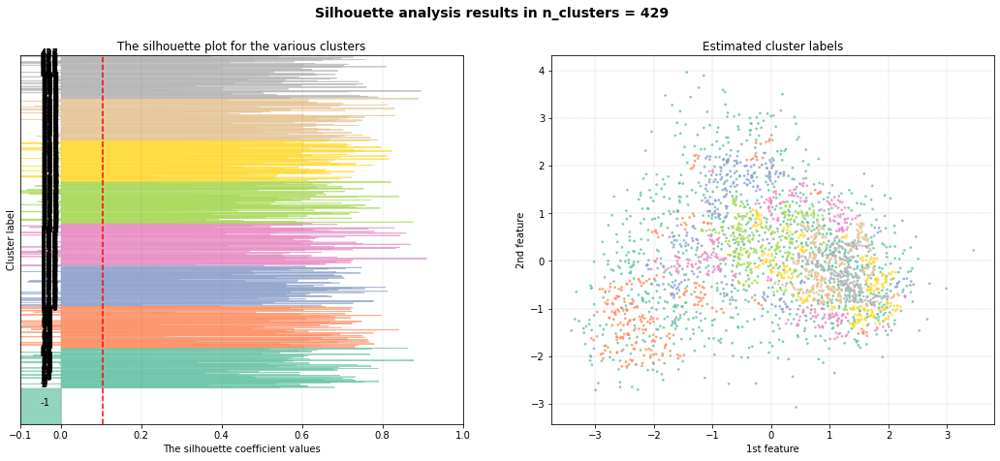

In [ ]:
clustevalres(df)

damping: 0.5


/usr/local/lib/python3.7/dist-packages/sklearn/cluster/_affinity_propagation.py:253: ConvergenceWarning:

Affinity propagation did not converge, this model will not have any cluster centers.

/usr/local/lib/python3.7/dist-packages/sklearn/cluster/_affinity_propagation.py:532: ConvergenceWarning:

This model does not have any cluster centers because affinity propagation did not converge. Labeling every sample as '-1'.



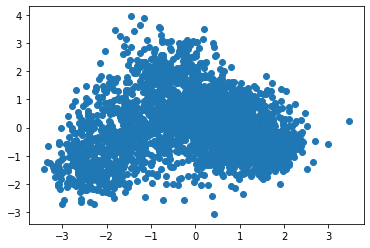

Damping 0.5  resulted in just one big cluster
---
damping: 0.6


/usr/local/lib/python3.7/dist-packages/sklearn/cluster/_affinity_propagation.py:253: ConvergenceWarning:

Affinity propagation did not converge, this model will not have any cluster centers.

/usr/local/lib/python3.7/dist-packages/sklearn/cluster/_affinity_propagation.py:532: ConvergenceWarning:

This model does not have any cluster centers because affinity propagation did not converge. Labeling every sample as '-1'.



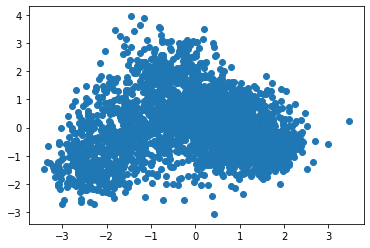

Damping 0.6  resulted in just one big cluster
---
damping: 0.7


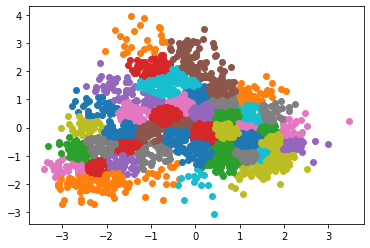

Sillhouette score:  0.47295901568170295
Percentage score:  0.7364795078408515
Number of clusters:  51
---
damping: 0.8


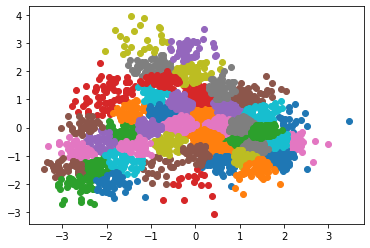

Sillhouette score:  0.4785323431096103
Percentage score:  0.7392661715548051
Number of clusters:  47
---
damping: 0.9


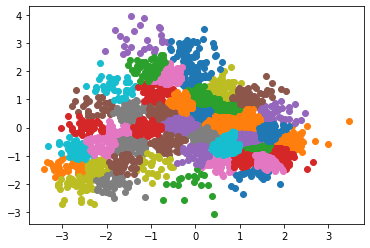

Sillhouette score:  0.47575578400543306
Percentage score:  0.7378778920027165
Number of clusters:  47
---


In [ ]:
vary_damping(df, cluster_with_affinity_propagation)

n: 2


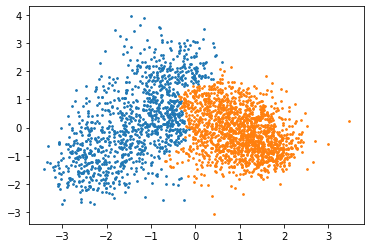

Sillhouette score:  0.5773090282274888
Percentage score:  0.7886545141137444
---
n: 3


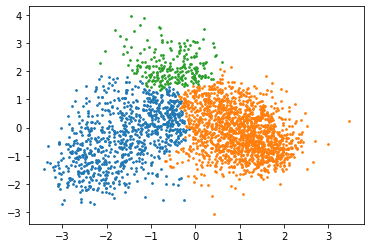

Sillhouette score:  0.5590116162701751
Percentage score:  0.7795058081350876
---
n: 4


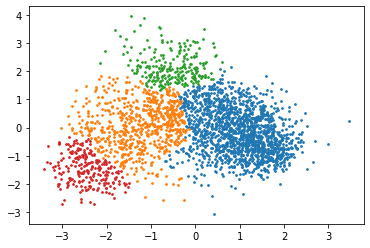

Sillhouette score:  0.5240482234954523
Percentage score:  0.7620241117477262
---
n: 5


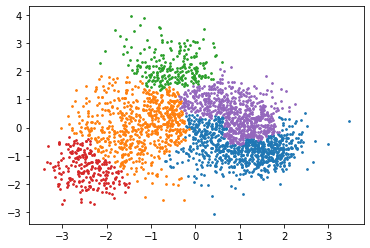

Sillhouette score:  0.39260328479773937
Percentage score:  0.6963016423988697
---
n: 6


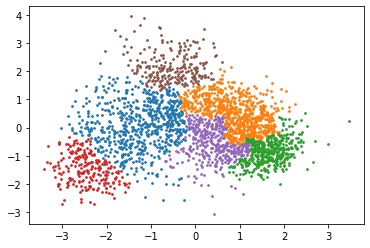

Sillhouette score:  0.38831561239063456
Percentage score:  0.6941578061953173
---
n: 7


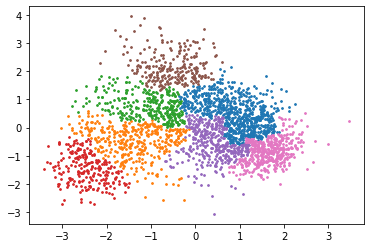

Sillhouette score:  0.40460203277890666
Percentage score:  0.7023010163894533
---
n: 8


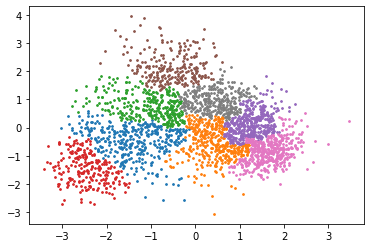

Sillhouette score:  0.42654289419272634
Percentage score:  0.7132714470963631
---
n: 9


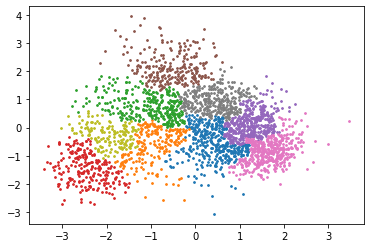

Sillhouette score:  0.4202373089341022
Percentage score:  0.7101186544670511
---
n: 10


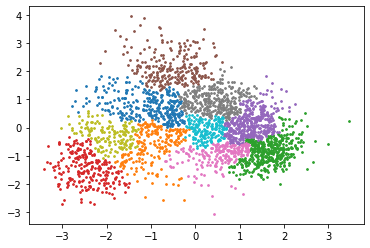

Sillhouette score:  0.40038689114532583
Percentage score:  0.7001934455726629
---
n: 11


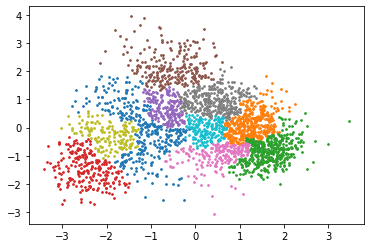

Sillhouette score:  0.4032308806446088
Percentage score:  0.7016154403223044
---
n: 12


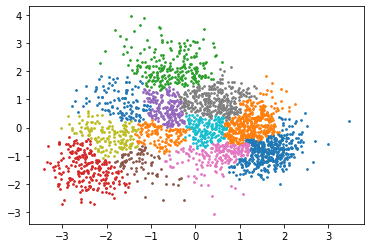

Sillhouette score:  0.41003005401404974
Percentage score:  0.7050150270070249
---
n: 13


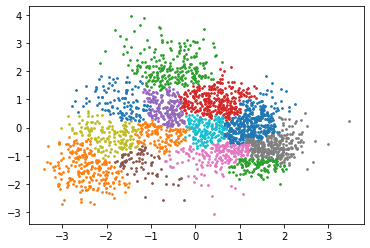

Sillhouette score:  0.3865364250001221
Percentage score:  0.6932682125000611
---
n: 14


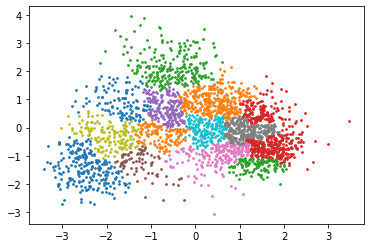

Sillhouette score:  0.3841671492989918
Percentage score:  0.6920835746494959
---


In [ ]:
vary_n_of_clusters(df, agglomerative_clustering)

n: 2


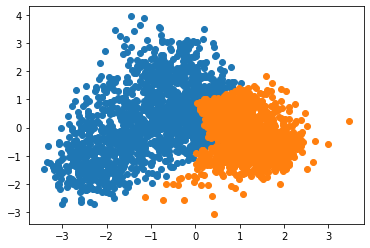

Sillhouette score:  0.5347826851948578
Percentage score:  0.7673913425974289
---
n: 3


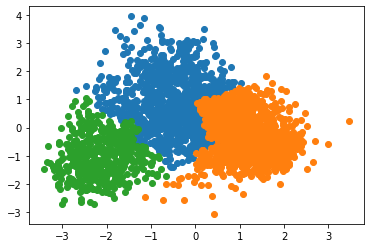

Sillhouette score:  0.5813933131395902
Percentage score:  0.790696656569795
---
n: 4


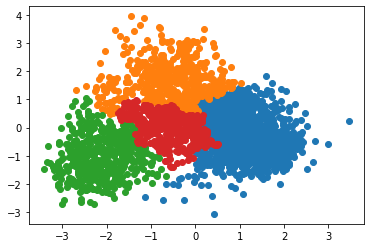

Sillhouette score:  0.5108831658181059
Percentage score:  0.7554415829090529
---
n: 5


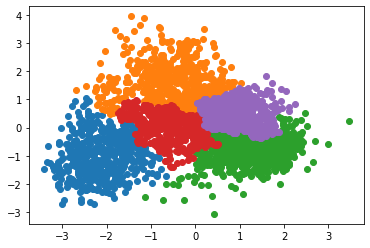

Sillhouette score:  0.4862277059468655
Percentage score:  0.7431138529734327
---
n: 6


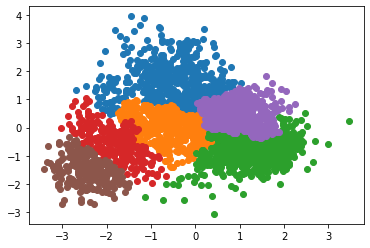

Sillhouette score:  0.4602091280027045
Percentage score:  0.7301045640013523
---
n: 7


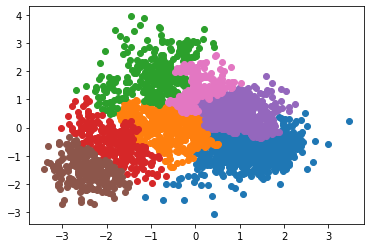

Sillhouette score:  0.4197616995956255
Percentage score:  0.7098808497978127
---
n: 8


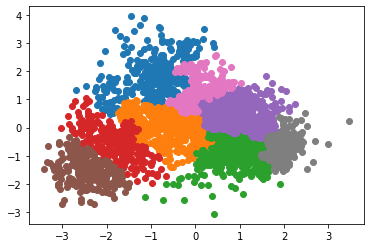

Sillhouette score:  0.380677090268015
Percentage score:  0.6903385451340075
---
n: 9


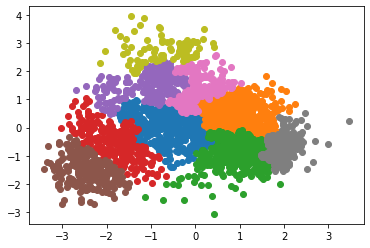

Sillhouette score:  0.3908132260039778
Percentage score:  0.6954066130019889
---
n: 10


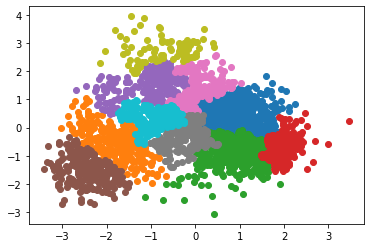

Sillhouette score:  0.37234971290025376
Percentage score:  0.6861748564501269
---
n: 11


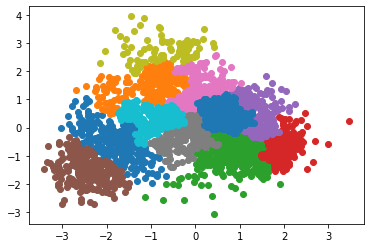

Sillhouette score:  0.35992179397064766
Percentage score:  0.6799608969853238
---
n: 12


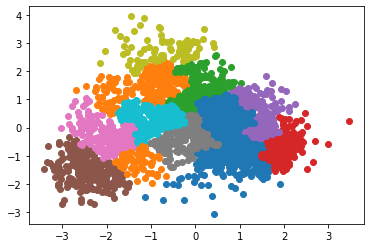

Sillhouette score:  0.35181819458552155
Percentage score:  0.6759090972927608
---
n: 13


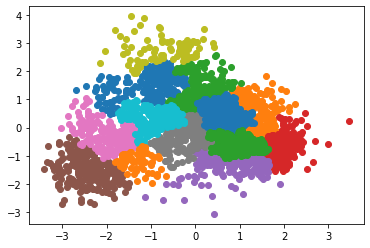

Sillhouette score:  0.36390874975586435
Percentage score:  0.6819543748779322
---
n: 14


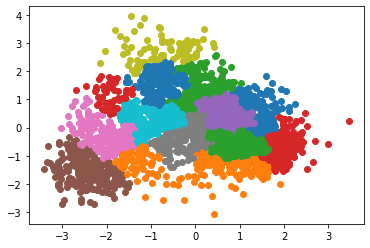

Sillhouette score:  0.37090279450295416
Percentage score:  0.6854513972514771
---


In [ ]:
vary_n_of_clusters(df, cluster_with_birch)

n: 2


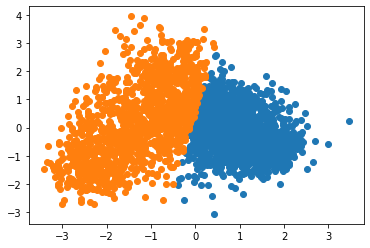

Sillhouette score:  0.5774470858965777
Percentage score:  0.7887235429482888
---
n: 3


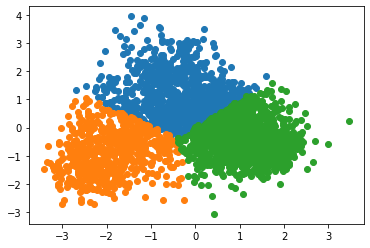

Sillhouette score:  0.6485922433614356
Percentage score:  0.8242961216807179
---
n: 4


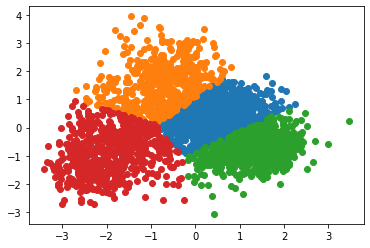

Sillhouette score:  0.5462711950917545
Percentage score:  0.7731355975458772
---
n: 5


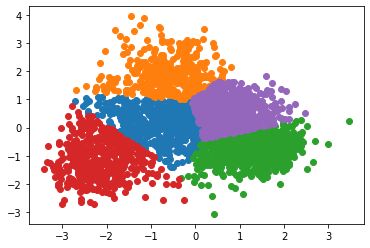

Sillhouette score:  0.5488868004324154
Percentage score:  0.7744434002162077
---
n: 6


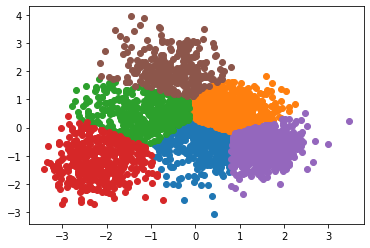

Sillhouette score:  0.5497858874574064
Percentage score:  0.7748929437287032
---
n: 7


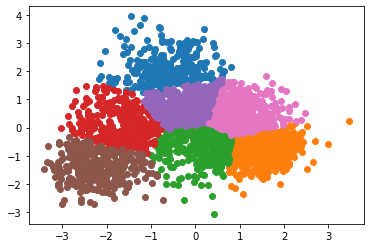

Sillhouette score:  0.5271158919305179
Percentage score:  0.7635579459652589
---
n: 8


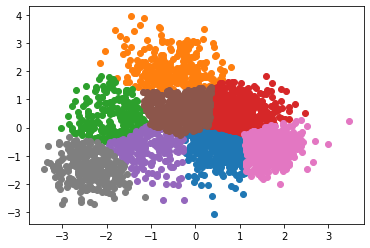

Sillhouette score:  0.5219793685843278
Percentage score:  0.760989684292164
---
n: 9


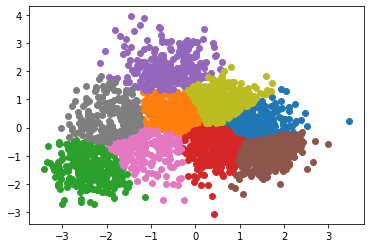

Sillhouette score:  0.5107186597939073
Percentage score:  0.7553593298969536
---
n: 10


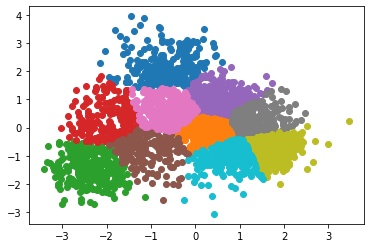

Sillhouette score:  0.5046264127497186
Percentage score:  0.7523132063748593
---
n: 11


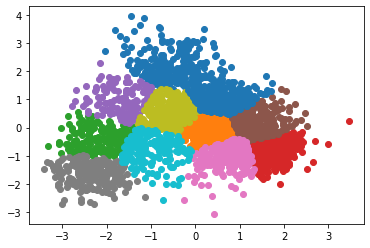

Sillhouette score:  0.49937806932387924
Percentage score:  0.7496890346619396
---
n: 12


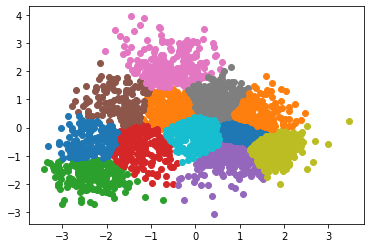

Sillhouette score:  0.49021678303665717
Percentage score:  0.7451083915183285
---
n: 13


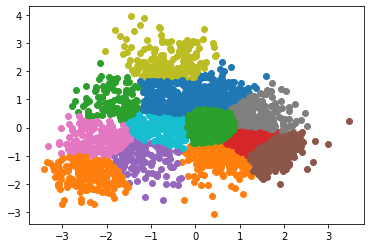

Sillhouette score:  0.4790309546044952
Percentage score:  0.7395154773022476
---
n: 14


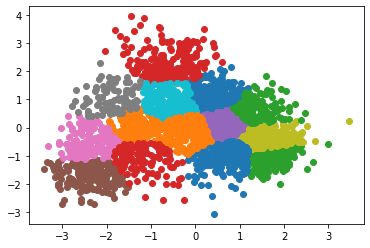

Sillhouette score:  0.48635068073538107
Percentage score:  0.7431753403676905
---


In [ ]:
vary_n_of_clusters(df, cluster_with_kmeans)

n: 2


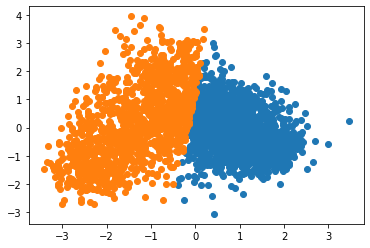

Sillhouette score:  0.5802903032052878
Percentage score:  0.7901451516026439
---
n: 3


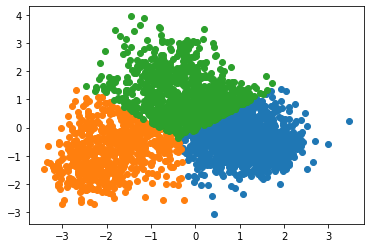

Sillhouette score:  0.6390268222839006
Percentage score:  0.8195134111419503
---
n: 4


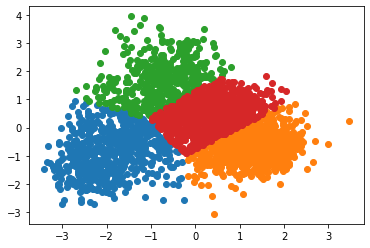

Sillhouette score:  0.5535888844309824
Percentage score:  0.7767944422154912
---
n: 5


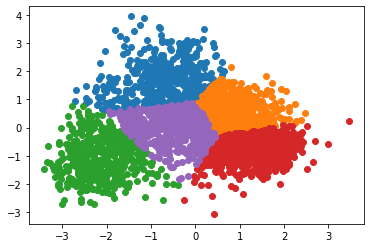

Sillhouette score:  0.5459259863054831
Percentage score:  0.7729629931527415
---
n: 6


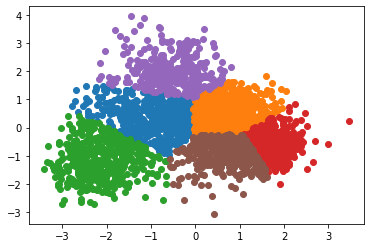

Sillhouette score:  0.515266517379937
Percentage score:  0.7576332586899686
---
n: 7


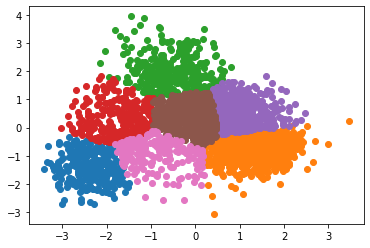

Sillhouette score:  0.5313328715938865
Percentage score:  0.7656664357969433
---
n: 8


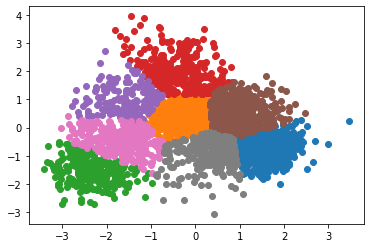

Sillhouette score:  0.5125022437006815
Percentage score:  0.7562511218503407
---
n: 9


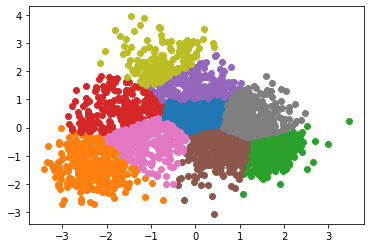

Sillhouette score:  0.4876938241596094
Percentage score:  0.7438469120798047
---
n: 10


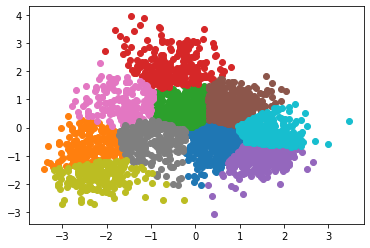

Sillhouette score:  0.48006396869571755
Percentage score:  0.7400319843478588
---
n: 11


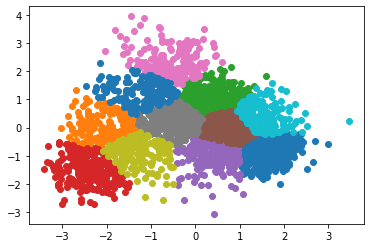

Sillhouette score:  0.49613959882495684
Percentage score:  0.7480697994124784
---
n: 12


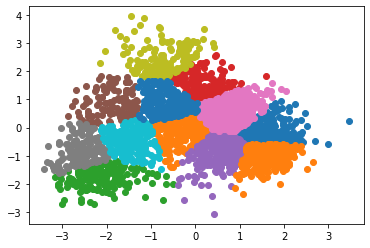

Sillhouette score:  0.47029202036686785
Percentage score:  0.735146010183434
---
n: 13


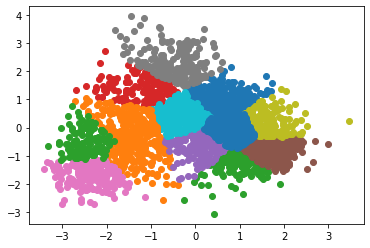

Sillhouette score:  0.47102435936203113
Percentage score:  0.7355121796810156
---
n: 14


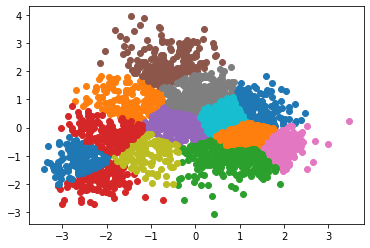

Sillhouette score:  0.45934408157383594
Percentage score:  0.7296720407869179
---


In [ ]:
vary_n_of_clusters(df, cluster_with_mini_batch_kmeans)

n: 2


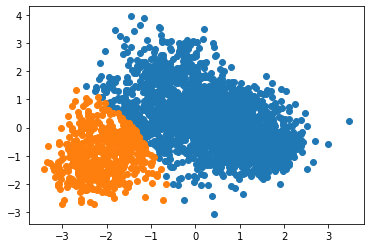

Sillhouette score:  0.585902185145494
Percentage score:  0.792951092572747
---
n: 3


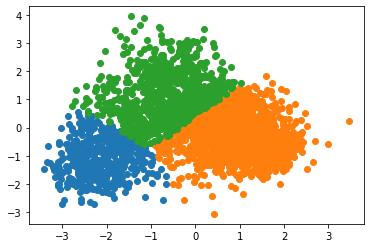

Sillhouette score:  0.6306127998420452
Percentage score:  0.8153063999210226
---
n: 4


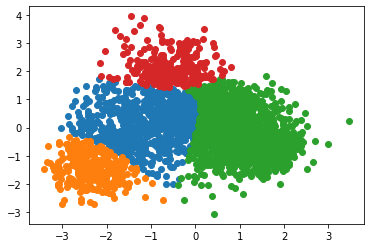

Sillhouette score:  0.5473986331411727
Percentage score:  0.7736993165705863
---
n: 5


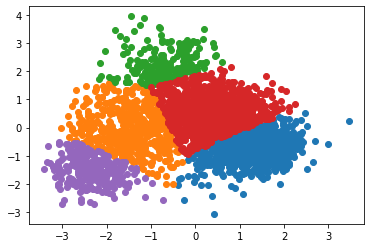

Sillhouette score:  0.49379025836949814
Percentage score:  0.7468951291847491
---
n: 6


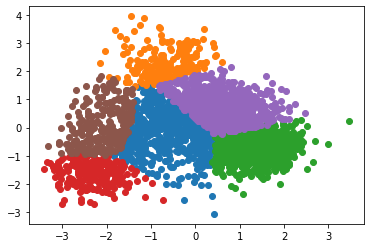

Sillhouette score:  0.4843417023694797
Percentage score:  0.7421708511847398
---
n: 7


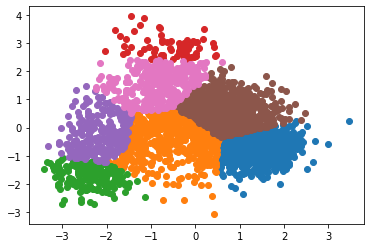

Sillhouette score:  0.4751281565636401
Percentage score:  0.73756407828182
---
n: 8


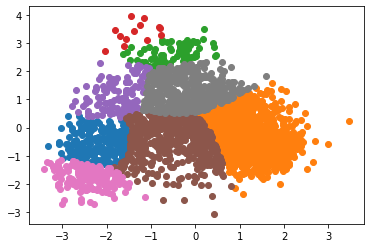

Sillhouette score:  0.4648311734846206
Percentage score:  0.7324155867423103
---
n: 9


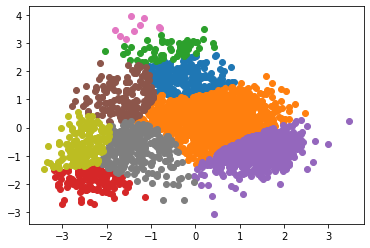

Sillhouette score:  0.3772655897675942
Percentage score:  0.6886327948837971
---
n: 10


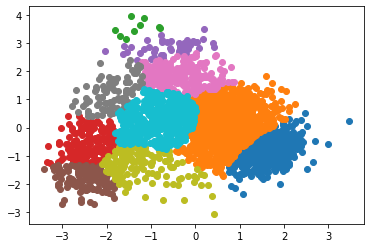

Sillhouette score:  0.40314765616711845
Percentage score:  0.7015738280835593
---
n: 11


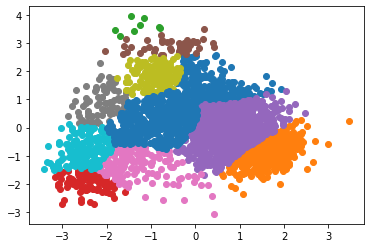

Sillhouette score:  0.3986596344210124
Percentage score:  0.6993298172105062
---
n: 12


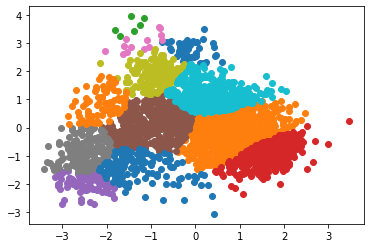

Sillhouette score:  0.4020970130067754
Percentage score:  0.7010485065033877
---
n: 13


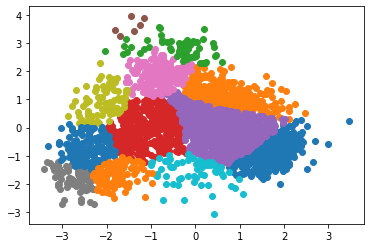

Sillhouette score:  0.3516307478337186
Percentage score:  0.6758153739168593
---
n: 14


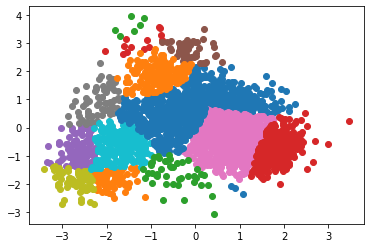

Sillhouette score:  0.3815966112460245
Percentage score:  0.6907983056230123
---


In [ ]:
vary_n_of_clusters(df, spectral_clustering)

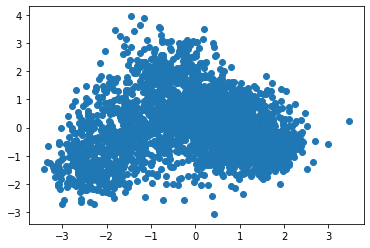

In [ ]:
try: mean_shift_clustering(df)
except: pass

n: 4


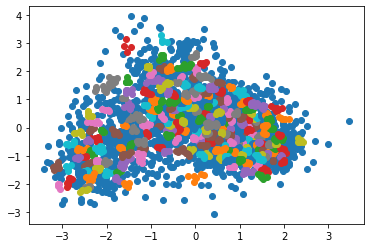

Sillhouette score:  -0.04409020322459104
Percentage score:  0.4779548983877045
---
n: 5


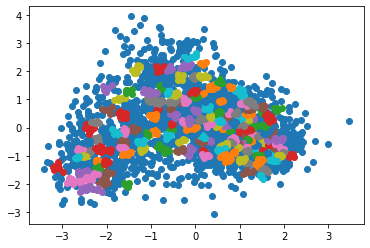

Sillhouette score:  -0.14294262883081746
Percentage score:  0.4285286855845913
---
n: 6


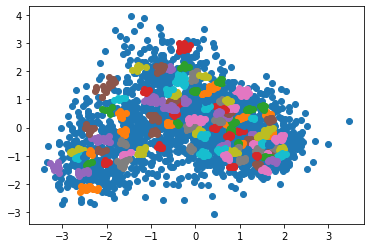

Sillhouette score:  -0.2616060253282288
Percentage score:  0.3691969873358856
---
n: 7


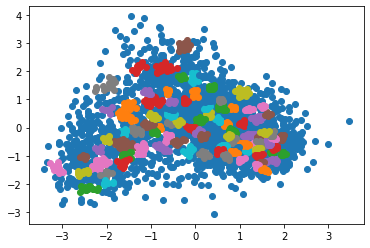

Sillhouette score:  -0.2519460356056595
Percentage score:  0.37402698219717023
---
n: 8


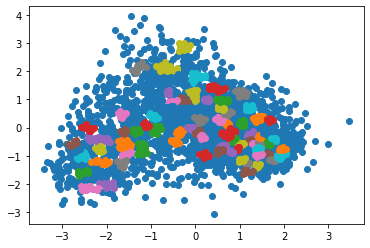

Sillhouette score:  -0.32225486767181344
Percentage score:  0.3388725661640933
---
n: 9


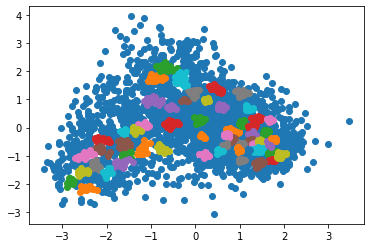

Sillhouette score:  -0.39761035372114895
Percentage score:  0.3011948231394255
---
n: 10


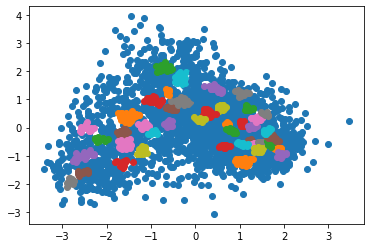

Sillhouette score:  -0.4612443992218735
Percentage score:  0.2693778003890632
---
n: 11


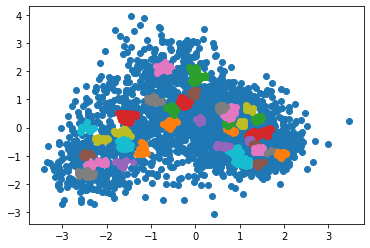

Sillhouette score:  -0.4831237861248123
Percentage score:  0.25843810693759384
---
n: 12


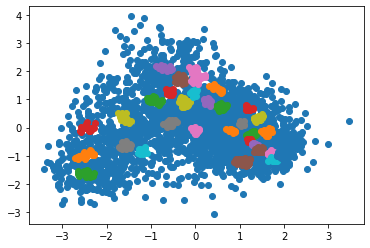

Sillhouette score:  -0.5553805712376054
Percentage score:  0.2223097143811973
---
n: 13


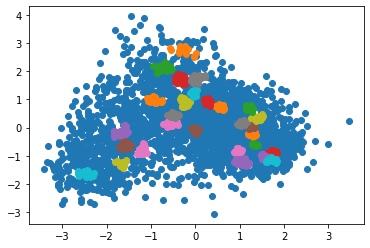

Sillhouette score:  -0.579652301946652
Percentage score:  0.21017384902667402
---
n: 14


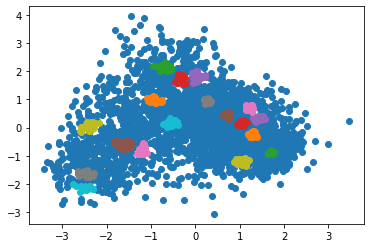

Sillhouette score:  -0.6814214817777423
Percentage score:  0.15928925911112884
---


In [ ]:
vary_min_samples(df, cluster_with_optics)

---

# 6. Latin and French

In [ ]:
la_fr_graph = load_graph('la', 'fr')
graph = hi_en_graph
df = apply_pca(make_df(graph))


[clusteval] >Fit using agglomerative with metric: euclidean, and linkage: ward
[clusteval] >Evaluate using silhouette.


100%|██████████| 23/23 [00:05<00:00,  4.45it/s]


[clusteval] >Compute dendrogram threshold.
[clusteval] >Optimal number clusters detected: [2].
[clusteval] >Fin.
[clusteval] >Estimated number of n_clusters: 2, average silhouette_score=0.393


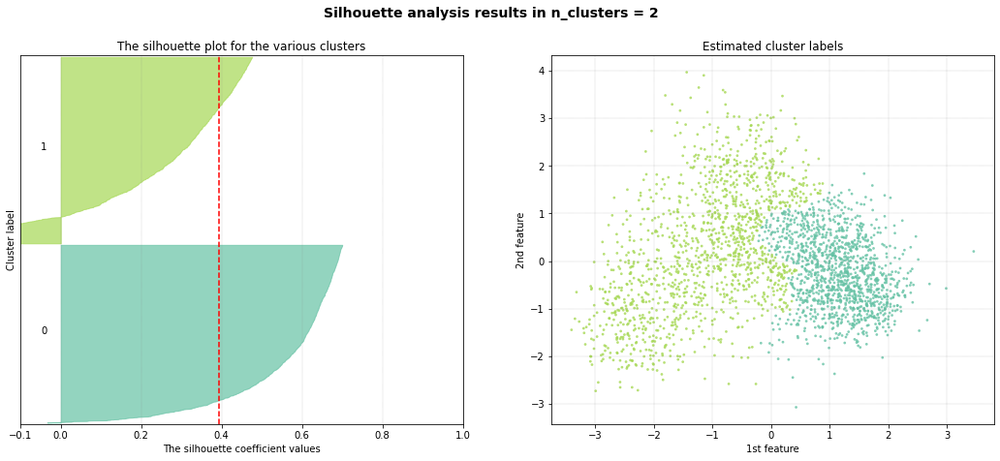


[clusteval] >Fit using agglomerative with metric: euclidean, and linkage: ward
[clusteval] >Evaluate using dbindex.


100%|██████████| 23/23 [00:01<00:00, 21.55it/s]


[clusteval] >Compute dendrogram threshold.
[clusteval] >Optimal number clusters detected: [24].
[clusteval] >Fin.
[clusteval] >Estimated number of n_clusters: 24, average silhouette_score=0.267


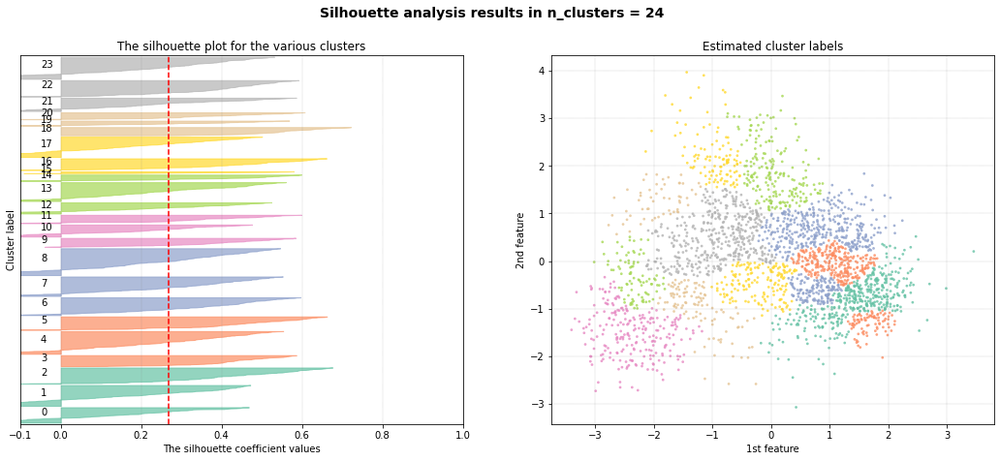


[clusteval] >Fit using dbscan with metric: euclidean, and linkage: ward
[clusteval] >Gridsearch across epsilon..
[clusteval] >Evaluate using silhouette..


100%|██████████| 245/245 [00:48<00:00,  5.10it/s]


[clusteval] >Compute dendrogram threshold.
[clusteval] >Optimal number clusters detected: [2].
[clusteval] >Fin.


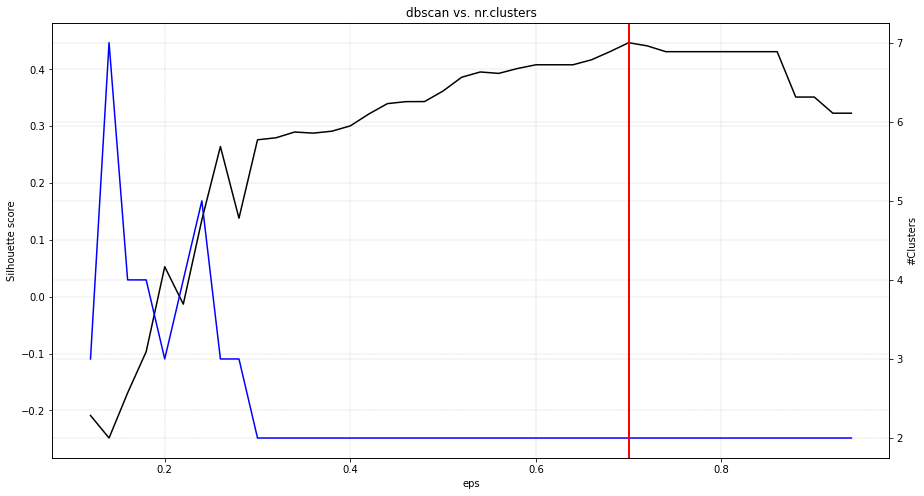

[clusteval] >Estimated number of n_clusters: 1, average silhouette_score=0.447


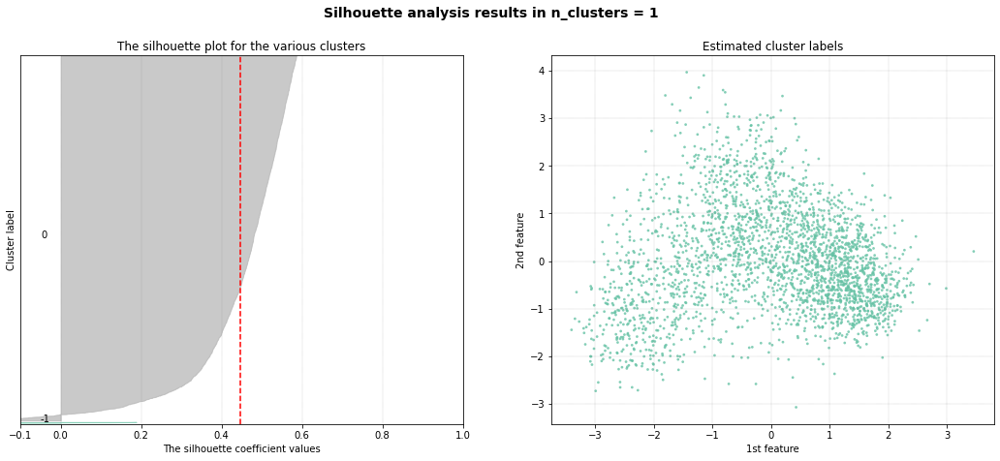


[clusteval] >Fit using hdbscan with metric: euclidean, and linkage: ward
[clusteval] >Estimated number of clusters: 405
[clusteval] >Silhouette Coefficient: 0.111
[clusteval] >Compute dendrogram threshold.
[clusteval] >Optimal number clusters detected: [406].
[clusteval] >Fin.
[clusteval] >Estimated number of n_clusters: 405, average silhouette_score=0.106


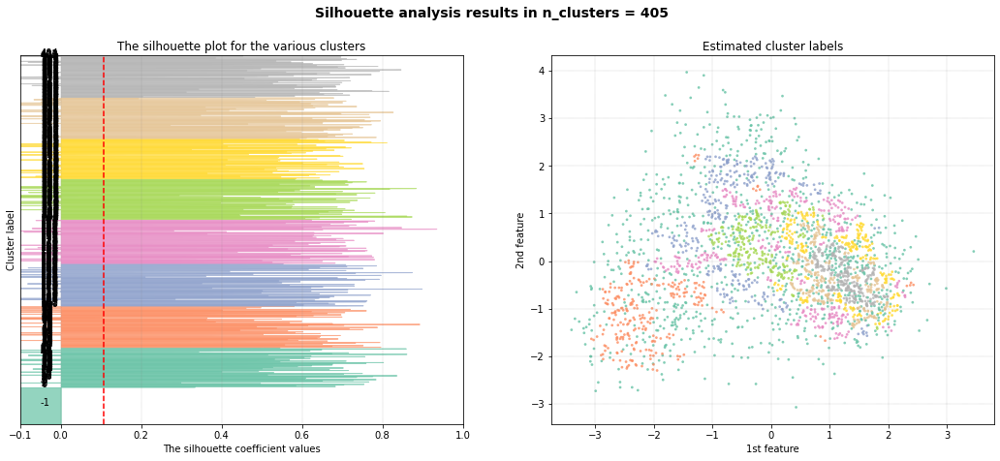

In [ ]:
clustevalres(df)

damping: 0.5


/usr/local/lib/python3.7/dist-packages/sklearn/cluster/_affinity_propagation.py:253: ConvergenceWarning:

Affinity propagation did not converge, this model will not have any cluster centers.

/usr/local/lib/python3.7/dist-packages/sklearn/cluster/_affinity_propagation.py:532: ConvergenceWarning:

This model does not have any cluster centers because affinity propagation did not converge. Labeling every sample as '-1'.



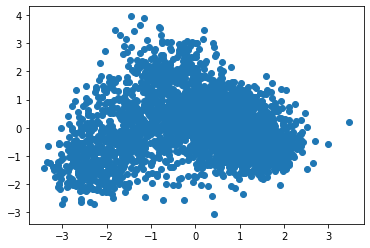

Damping 0.5  resulted in just one big cluster
---
damping: 0.6


/usr/local/lib/python3.7/dist-packages/sklearn/cluster/_affinity_propagation.py:253: ConvergenceWarning:

Affinity propagation did not converge, this model will not have any cluster centers.

/usr/local/lib/python3.7/dist-packages/sklearn/cluster/_affinity_propagation.py:532: ConvergenceWarning:

This model does not have any cluster centers because affinity propagation did not converge. Labeling every sample as '-1'.



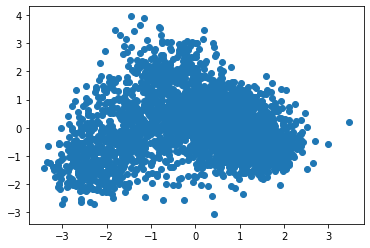

Damping 0.6  resulted in just one big cluster
---
damping: 0.7


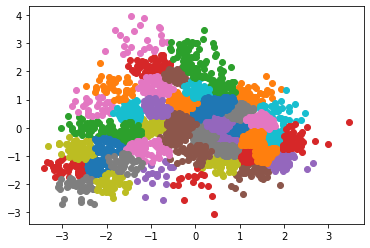

Sillhouette score:  0.4677341282848225
Percentage score:  0.7338670641424112
Number of clusters:  48
---
damping: 0.8


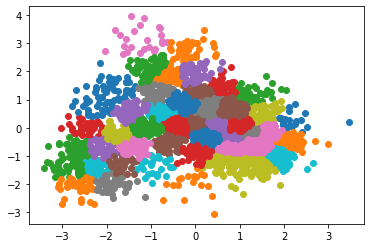

Sillhouette score:  0.4743679605637433
Percentage score:  0.7371839802818716
Number of clusters:  47
---
damping: 0.9


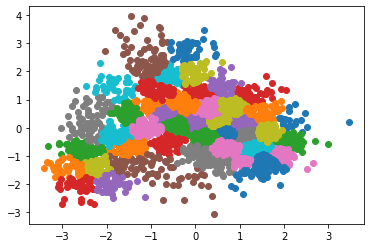

Sillhouette score:  0.475838547422242
Percentage score:  0.737919273711121
Number of clusters:  49
---


In [ ]:
vary_damping(df, cluster_with_affinity_propagation)

n: 2


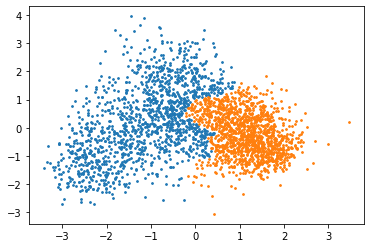

Sillhouette score:  0.5298643733331534
Percentage score:  0.7649321866665767
---
n: 3


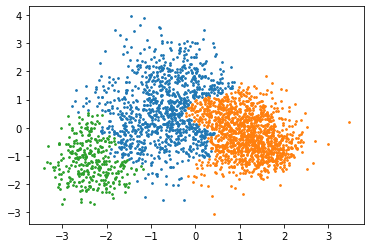

Sillhouette score:  0.5253858567537723
Percentage score:  0.7626929283768862
---
n: 4


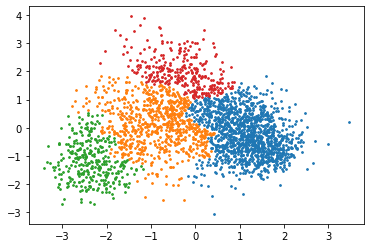

Sillhouette score:  0.5302295488928642
Percentage score:  0.7651147744464322
---
n: 5


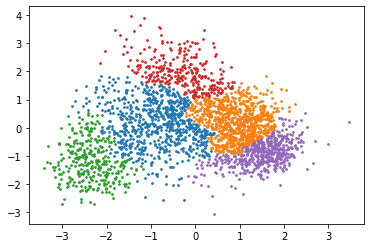

Sillhouette score:  0.4358012941382852
Percentage score:  0.7179006470691426
---
n: 6


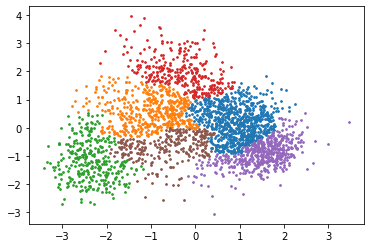

Sillhouette score:  0.4580219602102666
Percentage score:  0.7290109801051333
---
n: 7


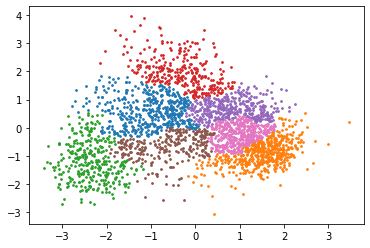

Sillhouette score:  0.39352363698518467
Percentage score:  0.6967618184925923
---
n: 8


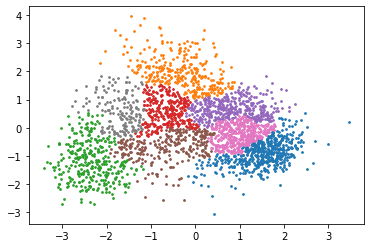

Sillhouette score:  0.3822056050686116
Percentage score:  0.6911028025343058
---
n: 9


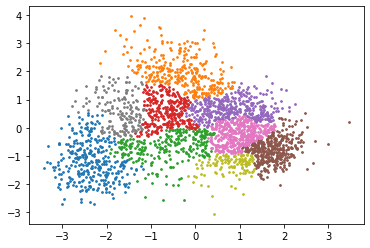

Sillhouette score:  0.400748526015431
Percentage score:  0.7003742630077154
---
n: 10


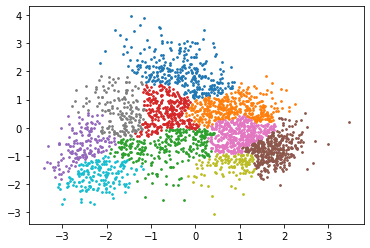

Sillhouette score:  0.39076030657638106
Percentage score:  0.6953801532881905
---
n: 11


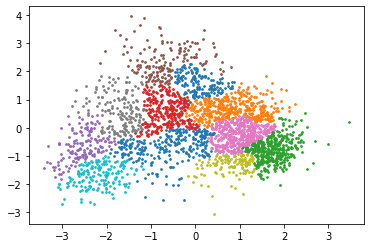

Sillhouette score:  0.37739060028117605
Percentage score:  0.688695300140588
---
n: 12


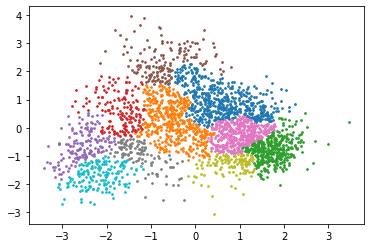

Sillhouette score:  0.3884987938621313
Percentage score:  0.6942493969310657
---
n: 13


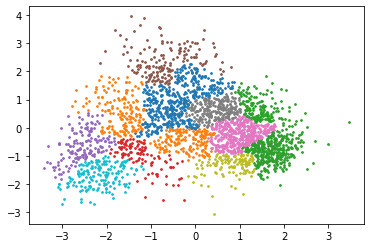

Sillhouette score:  0.4114634120622234
Percentage score:  0.7057317060311117
---
n: 14


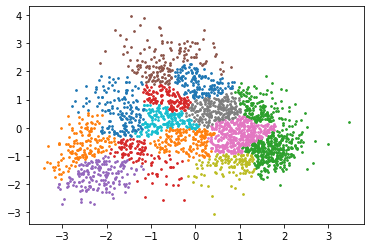

Sillhouette score:  0.4060305758363872
Percentage score:  0.7030152879181936
---


In [ ]:
vary_n_of_clusters(df, agglomerative_clustering)

n: 2


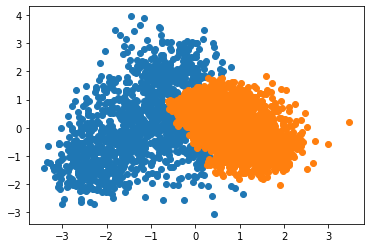

Sillhouette score:  0.5497514612024074
Percentage score:  0.7748757306012037
---
n: 3


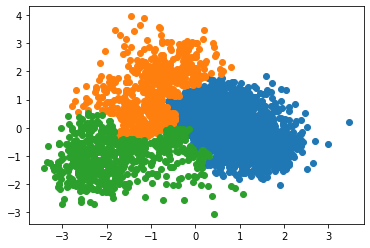

Sillhouette score:  0.5634552819296766
Percentage score:  0.7817276409648384
---
n: 4


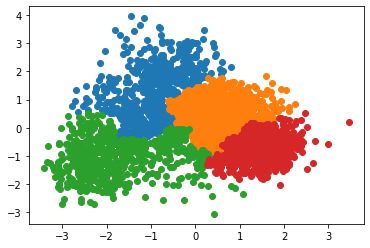

Sillhouette score:  0.47864275170107556
Percentage score:  0.7393213758505378
---
n: 5


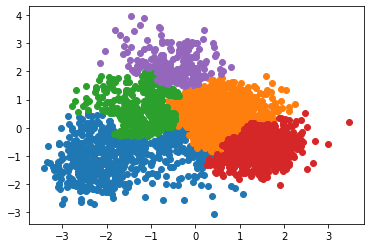

Sillhouette score:  0.4681992915513511
Percentage score:  0.7340996457756755
---
n: 6


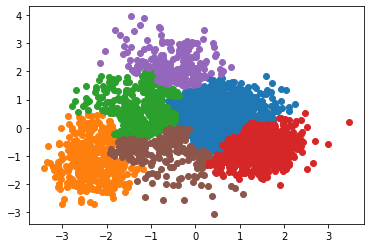

Sillhouette score:  0.48611029015743545
Percentage score:  0.7430551450787177
---
n: 7


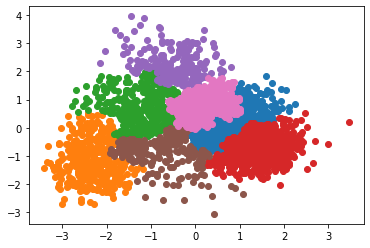

Sillhouette score:  0.42938355428648894
Percentage score:  0.7146917771432445
---
n: 8


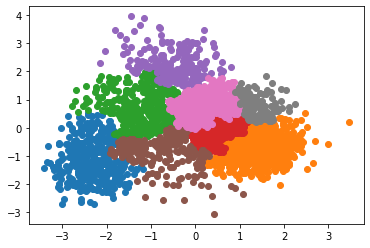

Sillhouette score:  0.40226389659722067
Percentage score:  0.7011319482986104
---
n: 9


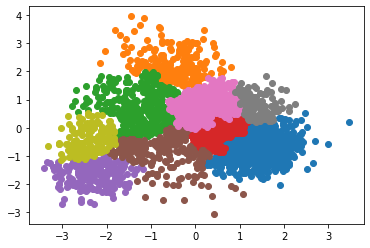

Sillhouette score:  0.3920684608993707
Percentage score:  0.6960342304496854
---
n: 10


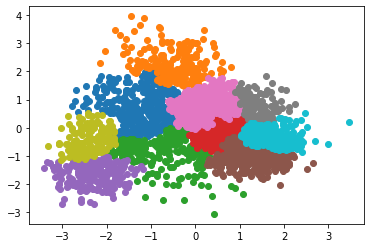

Sillhouette score:  0.39146714577415936
Percentage score:  0.6957335728870797
---
n: 11


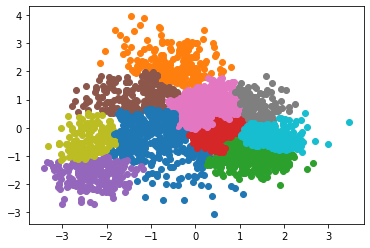

Sillhouette score:  0.38584851107605184
Percentage score:  0.692924255538026
---
n: 12


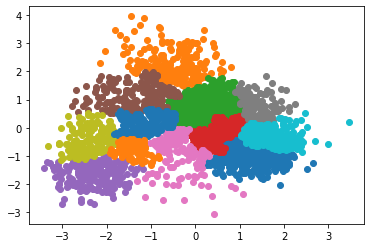

Sillhouette score:  0.38182284204746686
Percentage score:  0.6909114210237335
---
n: 13


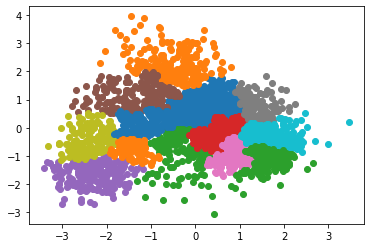

Sillhouette score:  0.38087130445786854
Percentage score:  0.6904356522289343
---
n: 14


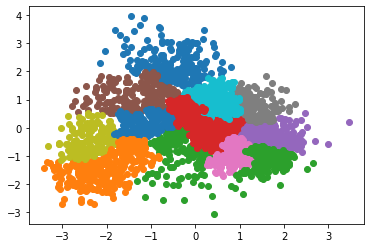

Sillhouette score:  0.3752429398906565
Percentage score:  0.6876214699453282
---


In [ ]:
vary_n_of_clusters(df, cluster_with_birch)

n: 2


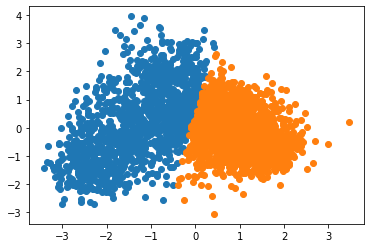

Sillhouette score:  0.5772495409120942
Percentage score:  0.7886247704560472
---
n: 3


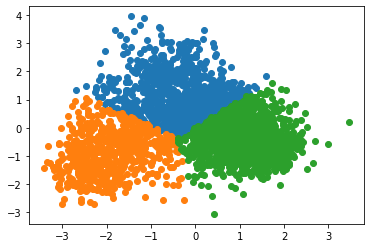

Sillhouette score:  0.6488444734841227
Percentage score:  0.8244222367420613
---
n: 4


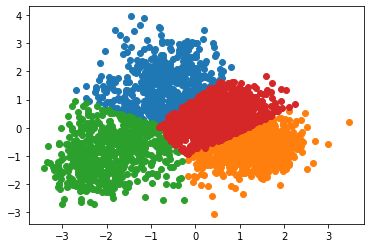

Sillhouette score:  0.5454710084768362
Percentage score:  0.7727355042384181
---
n: 5


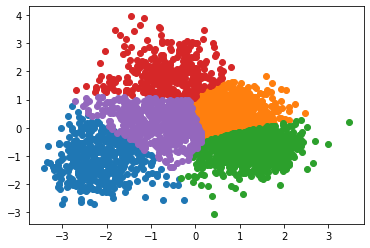

Sillhouette score:  0.5484594675032322
Percentage score:  0.7742297337516161
---
n: 6


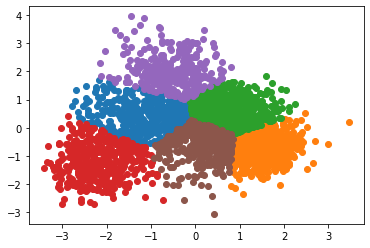

Sillhouette score:  0.5477873057705016
Percentage score:  0.7738936528852508
---
n: 7


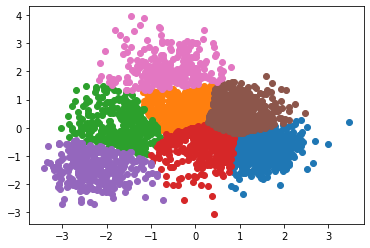

Sillhouette score:  0.5284171649931048
Percentage score:  0.7642085824965523
---
n: 8


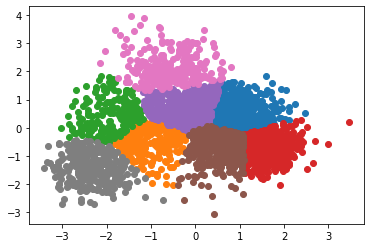

Sillhouette score:  0.5195136502489555
Percentage score:  0.7597568251244777
---
n: 9


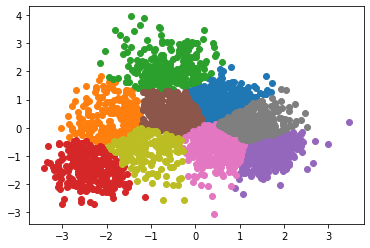

Sillhouette score:  0.5100287974867899
Percentage score:  0.7550143987433949
---
n: 10


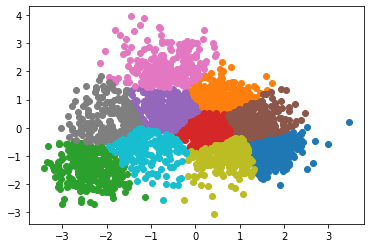

Sillhouette score:  0.5053781478006077
Percentage score:  0.7526890739003038
---
n: 11


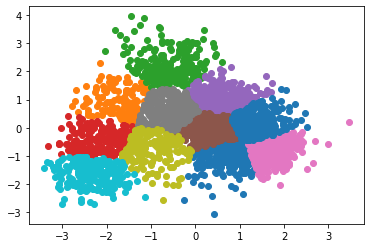

Sillhouette score:  0.5013796706480712
Percentage score:  0.7506898353240357
---
n: 12


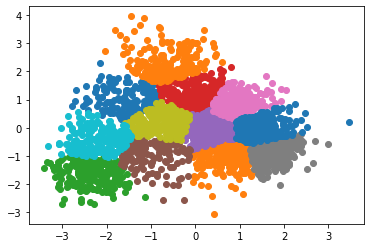

Sillhouette score:  0.48503612199845475
Percentage score:  0.7425180609992273
---
n: 13


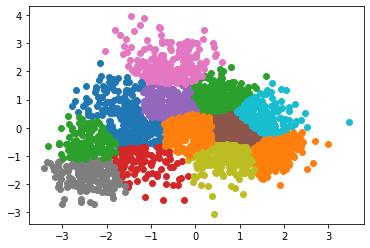

Sillhouette score:  0.500034866312834
Percentage score:  0.750017433156417
---
n: 14


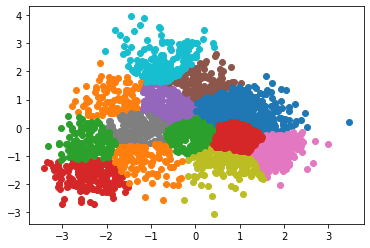

Sillhouette score:  0.49077388089455953
Percentage score:  0.7453869404472797
---


In [ ]:
vary_n_of_clusters(df, cluster_with_kmeans)

n: 2


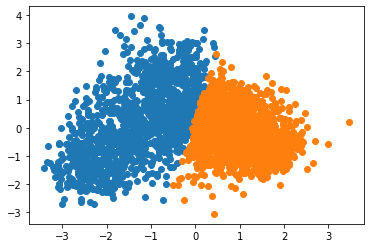

Sillhouette score:  0.5758865821078443
Percentage score:  0.7879432910539221
---
n: 3


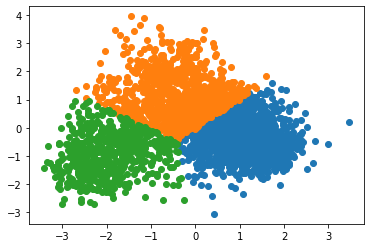

Sillhouette score:  0.6465243099466811
Percentage score:  0.8232621549733405
---
n: 4


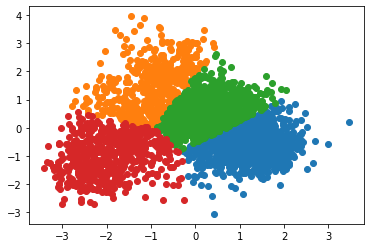

Sillhouette score:  0.5480560491876929
Percentage score:  0.7740280245938465
---
n: 5


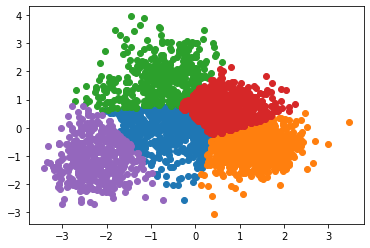

Sillhouette score:  0.5499225474340681
Percentage score:  0.774961273717034
---
n: 6


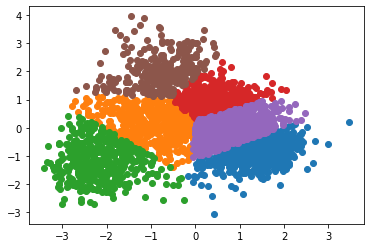

Sillhouette score:  0.4799746323201689
Percentage score:  0.7399873161600845
---
n: 7


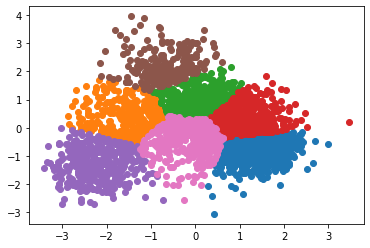

Sillhouette score:  0.5207209250413203
Percentage score:  0.7603604625206601
---
n: 8


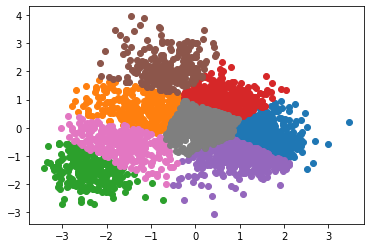

Sillhouette score:  0.46296113434079617
Percentage score:  0.7314805671703981
---
n: 9


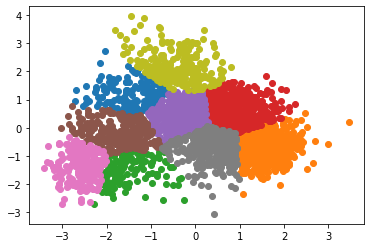

Sillhouette score:  0.5029819356859765
Percentage score:  0.7514909678429882
---
n: 10


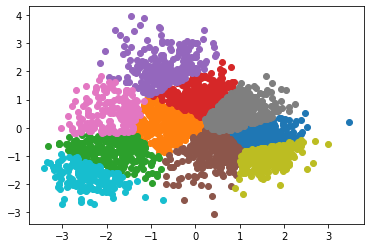

Sillhouette score:  0.4487207136554066
Percentage score:  0.7243603568277033
---
n: 11


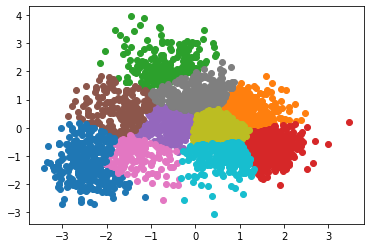

Sillhouette score:  0.484630294948396
Percentage score:  0.742315147474198
---
n: 12


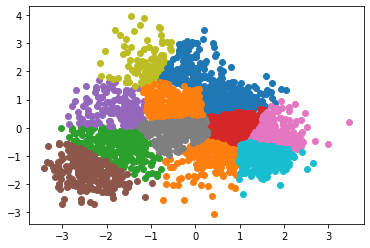

Sillhouette score:  0.4611029809930646
Percentage score:  0.7305514904965323
---
n: 13


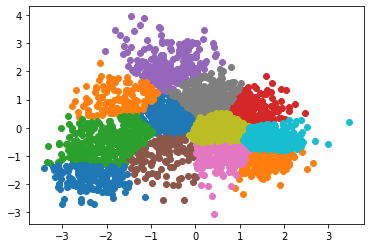

Sillhouette score:  0.4671743884651684
Percentage score:  0.7335871942325842
---
n: 14


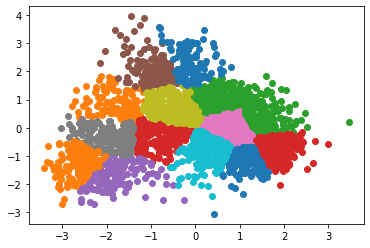

Sillhouette score:  0.45312952866637296
Percentage score:  0.7265647643331865
---


In [ ]:
vary_n_of_clusters(df, cluster_with_mini_batch_kmeans)

n: 2


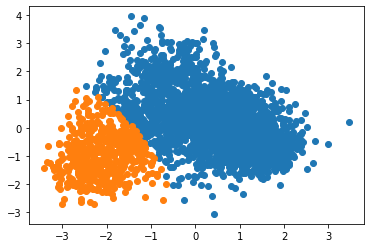

Sillhouette score:  0.5861651733272881
Percentage score:  0.7930825866636441
---
n: 3


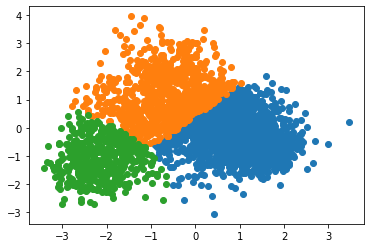

Sillhouette score:  0.6307261539145488
Percentage score:  0.8153630769572744
---
n: 4


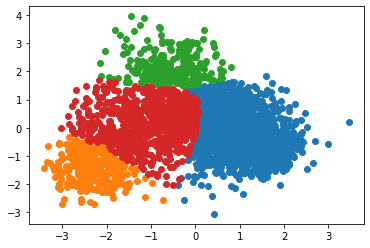

Sillhouette score:  0.548132257146327
Percentage score:  0.7740661285731635
---
n: 5


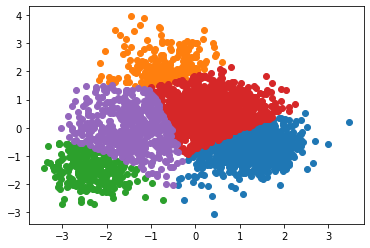

Sillhouette score:  0.49556653498828734
Percentage score:  0.7477832674941437
---
n: 6


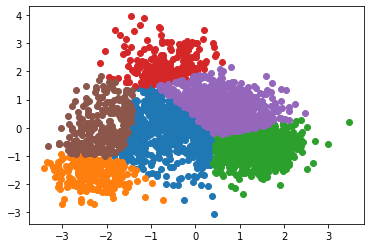

Sillhouette score:  0.4842016289075522
Percentage score:  0.7421008144537761
---
n: 7


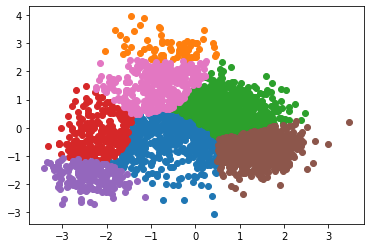

Sillhouette score:  0.47580538212257895
Percentage score:  0.7379026910612895
---
n: 8


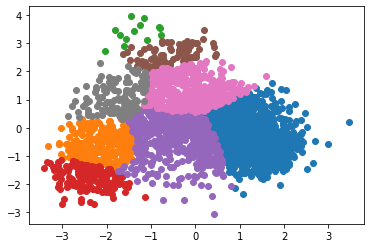

Sillhouette score:  0.4651815028372103
Percentage score:  0.7325907514186052
---
n: 9


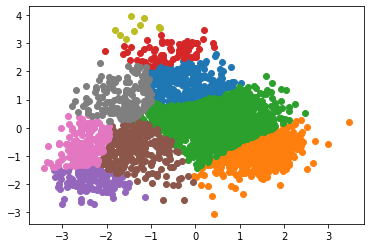

Sillhouette score:  0.37542205420627905
Percentage score:  0.6877110271031395
---
n: 10


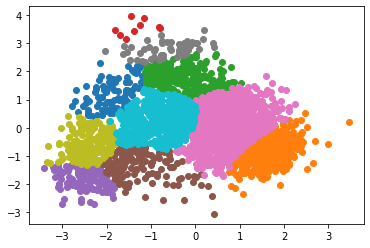

Sillhouette score:  0.4051235772051609
Percentage score:  0.7025617886025805
---
n: 11


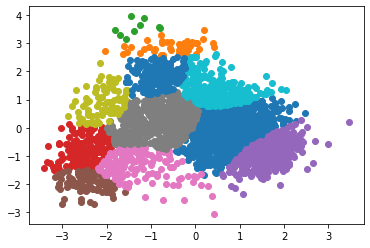

Sillhouette score:  0.4013053622140266
Percentage score:  0.7006526811070133
---
n: 12


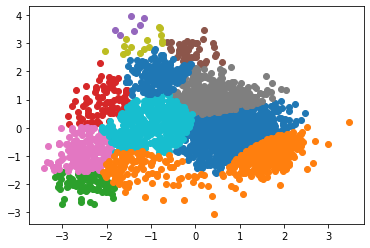

Sillhouette score:  0.40112468299000437
Percentage score:  0.7005623414950022
---
n: 13


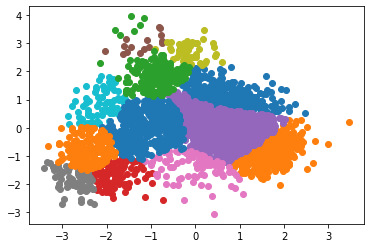

Sillhouette score:  0.353353450983152
Percentage score:  0.676676725491576
---
n: 14


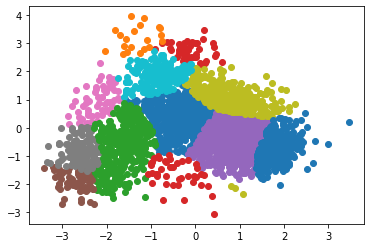

Sillhouette score:  0.38567487679685863
Percentage score:  0.6928374383984293
---


In [ ]:
vary_n_of_clusters(df, spectral_clustering)

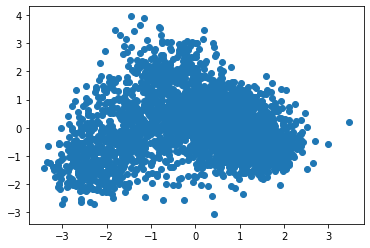

In [ ]:
try: mean_shift_clustering(df)
except: pass

n: 4


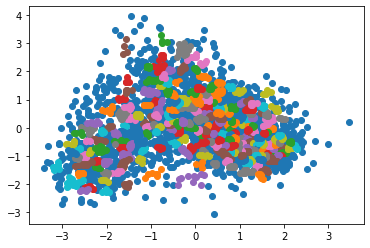

Sillhouette score:  0.000488403614612357
Percentage score:  0.5002442018073062
---
n: 5


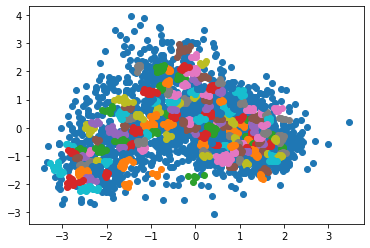

Sillhouette score:  -0.12283518474916698
Percentage score:  0.4385824076254165
---
n: 6


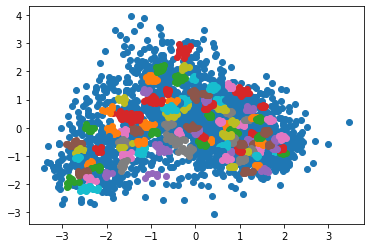

Sillhouette score:  -0.2205684270252941
Percentage score:  0.38971578648735294
---
n: 7


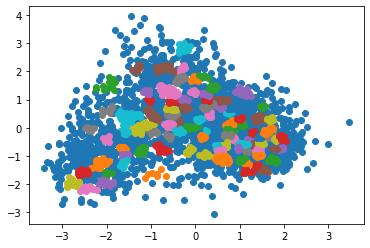

Sillhouette score:  -0.23146511599041408
Percentage score:  0.38426744200479296
---
n: 8


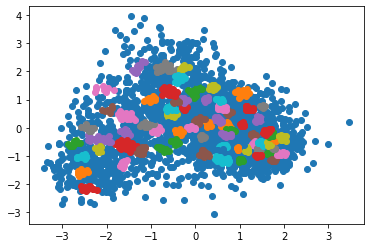

Sillhouette score:  -0.3372737169154837
Percentage score:  0.33136314154225815
---
n: 9


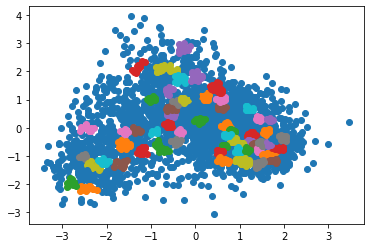

Sillhouette score:  -0.38640098539889955
Percentage score:  0.3067995073005502
---
n: 10


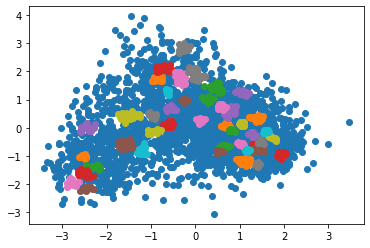

Sillhouette score:  -0.4668762210785936
Percentage score:  0.2665618894607032
---
n: 11


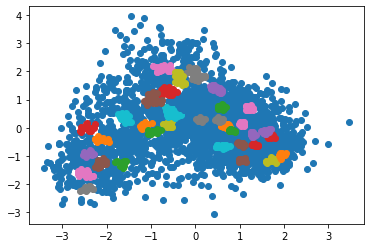

Sillhouette score:  -0.5223215032298388
Percentage score:  0.23883924838508058
---
n: 12


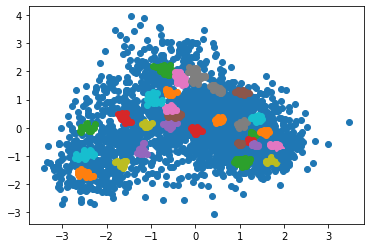

Sillhouette score:  -0.5721422844408771
Percentage score:  0.21392885777956144
---
n: 13


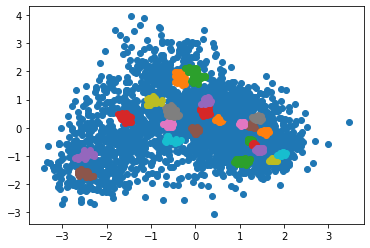

Sillhouette score:  -0.6355760742611265
Percentage score:  0.18221196286943675
---
n: 14


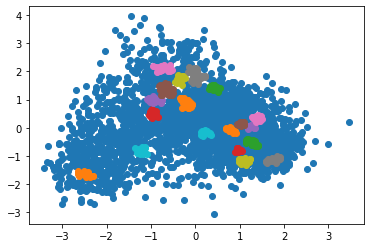

Sillhouette score:  -0.6560214711360207
Percentage score:  0.17198926443198964
---


In [ ]:
vary_min_samples(df, cluster_with_optics)

---

# 7. Hindi and Tamil

In [ ]:
hi_ta_graph = load_graph('hi', 'ta')
graph = hi_en_graph
df = apply_pca(make_df(graph))


[clusteval] >Fit using agglomerative with metric: euclidean, and linkage: ward
[clusteval] >Evaluate using silhouette.


100%|██████████| 23/23 [00:04<00:00,  5.54it/s]


[clusteval] >Compute dendrogram threshold.
[clusteval] >Optimal number clusters detected: [2].
[clusteval] >Fin.
[clusteval] >Estimated number of n_clusters: 2, average silhouette_score=0.427


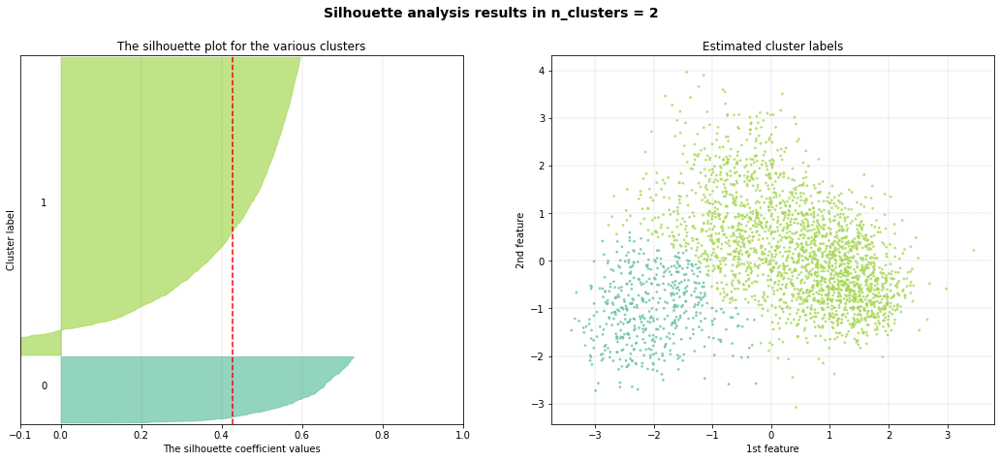


[clusteval] >Fit using agglomerative with metric: euclidean, and linkage: ward
[clusteval] >Evaluate using dbindex.


100%|██████████| 23/23 [00:01<00:00, 22.58it/s]


[clusteval] >Compute dendrogram threshold.
[clusteval] >Optimal number clusters detected: [24].
[clusteval] >Fin.
[clusteval] >Estimated number of n_clusters: 24, average silhouette_score=0.271


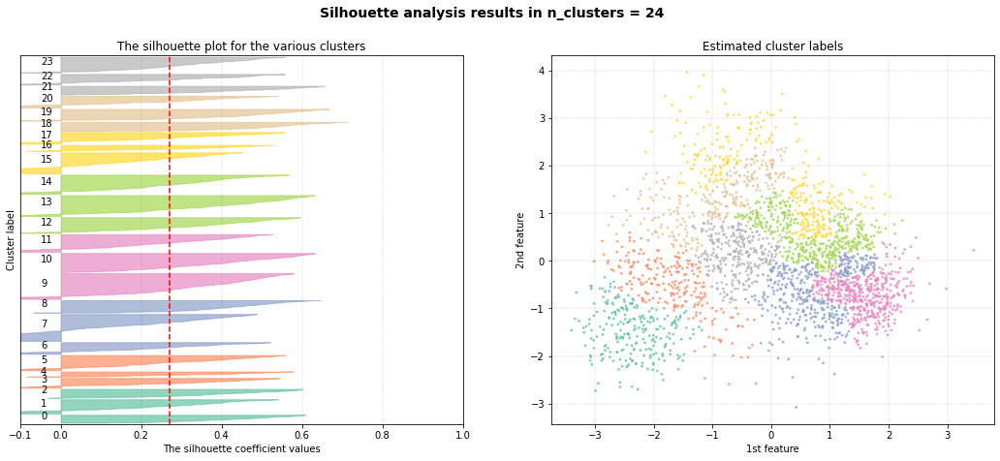


[clusteval] >Fit using dbscan with metric: euclidean, and linkage: ward
[clusteval] >Gridsearch across epsilon..
[clusteval] >Evaluate using silhouette..


100%|██████████| 245/245 [00:42<00:00,  5.75it/s]


[clusteval] >Compute dendrogram threshold.
[clusteval] >Optimal number clusters detected: [2].
[clusteval] >Fin.


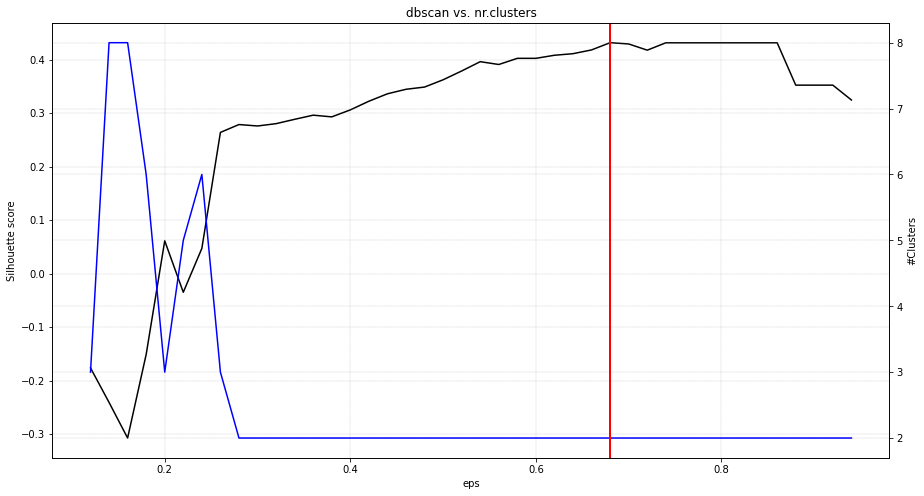

[clusteval] >Estimated number of n_clusters: 1, average silhouette_score=0.432


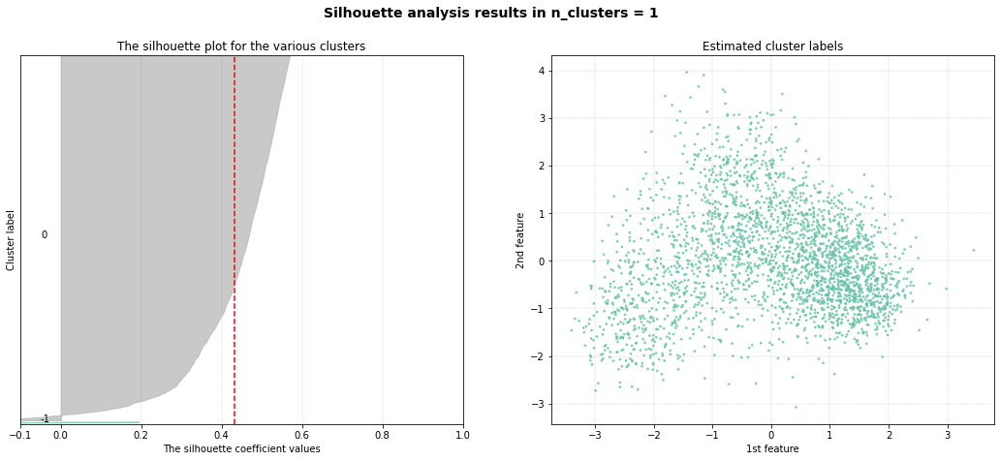


[clusteval] >Fit using hdbscan with metric: euclidean, and linkage: ward
[clusteval] >Estimated number of clusters: 417
[clusteval] >Silhouette Coefficient: 0.109
[clusteval] >Compute dendrogram threshold.
[clusteval] >Optimal number clusters detected: [418].
[clusteval] >Fin.
[clusteval] >Estimated number of n_clusters: 417, average silhouette_score=0.106


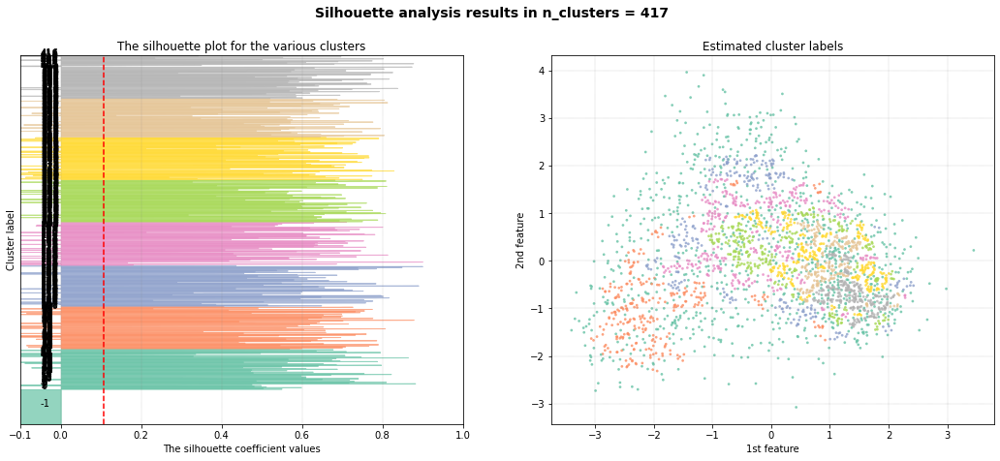

In [ ]:
clustevalres(df)

damping: 0.5


/usr/local/lib/python3.7/dist-packages/sklearn/cluster/_affinity_propagation.py:253: ConvergenceWarning:

Affinity propagation did not converge, this model will not have any cluster centers.

/usr/local/lib/python3.7/dist-packages/sklearn/cluster/_affinity_propagation.py:532: ConvergenceWarning:

This model does not have any cluster centers because affinity propagation did not converge. Labeling every sample as '-1'.



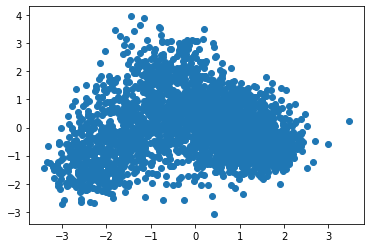

Damping 0.5  resulted in just one big cluster
---
damping: 0.6


/usr/local/lib/python3.7/dist-packages/sklearn/cluster/_affinity_propagation.py:253: ConvergenceWarning:

Affinity propagation did not converge, this model will not have any cluster centers.

/usr/local/lib/python3.7/dist-packages/sklearn/cluster/_affinity_propagation.py:532: ConvergenceWarning:

This model does not have any cluster centers because affinity propagation did not converge. Labeling every sample as '-1'.



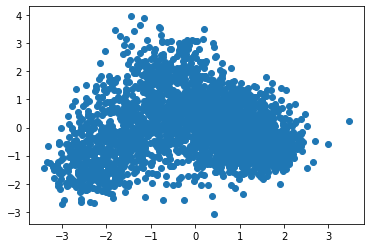

Damping 0.6  resulted in just one big cluster
---
damping: 0.7


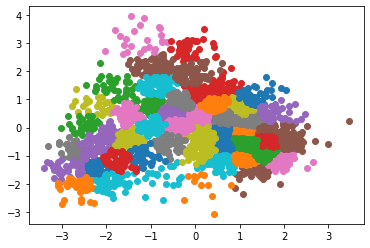

Sillhouette score:  0.4665492628006979
Percentage score:  0.733274631400349
Number of clusters:  50
---
damping: 0.8


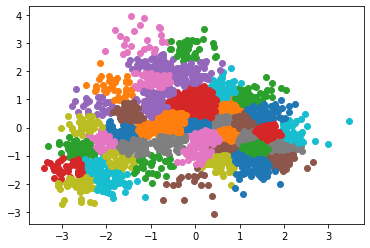

Sillhouette score:  0.4711932315987496
Percentage score:  0.7355966157993747
Number of clusters:  48
---
damping: 0.9


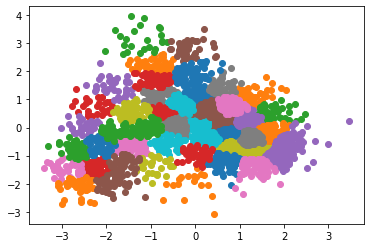

Sillhouette score:  0.47908335505013916
Percentage score:  0.7395416775250696
Number of clusters:  46
---


In [ ]:
vary_damping(df, cluster_with_affinity_propagation)

n: 2


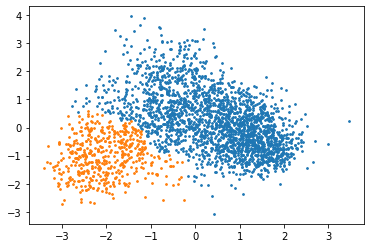

Sillhouette score:  0.5783418127757377
Percentage score:  0.7891709063878689
---
n: 3


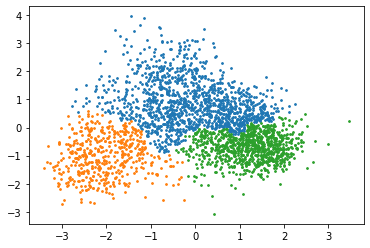

Sillhouette score:  0.5153899544208901
Percentage score:  0.7576949772104451
---
n: 4


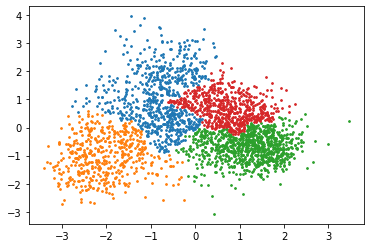

Sillhouette score:  0.48688563816299263
Percentage score:  0.7434428190814963
---
n: 5


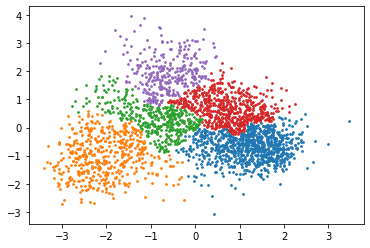

Sillhouette score:  0.5009920993003476
Percentage score:  0.7504960496501738
---
n: 6


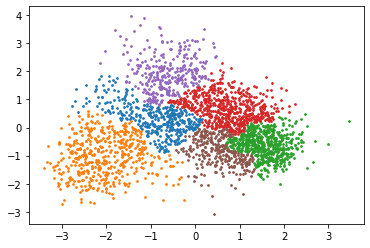

Sillhouette score:  0.46065324081674086
Percentage score:  0.7303266204083705
---
n: 7


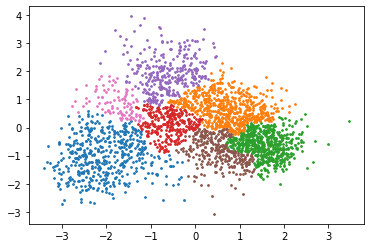

Sillhouette score:  0.43650048480771975
Percentage score:  0.7182502424038599
---
n: 8


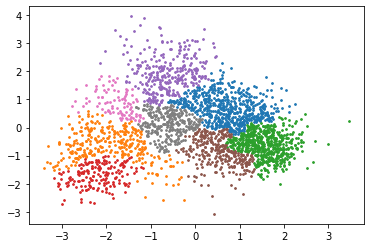

Sillhouette score:  0.4161008710527821
Percentage score:  0.708050435526391
---
n: 9


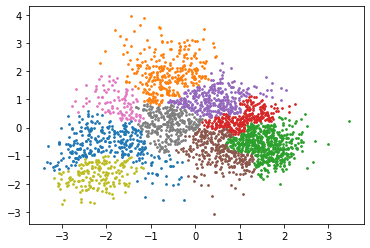

Sillhouette score:  0.38286638105395454
Percentage score:  0.6914331905269773
---
n: 10


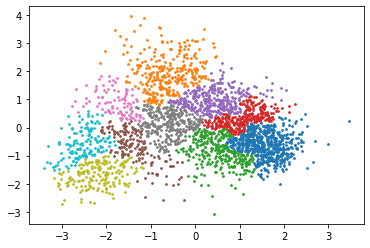

Sillhouette score:  0.4037818710538254
Percentage score:  0.7018909355269127
---
n: 11


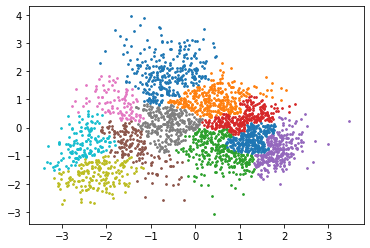

Sillhouette score:  0.37262792127305017
Percentage score:  0.6863139606365251
---
n: 12


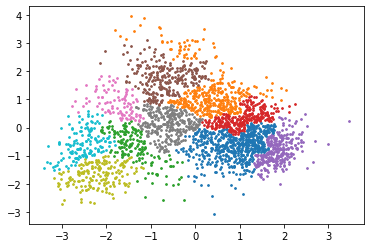

Sillhouette score:  0.3731101083372205
Percentage score:  0.6865550541686103
---
n: 13


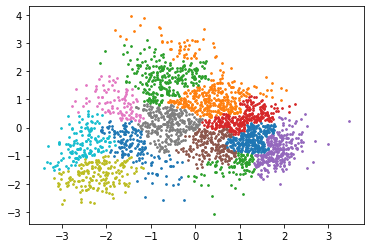

Sillhouette score:  0.3801238486507292
Percentage score:  0.6900619243253646
---
n: 14


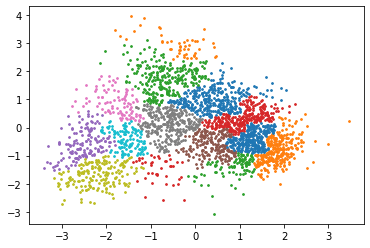

Sillhouette score:  0.38202052573363604
Percentage score:  0.691010262866818
---


In [ ]:
vary_n_of_clusters(df, agglomerative_clustering)

n: 2


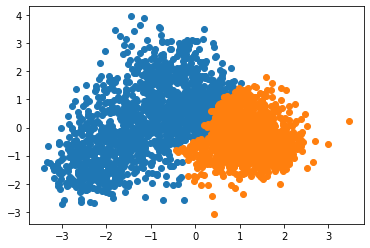

Sillhouette score:  0.5354568135930318
Percentage score:  0.7677284067965159
---
n: 3


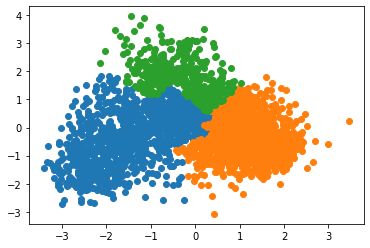

Sillhouette score:  0.5486387289177328
Percentage score:  0.7743193644588664
---
n: 4


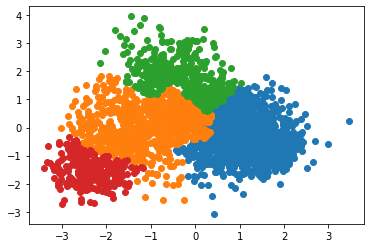

Sillhouette score:  0.5394366081656026
Percentage score:  0.7697183040828013
---
n: 5


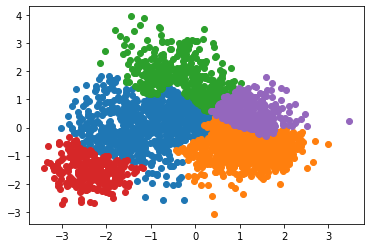

Sillhouette score:  0.4102005722522451
Percentage score:  0.7051002861261225
---
n: 6


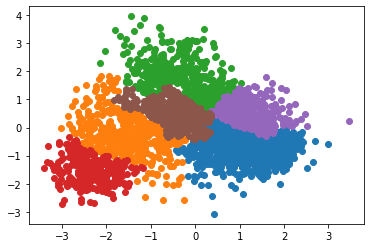

Sillhouette score:  0.42116684800827014
Percentage score:  0.7105834240041351
---
n: 7


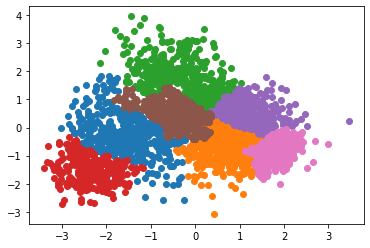

Sillhouette score:  0.40906579226483747
Percentage score:  0.7045328961324188
---
n: 8


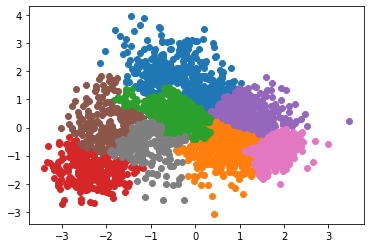

Sillhouette score:  0.4288912664128866
Percentage score:  0.7144456332064433
---
n: 9


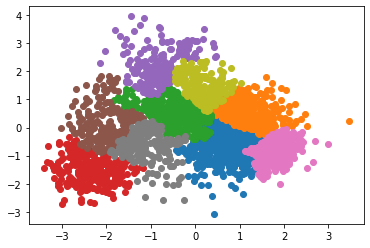

Sillhouette score:  0.427428901723788
Percentage score:  0.713714450861894
---
n: 10


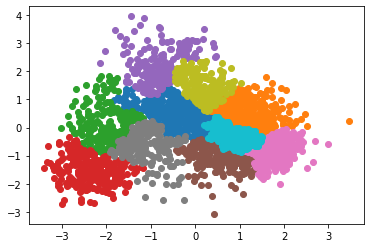

Sillhouette score:  0.4198165969135667
Percentage score:  0.7099082984567834
---
n: 11


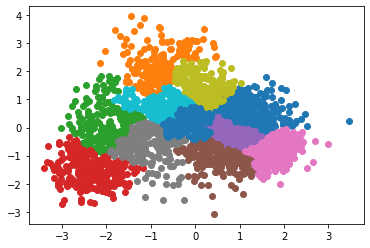

Sillhouette score:  0.4135175649697842
Percentage score:  0.7067587824848921
---
n: 12


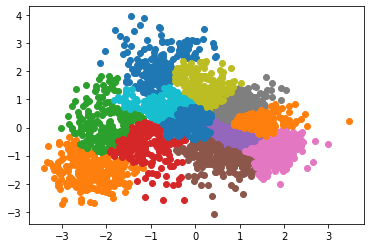

Sillhouette score:  0.4138163705123677
Percentage score:  0.7069081852561838
---
n: 13


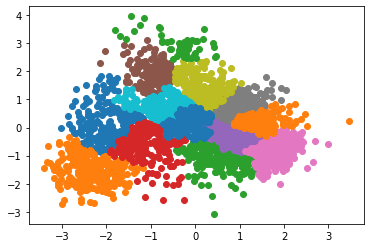

Sillhouette score:  0.4188702536307689
Percentage score:  0.7094351268153845
---
n: 14


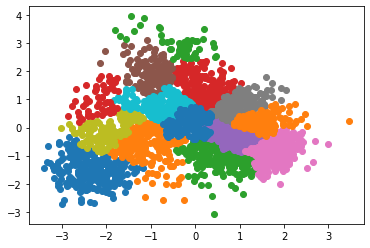

Sillhouette score:  0.41103574081197736
Percentage score:  0.7055178704059887
---


In [ ]:
vary_n_of_clusters(df, cluster_with_birch)

n: 2


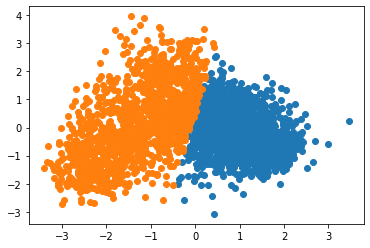

Sillhouette score:  0.5771818502174023
Percentage score:  0.7885909251087011
---
n: 3


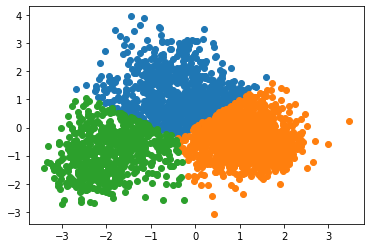

Sillhouette score:  0.6486453375232656
Percentage score:  0.8243226687616327
---
n: 4


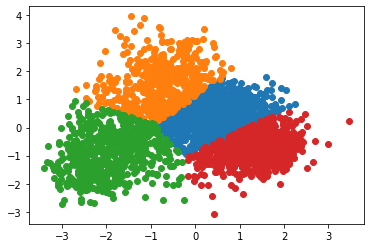

Sillhouette score:  0.5481684512049744
Percentage score:  0.7740842256024871
---
n: 5


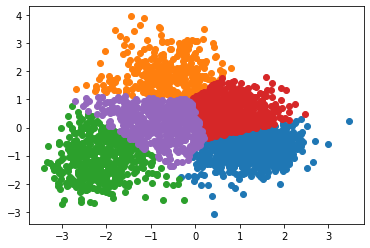

Sillhouette score:  0.5513848914746441
Percentage score:  0.775692445737322
---
n: 6


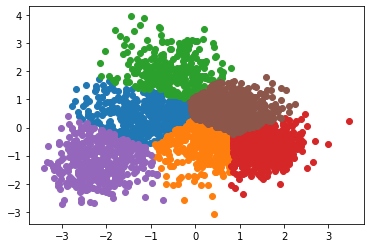

Sillhouette score:  0.5486352743084424
Percentage score:  0.7743176371542212
---
n: 7


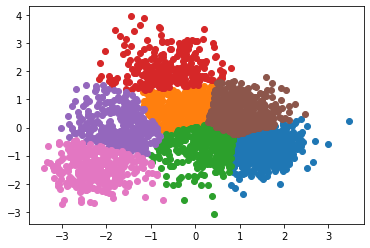

Sillhouette score:  0.5287673315234486
Percentage score:  0.7643836657617242
---
n: 8


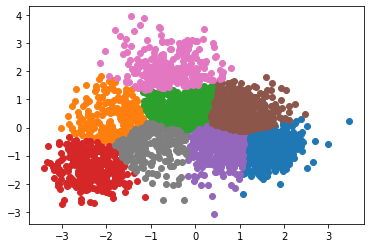

Sillhouette score:  0.5202849539735614
Percentage score:  0.7601424769867807
---
n: 9


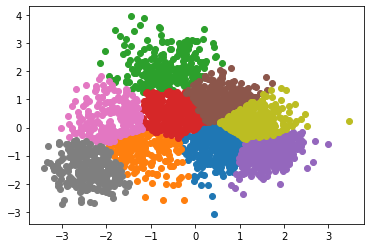

Sillhouette score:  0.5108088687094825
Percentage score:  0.7554044343547412
---
n: 10


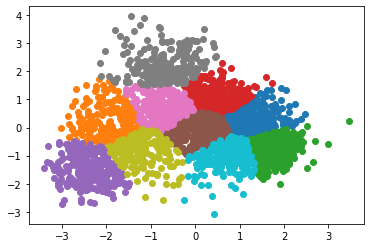

Sillhouette score:  0.5015365237497178
Percentage score:  0.7507682618748589
---
n: 11


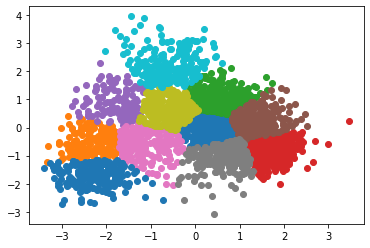

Sillhouette score:  0.5020942474217313
Percentage score:  0.7510471237108656
---
n: 12


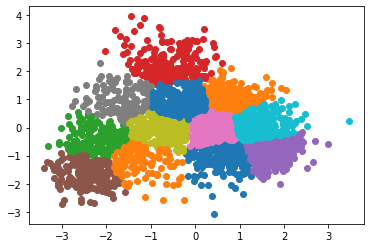

Sillhouette score:  0.4901820608879375
Percentage score:  0.7450910304439687
---
n: 13


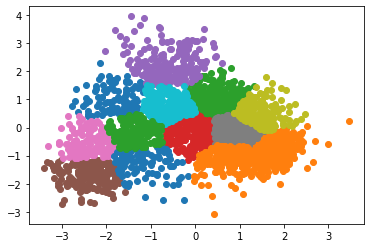

Sillhouette score:  0.4990464099192474
Percentage score:  0.7495232049596237
---
n: 14


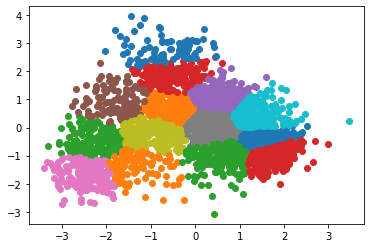

Sillhouette score:  0.4839539355455247
Percentage score:  0.7419769677727623
---


In [ ]:
vary_n_of_clusters(df, cluster_with_kmeans)

n: 2


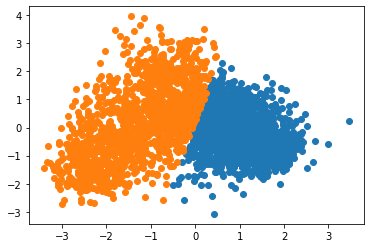

Sillhouette score:  0.5735435972349713
Percentage score:  0.7867717986174856
---
n: 3


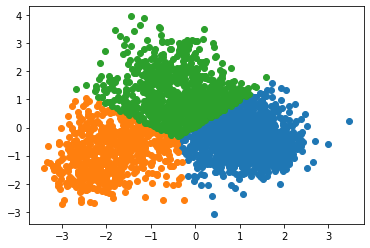

Sillhouette score:  0.6472698933964474
Percentage score:  0.8236349466982237
---
n: 4


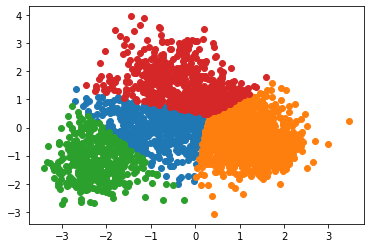

Sillhouette score:  0.5835915889828417
Percentage score:  0.7917957944914209
---
n: 5


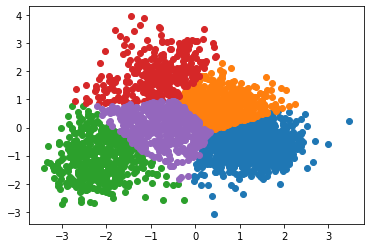

Sillhouette score:  0.5504314003340177
Percentage score:  0.7752157001670088
---
n: 6


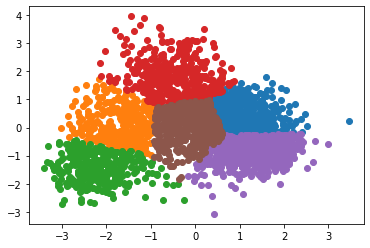

Sillhouette score:  0.5257973361806368
Percentage score:  0.7628986680903185
---
n: 7


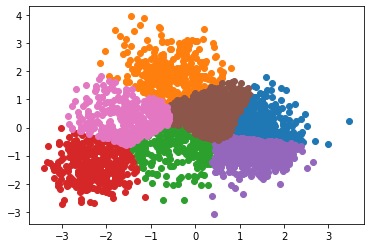

Sillhouette score:  0.4963481809543295
Percentage score:  0.7481740904771648
---
n: 8


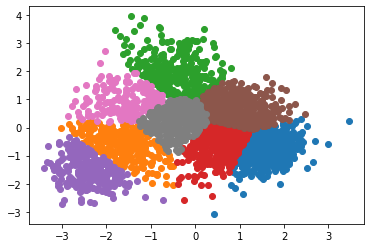

Sillhouette score:  0.49469215126616056
Percentage score:  0.7473460756330803
---
n: 9


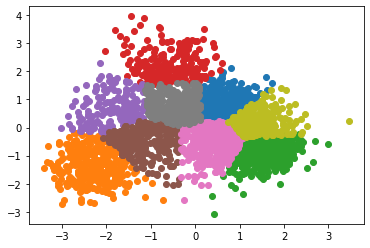

Sillhouette score:  0.4981061222632178
Percentage score:  0.7490530611316089
---
n: 10


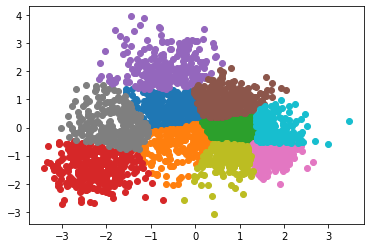

Sillhouette score:  0.48135899257835446
Percentage score:  0.7406794962891772
---
n: 11


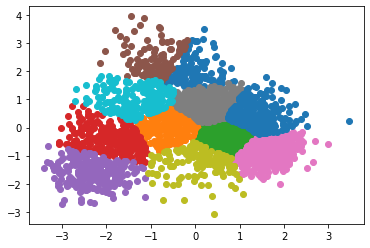

Sillhouette score:  0.4846957138036949
Percentage score:  0.7423478569018475
---
n: 12


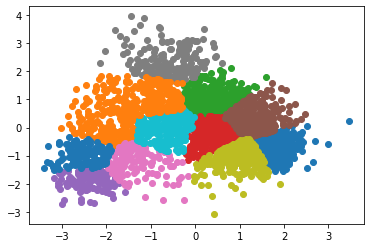

Sillhouette score:  0.47009020083288117
Percentage score:  0.7350451004164406
---
n: 13


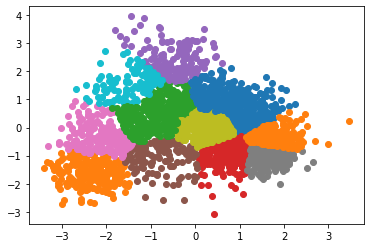

Sillhouette score:  0.463739577627216
Percentage score:  0.731869788813608
---
n: 14


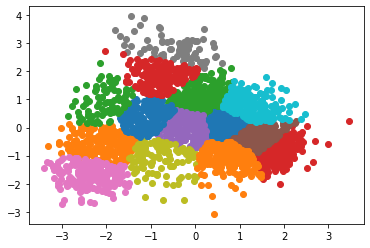

Sillhouette score:  0.46115269360091815
Percentage score:  0.7305763468004591
---


In [ ]:
vary_n_of_clusters(df, cluster_with_mini_batch_kmeans)

n: 2


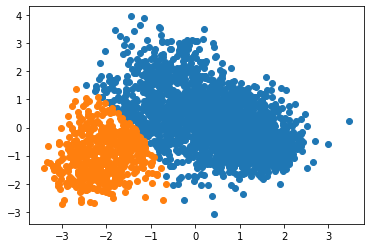

Sillhouette score:  0.5863833677565693
Percentage score:  0.7931916838782846
---
n: 3


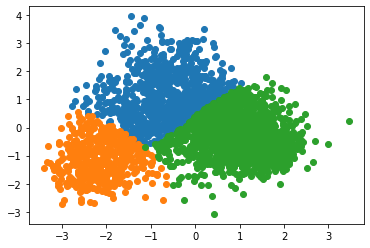

Sillhouette score:  0.6294750148487545
Percentage score:  0.8147375074243772
---
n: 4


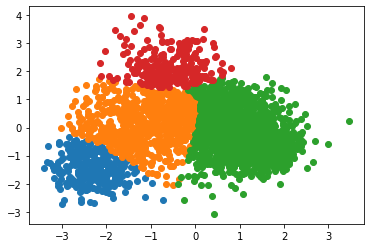

Sillhouette score:  0.547681970106509
Percentage score:  0.7738409850532545
---
n: 5


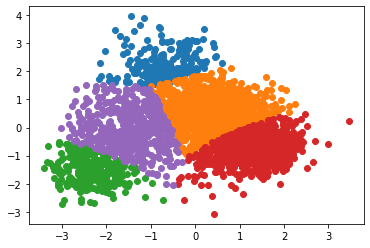

Sillhouette score:  0.49601005724949737
Percentage score:  0.7480050286247487
---
n: 6


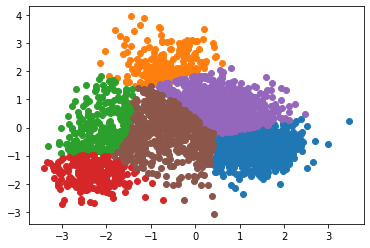

Sillhouette score:  0.4854926989777765
Percentage score:  0.7427463494888883
---
n: 7


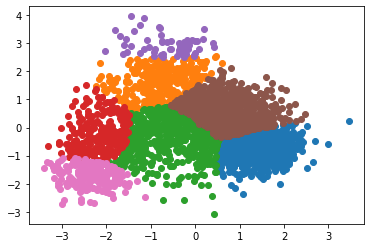

Sillhouette score:  0.47120487420566304
Percentage score:  0.7356024371028316
---
n: 8


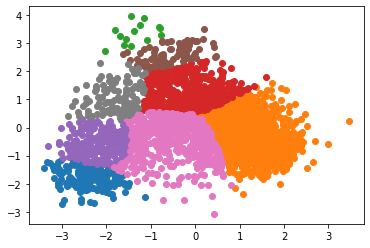

Sillhouette score:  0.46580730123005837
Percentage score:  0.7329036506150292
---
n: 9


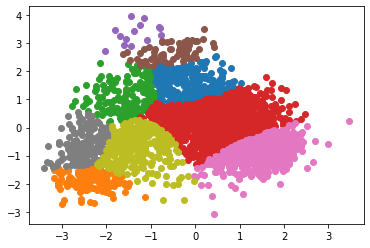

Sillhouette score:  0.38138345224896564
Percentage score:  0.6906917261244828
---
n: 10


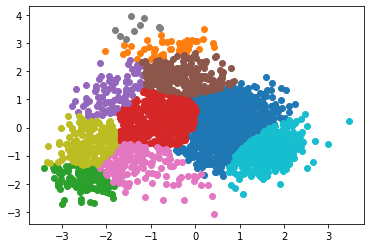

Sillhouette score:  0.40363997214832426
Percentage score:  0.7018199860741621
---
n: 11


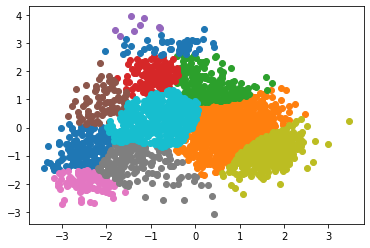

Sillhouette score:  0.3952929337534631
Percentage score:  0.6976464668767315
---
n: 12


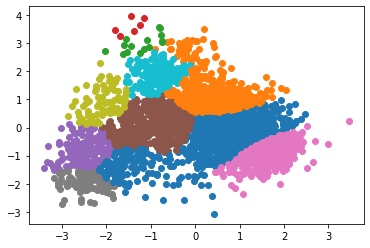

Sillhouette score:  0.4049223806807436
Percentage score:  0.7024611903403718
---
n: 13


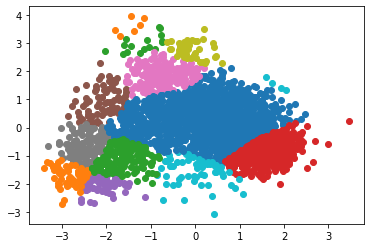

Sillhouette score:  0.3569380745318237
Percentage score:  0.6784690372659119
---
n: 14


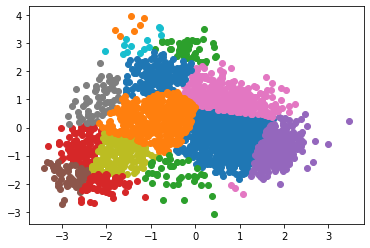

Sillhouette score:  0.3682843579504113
Percentage score:  0.6841421789752057
---


In [ ]:
vary_n_of_clusters(df, spectral_clustering)

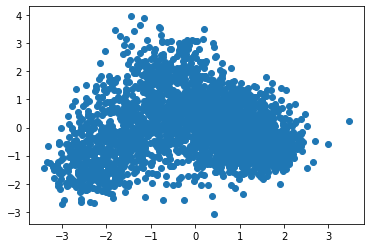

In [ ]:
try: mean_shift_clustering(df)
except: pass

n: 4


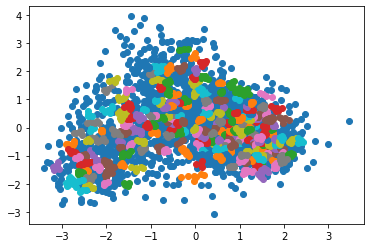

Sillhouette score:  -0.037590661099243645
Percentage score:  0.48120466945037815
---
n: 5


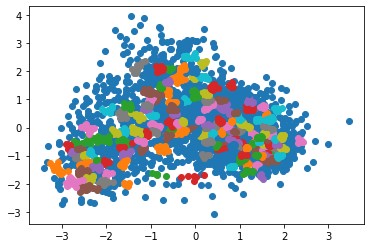

Sillhouette score:  -0.11673202309374947
Percentage score:  0.4416339884531253
---
n: 6


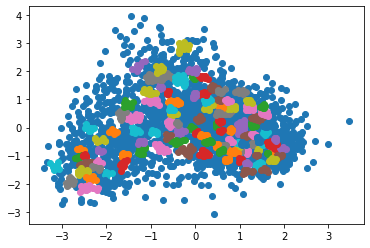

Sillhouette score:  -0.2126360322488325
Percentage score:  0.39368198387558373
---
n: 7


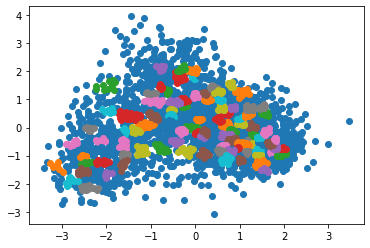

Sillhouette score:  -0.23276420317930233
Percentage score:  0.3836178984103488
---
n: 8


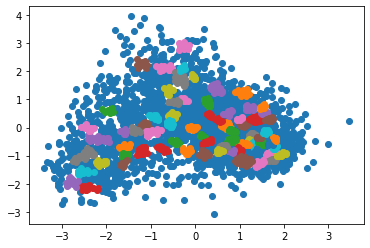

Sillhouette score:  -0.3014051801392897
Percentage score:  0.3492974099303552
---
n: 9


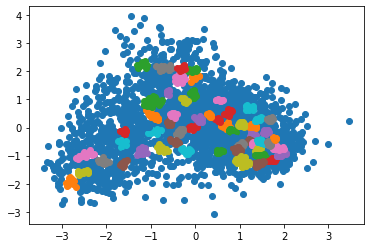

Sillhouette score:  -0.432284825736571
Percentage score:  0.2838575871317145
---
n: 10


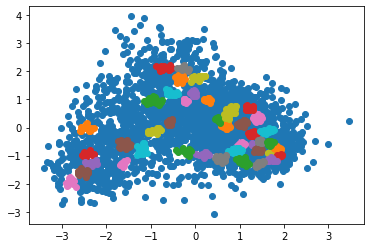

Sillhouette score:  -0.4808299345269189
Percentage score:  0.25958503273654054
---
n: 11


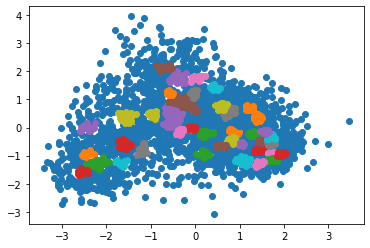

Sillhouette score:  -0.43405845182468905
Percentage score:  0.2829707740876555
---
n: 12


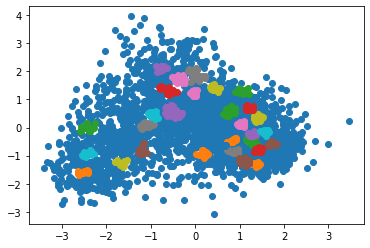

Sillhouette score:  -0.5567691769107677
Percentage score:  0.22161541154461617
---
n: 13


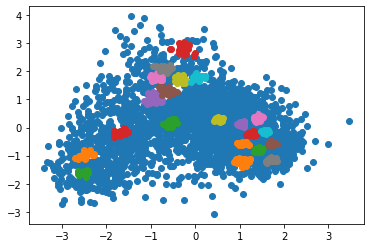

Sillhouette score:  -0.6425591148074885
Percentage score:  0.17872044259625575
---
n: 14


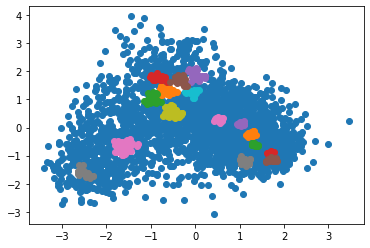

Sillhouette score:  -0.6848257536362191
Percentage score:  0.15758712318189044
---


In [ ]:
vary_min_samples(df, cluster_with_optics)

---

info retained:  [0.07720562 0.05007759 0.04739519 0.04237879 0.0362074 ]


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



[]

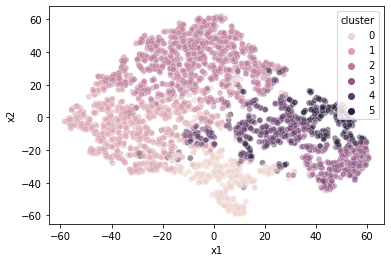

In [ ]:
plot_clusters(make_df(hi_en_graph))

'https://machinelearningmastery.com/clustering-algorithms-with-python/'